# 06 - Polar Diagnostics and Projection Comparison

This notebook checks the anatomical reference used to build LV scar polar maps, then compares vertex, area, and surface-normalized projection summaries.

The key convention is consistent across the notebook: the long axis is aligned apex-to-base, the RV/septal reference defines theta=0, and 3D apex-to-base displays are rolled by 45 degrees so the blue septal vector points toward 10:30.

| Section | Contents |
|---|---|
| 1 | Imports, data loading, clinical sex labels, and shared helpers |
| 2 | D1-D5 septal-reference diagnostics plus raw LV PCA axis vs robust axis |
| 3 | Polar-map computational steps, all-case trial maps, and population superposition |
| 4 | Polar-map quality checks |
| 5 | Vertex vs area vs surface-normalized comparison |



## Section 1 - Setup, Data Loading, and Shared Helpers

### 1.1 Imports and Configuration


In [3]:
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pyvista as pv
from scipy.signal import find_peaks
from scipy.ndimage import uniform_filter1d
from tqdm import tqdm


def find_project_root():
    for base in [Path.cwd(), *Path.cwd().parents]:
        for candidate in (base, base / 'lv-scar-segmentation'):
            if (candidate / 'src' / 'data_loading.py').exists():
                return candidate.resolve()
    raise FileNotFoundError('Could not locate lv-scar-segmentation from the current working directory.')


ROOT = find_project_root()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

# Pick up local edits to src modules when the notebook kernel has been reused.
for mod in [m for m in list(sys.modules) if m == 'src' or m.startswith('src.')]:
    del sys.modules[mod]

from src.data_loading import scan
from src.mesh_utils import best_shell, get_cz_mesh, best_rv_mesh
from src.lv_geometry import (
    long_axis,
    plane_basis,
    rv_reference_pca,
    rv_reference_from_rv_mesh,
    oriented_septal_reference,
    compute_transform,
    apply_transform,
    rotation_about_z,
    prepare_polar_geometry,
    project_points_to_polar,
    polar_mask,
)

HD_ROOT      = r'F:/RM_TEKNON_DEVELOP'
CLINICAL_CSV = Path(r'C:/Users/joan/Desktop/FEINA/UPF/TFG/develop-vt.csv')
RESULTS      = ROOT / 'results'
OUT        = RESULTS / 'M03_polar_diagnostics'
OUT.mkdir(parents=True, exist_ok=True)

N_R     = 64
N_THETA = 128

DIP_Z_LO        = 0.60
DIP_Z_HI        = 0.85
DIP_SMOOTH_BINS = 7
DIP_N_BINS      = 180

AHA_DISPLAY_DEG = 0.0    # no roll: septal/RV vector stays at West (9 o'clock)

D1_N = 16   # cases in basal ring visual
D4_N = 12   # cases in 3D alignment grid
SEED = 42

pv.set_jupyter_backend('static')
plt.rcParams['figure.dpi'] = 120
print(f'Project root: {ROOT}')
print('Config done.')

Project root: C:\Users\joan\Desktop\FEINA\UPF\TFG\repo\scar-char-v0.1\lv-scar-segmentation
Config done.


### 1.2 Data Loading and Full Cohort


In [4]:
all_cases = scan(HD_ROOT)

known = [
    c for c in all_cases
    if c.tissue_surfaces.get('core') is not None
    and best_shell(c) is not None
]

rng = np.random.default_rng(SEED)
order = rng.permutation(len(known))
known = [known[i] for i in order]   # fixed shuffle for stable diagnostic subsets

n_rv = sum(1 for c in known if best_rv_mesh(c) is not None)
print(f'Full CZ cohort with shell : {len(known)}')
print(f'  of which have RV mesh   : {n_rv} ({100*n_rv/max(len(known),1):.0f}%)')

# Clinical sex labels for population superposition by sex.
# clinical_data.py maps SEXO -> sex (1 = male, 2 = female).
sex_map = {}  # patient_id (str) -> 'M' or 'F'
try:
    from src.clinical_data import load as _load_clinical
    if CLINICAL_CSV is not None and Path(CLINICAL_CSV).exists():
        _clin = _load_clinical(CLINICAL_CSV)
        if {'patient_id', 'sex'}.issubset(_clin.columns):
            for _, _row in _clin[['patient_id', 'sex']].dropna().iterrows():
                _pid = str(_row['patient_id']).strip()
                if _pid.endswith('.0'):
                    _pid = _pid[:-2]
                _sex = int(_row['sex'])
                if _sex in (1, 2):
                    sex_map[_pid] = 'M' if _sex == 1 else 'F'
            print(f'Sex labels loaded       : {len(sex_map)} patients  '
                  f"M={sum(v == 'M' for v in sex_map.values())}  "
                  f"F={sum(v == 'F' for v in sex_map.values())}")
        else:
            print('Clinical CSV has no patient_id/sex columns; sex split skipped.')
    else:
        print(f'Clinical CSV not found: {CLINICAL_CSV}; sex split skipped.')
except Exception as _exc:
    print(f'Clinical sex loading failed: {_exc}')


Full CZ cohort with shell : 105
  of which have RV mesh   : 105 (100%)
Sex labels loaded       : 94 patients  M=79  F=15


### 1.3 Shared Reference and Polar Helpers


In [5]:
def _rv_reference_dip(lv_mesh, axis, apex,
                      z_lo=DIP_Z_LO, z_hi=DIP_Z_HI,
                      n_bins=DIP_N_BINS, smooth=DIP_SMOOTH_BINS):
    """Method A: midpoint of two deepest radial dips in the basal ring."""
    u, w = plane_basis(axis)
    pts  = np.asarray(lv_mesh.points)
    proj = (pts - apex) @ axis
    span = proj.max() - proj.min()
    mask = (proj >= z_lo * span) & (proj <= z_hi * span)
    ring = pts[mask]
    if len(ring) < 20:
        return u
    diff     = ring - (apex + np.outer((ring - apex) @ axis, axis))
    centroid = diff.mean(axis=0)
    diff     = diff - centroid
    angles   = np.arctan2(diff @ w, diff @ u)
    radii    = np.linalg.norm(diff, axis=1)
    bins     = np.linspace(-np.pi, np.pi, n_bins + 1)
    mids     = 0.5 * (bins[:-1] + bins[1:])
    bi       = np.clip(np.digitize(angles, bins) - 1, 0, n_bins - 1)
    envelope = np.zeros(n_bins)
    for b, r in zip(bi, radii):
        envelope[b] = max(envelope[b], r)
    smooth_env = uniform_filter1d(envelope, size=smooth, mode='wrap')
    peaks, _   = find_peaks(-smooth_env, distance=max(3, n_bins // 10))
    if len(peaks) < 2:
        return u
    top2  = peaks[np.argsort(-smooth_env[peaks])[:2]]
    a1, a2 = mids[top2[0]], mids[top2[1]]
    mid_angle = np.arctan2(np.sin(a1) + np.sin(a2), np.cos(a1) + np.cos(a2))
    return np.cos(mid_angle) * u + np.sin(mid_angle) * w


def _ring_debug_data(lv_mesh, axis, apex, rv_mesh=None,
                     z_lo=DIP_Z_LO, z_hi=DIP_Z_HI,
                     n_bins=DIP_N_BINS, smooth=DIP_SMOOTH_BINS):
    """Basal ring 2D data + all three reference arrows."""
    u, w  = plane_basis(axis)
    pts   = np.asarray(lv_mesh.points)
    proj  = (pts - apex) @ axis
    span  = proj.max() - proj.min()
    mask  = (proj >= z_lo * span) & (proj <= z_hi * span)
    ring  = pts[mask]
    if len(ring) < 20:
        return None
    diff_3d  = ring - (apex + np.outer((ring - apex) @ axis, axis))
    centroid = diff_3d.mean(axis=0)
    diff_2d  = diff_3d - centroid
    ring_u   = diff_2d @ u
    ring_w   = diff_2d @ w
    radii    = np.sqrt(ring_u**2 + ring_w**2)
    angles   = np.arctan2(ring_w, ring_u)

    bins       = np.linspace(-np.pi, np.pi, n_bins + 1)
    mids       = 0.5 * (bins[:-1] + bins[1:])
    bi         = np.clip(np.digitize(angles, bins) - 1, 0, n_bins - 1)
    envelope   = np.zeros(n_bins)
    for b, r in zip(bi, radii):
        envelope[b] = max(envelope[b], r)
    smooth_env = uniform_filter1d(envelope, size=smooth, mode='wrap')
    all_peaks, _ = find_peaks(-smooth_env, distance=max(3, n_bins // 10))
    top2 = all_peaks[np.argsort(-smooth_env[all_peaks])[:2]] if len(all_peaks) >= 2 else all_peaks

    ref_dip = oriented_septal_reference(_rv_reference_dip(lv_mesh, axis, apex))
    ref_pca = oriented_septal_reference(rv_reference_pca(lv_mesh, axis, apex))
    dir_dip = np.array([ref_dip @ u, ref_dip @ w])
    dir_pca = np.array([ref_pca @ u, ref_pca @ w])

    dir_rv = None
    if rv_mesh is not None:
        ref_rv = oriented_septal_reference(
            rv_reference_from_rv_mesh(lv_mesh, rv_mesh, axis, apex)
        )
        dir_rv = np.array([ref_rv @ u, ref_rv @ w])

    return {
        'ring_u': ring_u, 'ring_w': ring_w, 'radii': radii,
        'mids': mids, 'smooth_env': smooth_env,
        'all_peaks': all_peaks, 'top2': top2,
        'dir_dip': dir_dip, 'dir_pca': dir_pca, 'dir_rv': dir_rv,
    }


def _polar_mask(theta, s, n_r=N_R, n_theta=N_THETA):
    return polar_mask(theta, s, n_r, n_theta, roll_deg=AHA_DISPLAY_DEG)

def _display_roll_matrix(extra_deg=AHA_DISPLAY_DEG):
    # Base pi flip puts the RV/septal vector on the left; roll=0 keeps it at West (9 o'clock).
    return rotation_about_z(np.pi + np.deg2rad(float(extra_deg)))


def _septal_centroid_vector(lv_mesh_t, rv_mesh_t):
    if rv_mesh_t is None:
        return None, None, None
    lv_centroid = np.asarray(lv_mesh_t.points).mean(axis=0)
    rv_centroid = np.asarray(rv_mesh_t.points).mean(axis=0)
    septal_vec = rv_centroid - lv_centroid
    return lv_centroid, rv_centroid, septal_vec


def _add_septal_vector(pl, lv_mesh_t, rv_mesh_t, span, color='dodgerblue'):
    lv_centroid, rv_centroid, septal_vec = _septal_centroid_vector(lv_mesh_t, rv_mesh_t)
    if lv_centroid is None:
        return
    pl.add_arrows(lv_centroid[np.newaxis], septal_vec[np.newaxis], color=color, mag=1.0)
    pl.add_mesh(pv.Sphere(radius=0.04 * span, center=rv_centroid),
                color=color, smooth_shading=True, show_scalar_bar=False)


def _mark_septal_point(ax, theta=np.deg2rad(60), radius=1.04):
    # Blue dot marks upper RV insertion (anteroseptal/anterior boundary, ~11 o'clock).
    ax.scatter([theta], [radius], s=26, color='dodgerblue', edgecolor='white',
               linewidth=0.7, zorder=10, clip_on=False)


def _polar_map_for_case(case, use_rv=True):
    """Project CZ to polar. Uses RV mesh for reference if available and use_rv=True."""
    shell = best_shell(case)
    cz    = get_cz_mesh(case)
    if shell is None or cz is None:
        return None
    rv = best_rv_mesh(case) if use_rv else None
    if rv is not None:
        axis, apex = long_axis(shell, rv)
        ref_fn = lambda mesh, ax, ap: rv_reference_from_rv_mesh(mesh, rv, ax, ap)
        geom = prepare_polar_geometry(shell, ref_fn=ref_fn, rv_mesh=rv)
    else:
        geom = prepare_polar_geometry(shell, rv_mesh=rv)
    theta, s = project_points_to_polar(cz.points, geom)
    # Bake clockwise anatomical orientation: theta=0=septum/RV=West, increasing CW
    # so ANT=top, LAT=right, INF=bottom - matches set_theta_zero_location(W) + direction=-1
    theta = (2.0 * np.pi - theta) % (2.0 * np.pi)
    return _polar_mask(theta, s)


def _draw_bullseye_grid(ax):
    t = np.linspace(0, 2 * np.pi, 361)
    for r in (0.25, 0.50, 0.75, 1.0):
        ax.plot(t, np.full_like(t, r), color='#555', lw=0.6, alpha=0.6)
    for deg in (0, 60, 120, 180, 240, 300):
        ax.plot([np.deg2rad(deg)]*2, [0.5, 1.0], color='#555', lw=0.6, alpha=0.6)
    for deg in (45, 135, 225, 315):
        ax.plot([np.deg2rad(deg)]*2, [0.0, 0.5], color='#555', lw=0.6, alpha=0.6)
    ax.set_theta_zero_location('W')
    ax.set_theta_direction(-1)
    ax.set_rticks([])
    ax.set_xticks([])
    _mark_septal_point(ax)


print('Helpers ready.')

Helpers ready.


## Section 2 - Septal Reference and Axis Diagnostics

This section validates the reference direction and long-axis orientation before polar maps are computed.

| Diagnostic | Name | Purpose |
|---|---|---|
| D1 | Basal ring reference arrows | Visual agreement of dip, PCA, and RV-mesh references |
| D2 | Angular disagreement | Quantifies Method A/B/C disagreement per case |
| D3 | Raw ADAS direction clustering | Checks whether world coordinates are consistent across patients |
| D4 | Five-row 3D alignment grid | Shows raw, long-axis, anatomical, and apex-to-base views |
| D5 | Long-axis and RV mesh overlay | Verifies apex/base axis and RV side in two views |
| Axis diagnostic | Raw PCA vs robust axis | Directly compares naive LV SVD PC1 with `long_axis()` |


### D1 - Basal Ring Reference Arrows

**How to read this plot:**
- Each panel = basal cross-section (60-85% up from apex), viewed from apex toward base
- Dots = LV wall ring points; color = distance from centroid (yellow = far, dark = close)
- Healthy shape: kidney/crescent - the flat/concave side is where RV inserts
- **Red arrow** = Method A (dip midpoint)
- **Blue arrow** = Method B (PCA concave half)
- **Green arrow** = Method C (RV centroid, ground truth - only when RV mesh present)
- **Red dots** = top-2 dip points selected by Method A (should be RV attachment sites)
- **x marks** = all detected radial minima

**Why some arrows are missing:**
- *All arrows absent* - `_ring_debug_data` returned `None`: fewer than 20 ring points
  were found in the 60-85% basal slice (sparse or heavily truncated mesh)
- *Green arrow absent* - no RV mesh available for that case (Method C requires RV surface)
- *Red/Blue arrows absent but ring visible* - peak detection found < 2 dip candidates

A good reference: all arrows agree AND point toward the visible concavity.


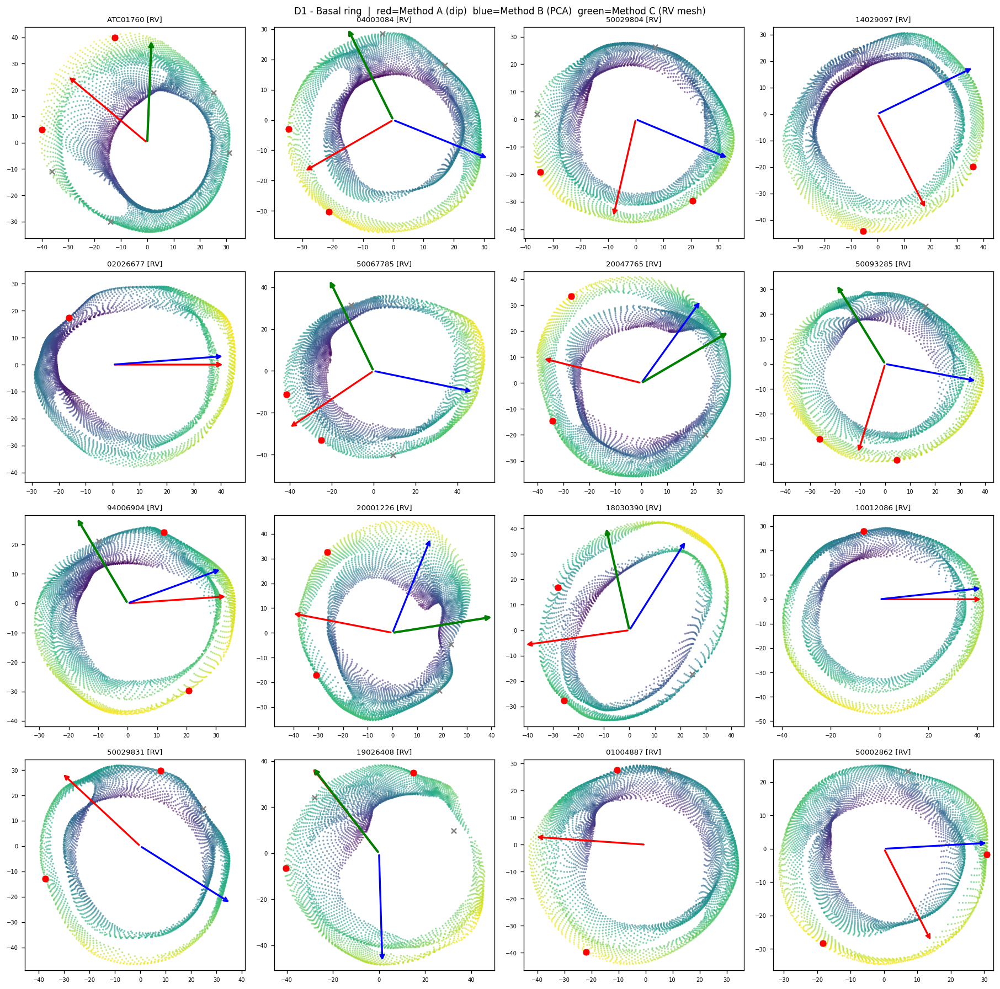

In [6]:
d1_data = []
for case in known[:D1_N]:
    shell = best_shell(case)
    rv    = best_rv_mesh(case)
    if shell is None:
        d1_data.append(None)
        continue
    axis, apex = long_axis(shell, rv)
    d = _ring_debug_data(shell, axis, apex, rv_mesh=rv)
    if d is not None:
        d['key'] = f'{case.year}/{case.patient_id}'
        d['has_rv'] = rv is not None
    d1_data.append(d)

ncols = 4
nrows = int(np.ceil(D1_N / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 3.8, nrows * 3.8))
fig.suptitle(
    'D1 - Basal ring  |  red=Method A (dip)  blue=Method B (PCA)  green=Method C (RV mesh)',
    fontsize=10,
)
for ax, d in zip(axes.flat, d1_data):
    if d is None:
        ax.axis('off')
        continue
    ax.scatter(d['ring_u'], d['ring_w'], c=d['radii'],
               cmap='viridis', s=4, alpha=0.6, linewidths=0)
    r_scale = d['radii'].max() * 0.9
    ax.annotate('', xy=r_scale * d['dir_dip'], xytext=(0, 0),
                arrowprops=dict(arrowstyle='->', color='red', lw=2.0))
    ax.annotate('', xy=r_scale * d['dir_pca'], xytext=(0, 0),
                arrowprops=dict(arrowstyle='->', color='blue', lw=2.0))
    if d['dir_rv'] is not None:
        ax.annotate('', xy=r_scale * d['dir_rv'], xytext=(0, 0),
                    arrowprops=dict(arrowstyle='->', color='green', lw=2.5))
    mids, env = d['mids'], d['smooth_env']
    for pi in d['all_peaks']:
        ax.scatter(env[pi]*np.cos(mids[pi]), env[pi]*np.sin(mids[pi]),
                   marker='x', color='gray', s=30, zorder=5)
    for pi in d['top2']:
        ax.scatter(env[pi]*np.cos(mids[pi]), env[pi]*np.sin(mids[pi]),
                   marker='o', color='red', s=40, zorder=6)
    _, pid = d['key'].split('/')
    rv_tag = ' [RV]' if d['has_rv'] else ''
    ax.set_title(f'{pid}{rv_tag}', fontsize=8)
    ax.set_aspect('equal', adjustable='datalim')
    ax.tick_params(labelsize=6)

for ax in axes.flat[len(d1_data):]:
    ax.axis('off')
plt.tight_layout()
plt.savefig(OUT / 'd1_basal_ring_arrows.png', bbox_inches='tight')
plt.show()

### D2 - Distribution of Angular Disagreement

For all cases, this histogram shows the circular angular difference between reference methods. When the RV mesh is available, Method C is the anatomical reference.


In [7]:
d2_rows = []
for case in tqdm(known, desc='D2 disagreements'):
    shell = best_shell(case)
    rv    = best_rv_mesh(case)
    if shell is None:
        continue
    axis, apex = long_axis(shell, rv)
    u, w = plane_basis(axis)
    try:
        ra = oriented_septal_reference(_rv_reference_dip(shell, axis, apex))
        rb = oriented_septal_reference(rv_reference_pca(shell, axis, apex))
    except Exception:
        continue
    a_dip = np.arctan2(ra @ w, ra @ u)
    a_pca = np.arctan2(rb @ w, rb @ u)

    def _circ_diff_deg(a1, a2):
        return float(np.degrees(abs(np.arctan2(np.sin(a1-a2), np.cos(a1-a2)))))

    row = {
        'key': f'{case.year}/{case.patient_id}',
        'diff_AB': _circ_diff_deg(a_dip, a_pca),
        'diff_AC': np.nan, 'diff_BC': np.nan,
        'has_rv': rv is not None,
    }
    if rv is not None:
        try:
            rc = oriented_septal_reference(rv_reference_from_rv_mesh(shell, rv, axis, apex))
            a_rv = np.arctan2(rc @ w, rc @ u)
            row['diff_AC'] = _circ_diff_deg(a_dip, a_rv)
            row['diff_BC'] = _circ_diff_deg(a_pca, a_rv)
        except Exception:
            pass
    d2_rows.append(row)

d2_rows.sort(key=lambda r: r['diff_AB'], reverse=True)
diffs_AB = np.array([r['diff_AB'] for r in d2_rows])
diffs_AC = np.array([r['diff_AC'] for r in d2_rows if not np.isnan(r['diff_AC'])])
diffs_BC = np.array([r['diff_BC'] for r in d2_rows if not np.isnan(r['diff_BC'])])

print(f'Cases total         : {len(d2_rows)}')
print(f'Cases with RV mesh  : {sum(r["has_rv"] for r in d2_rows)}')
print()
print(f'A vs B  median={np.median(diffs_AB):.1f} deg   > 45 deg: {(diffs_AB>45).sum()}')
if len(diffs_AC):
    print(f'A vs C  median={np.median(diffs_AC):.1f} deg   > 45 deg: {(diffs_AC>45).sum()}  (n={len(diffs_AC)})')
    print(f'B vs C  median={np.median(diffs_BC):.1f} deg   > 45 deg: {(diffs_BC>45).sum()}  (n={len(diffs_BC)})')

D2 disagreements: 100%|██████████| 105/105 [00:20<00:00,  5.09it/s]

Cases total         : 105
Cases with RV mesh  : 105

A vs B  median=92.5 deg   > 45 deg: 77
A vs C  median=87.2 deg   > 45 deg: 92  (n=105)
B vs C  median=108.3 deg   > 45 deg: 99  (n=105)


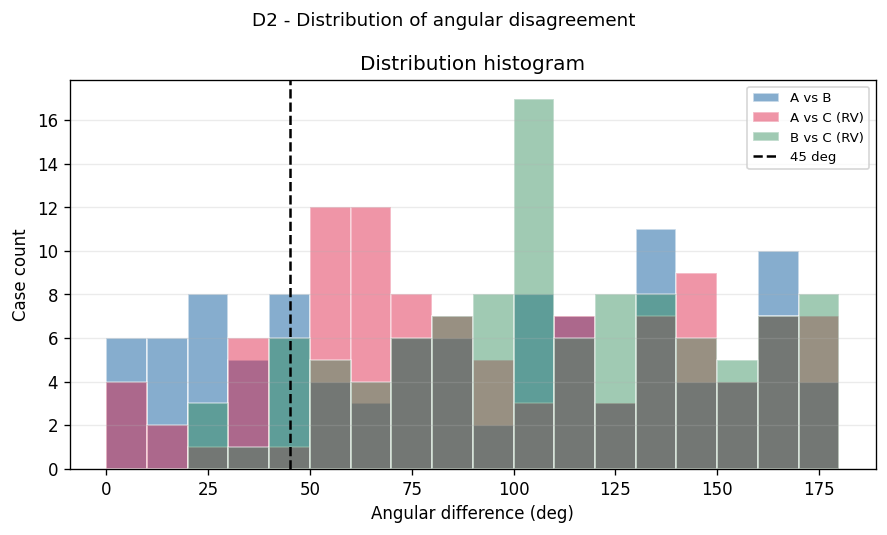

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(7.5, 4.5))
fig.suptitle('D2 - Distribution of angular disagreement', fontsize=11)

bins = np.linspace(0, 180, 19)
ax.hist(diffs_AB, bins=bins, alpha=0.65, label='A vs B', color='steelblue', edgecolor='white')
if len(diffs_AC):
    ax.hist(diffs_AC, bins=bins, alpha=0.45, label='A vs C (RV)', color='crimson', edgecolor='white')
    ax.hist(diffs_BC, bins=bins, alpha=0.45, label='B vs C (RV)', color='seagreen', edgecolor='white')
ax.axvline(45, color='black', lw=1.5, ls='--', label='45 deg')
ax.set_xlabel('Angular difference (deg)')
ax.set_ylabel('Case count')
ax.set_title('Distribution histogram')
ax.grid(axis='y', alpha=0.25)
ax.legend(fontsize=8)

plt.tight_layout()
plt.savefig(OUT / 'd2_angular_disagreement_histogram.png', bbox_inches='tight')
plt.show()


### D3 - Septal Direction in Raw ADAS Coordinates

Compute RV-based (Method C) and PCA (Method B) septal direction **in original
mesh coordinates**, before any transform.

**How to read the scatter plots:**
- Each dot = one patient's septal reference vector (unit vector in 3-D world space)
- Three projection planes shown: X-Y, X-Z, Y-Z
- Black dot = mean vector; dashed circle = unit sphere boundary
- **Tight cluster -> low circular std**: ADAS acquires patients in a consistent
  orientation and the raw coordinate alone partially encodes the septal direction
- **Scattered cloud -> high circular std**: patients are positioned differently;
  septal direction is unreliable in world coords and *must* be derived per-patient
  from the mesh (ring dips or RV centroid)

Low circ-std (< 45 deg) is NOT required for the pipeline to work - we always
compute per-patient references.  High std simply means world coords are ambiguous.


In [9]:
d3_pca, d3_rv = [], []
for case in tqdm(known, desc='D3 world directions'):
    shell = best_shell(case)
    rv    = best_rv_mesh(case)
    if shell is None:
        continue
    axis, apex = long_axis(shell, rv)
    try:
        ref_pca = oriented_septal_reference(rv_reference_pca(shell, axis, apex))
        d3_pca.append(ref_pca)
    except Exception:
        pass
    if rv is not None:
        try:
            ref_rv = oriented_septal_reference(rv_reference_from_rv_mesh(shell, rv, axis, apex))
            d3_rv.append(ref_rv)
        except Exception:
            pass

def _circ_std_xy(vecs):
    vecs = np.array(vecs)
    angles = np.arctan2(vecs[:, 1], vecs[:, 0])
    R = np.sqrt(np.mean(np.cos(angles))**2 + np.mean(np.sin(angles))**2)
    return float(np.degrees(np.sqrt(-2 * np.log(R + 1e-12))))

print(f'PCA vectors : {len(d3_pca)}   circ-std XY = {_circ_std_xy(d3_pca):.1f} deg')
if d3_rv:
    print(f'RV  vectors : {len(d3_rv)}   circ-std XY = {_circ_std_xy(d3_rv):.1f} deg')
print()
print('Low circ-std (< 45 deg) = vectors cluster = ADAS coordinates consistent')
print('High circ-std (> 45 deg) = vectors scatter = reference unreliable in world coords')

D3 world directions:   0%|          | 0/105 [00:00<?, ?it/s]

D3 world directions: 100%|██████████| 105/105 [00:16<00:00,  6.28it/s]

PCA vectors : 105   circ-std XY = 93.8 deg
RV  vectors : 105   circ-std XY = 13.8 deg

Low circ-std (< 45 deg) = vectors cluster = ADAS coordinates consistent
High circ-std (> 45 deg) = vectors scatter = reference unreliable in world coords


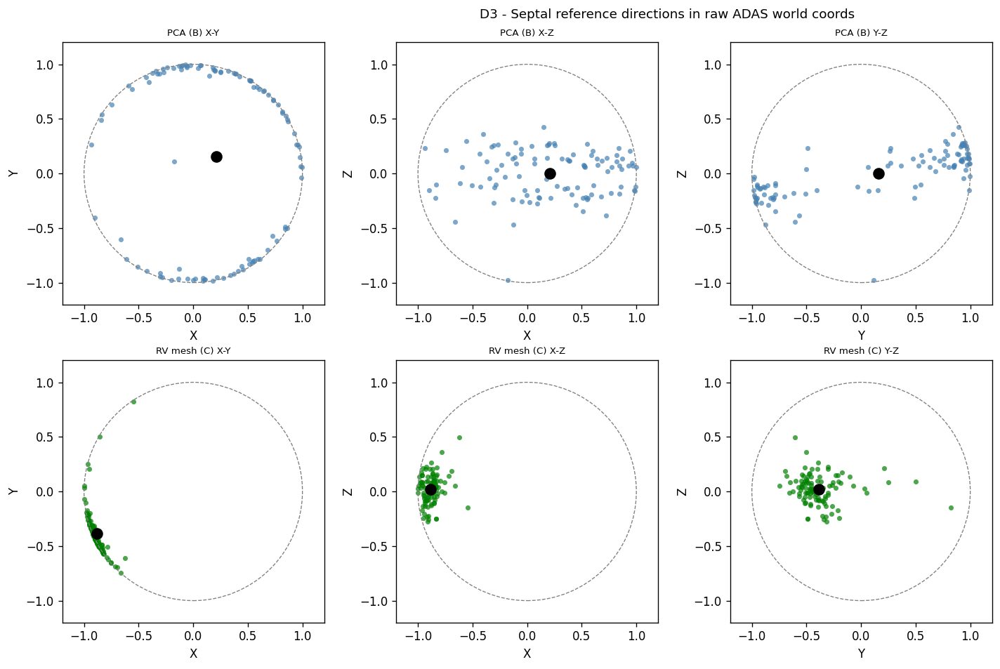

In [10]:
def _scatter_projections(fig, base_idx, vecs, label, color):
    vecs = np.array(vecs)
    pairs = [('X','Y',0,1), ('X','Z',0,2), ('Y','Z',1,2)]
    for pi, (lx, ly, ix, iy) in enumerate(pairs):
        ax = fig.add_subplot(2, 4, base_idx + pi)
        ax.scatter(vecs[:, ix], vecs[:, iy], s=18, alpha=0.7, color=color, linewidths=0)
        mean_v = vecs.mean(axis=0)
        ax.scatter([mean_v[ix]], [mean_v[iy]], s=80, color='black', zorder=5)
        circle = plt.Circle((0, 0), 1.0, fill=False, color='gray', lw=0.8, ls='--')
        ax.add_patch(circle)
        ax.set_xlim(-1.2, 1.2); ax.set_ylim(-1.2, 1.2)
        ax.set_aspect('equal')
        ax.set_xlabel(lx); ax.set_ylabel(ly)
        ax.set_title(f'{label} {lx}-{ly}', fontsize=8)

fig = plt.figure(figsize=(16, 8))
fig.suptitle('D3 - Septal reference directions in raw ADAS world coords', fontsize=11)

_scatter_projections(fig, 1, d3_pca, 'PCA (B)', 'steelblue')
if d3_rv:
    _scatter_projections(fig, 5, d3_rv, 'RV mesh (C)', 'green')

plt.tight_layout()
plt.savefig(OUT / 'd3_adas_direction_clustering.png', bbox_inches='tight')
plt.show()

### D4 - Five-Row 3D Alignment Grid

Same `D4_N` cases rendered five ways:

| Row | Label | Transform | Note |
|---|---|---|---|
| A | Raw | Raw ADAS (LV + CZ + RV) | Isometric. Raw segmentation output. |
| B | Raw+RV | Raw ADAS + RV only | Side view. Shows LV-RV spatial relationship before alignment. |
| C | Long axis | Long-axis only | +Z = apex-to-base, no in-plane rotation. |
| D | Anatomical | Long-axis + RV septal | +Z = apex-to-base, **RV aligned to +X then flipped to -X for display**. |
| E | Apex view | Apex-to-base view | Polar map viewpoint with RV/septal side visible. |

Rows D and E use Method C (RV mesh) when available, else PCA (marked `[pca]`). Row labels are printed beside every rendered row.

**Interpret**: row C organised but D randomly rotated -> septal alignment wrong.
Row D consistent -> alignment works and polar maps are meaningful.

**`SHOW_LONG_AXIS`**: set `True` in the config cell to draw the long axis as a
green line in rows C, D and E - useful to verify the axis passes through the apex.


In [11]:
# Set True to overlay the long-axis as a green line in aligned renders (rows C-E)
SHOW_LONG_AXIS = True

def _render_panel(case, mode='raw', window_size=(360, 280)):
    shell = best_shell(case)
    cz    = get_cz_mesh(case)
    rv    = best_rv_mesh(case)
    if shell is None:
        return None, ''

    pl = pv.Plotter(off_screen=True, window_size=window_size)
    pl.set_background('white')

    if mode == 'raw':
        pl.add_mesh(shell, color='#cccccc', opacity=0.18, smooth_shading=True, show_scalar_bar=False)
        if cz is not None:
            pl.add_mesh(cz, color='firebrick', opacity=0.9, smooth_shading=True, show_scalar_bar=False)
        if rv is not None:
            pl.add_mesh(rv, color='#aaaaff', opacity=0.25, smooth_shading=True, show_scalar_bar=False)
        pl.view_isometric()
        label = ''

    elif mode == 'long_axis':
        R, apex = compute_transform(shell, align_septum=False, rv_mesh=rv)
        shell_t = apply_transform(shell, R, apex)
        pl.add_mesh(shell_t, color='#cccccc', opacity=0.18, smooth_shading=True, show_scalar_bar=False)
        if cz is not None:
            pl.add_mesh(apply_transform(cz, R, apex), color='firebrick', opacity=0.9,
                        smooth_shading=True, show_scalar_bar=False)
        if rv is not None:
            pl.add_mesh(apply_transform(rv, R, apex), color='#aaaaff', opacity=0.25,
                        smooth_shading=True, show_scalar_bar=False)
        pl.view_xz()
        if SHOW_LONG_AXIS:
            _b_la = np.array(shell_t.bounds, dtype=float)
            _c_la = np.array([(_b_la[0]+_b_la[1])/2, (_b_la[2]+_b_la[3])/2, _b_la[4]])
            _top_la = np.array([(_b_la[0]+_b_la[1])/2, (_b_la[2]+_b_la[3])/2, _b_la[5]])
            pl.add_mesh(pv.Line(_c_la, _top_la), color='green', line_width=3)
        label = ''

    elif mode == 'anatomical':
        axis, apex = long_axis(shell, rv)
        if rv is not None:
            ref_fn = lambda mesh, ax, ap: rv_reference_from_rv_mesh(mesh, rv, ax, ap)
            R, apex = compute_transform(shell, align_septum=True, ref_fn=ref_fn, rv_mesh=rv)
            label = '[rv]'
        else:
            R, apex = compute_transform(shell, align_septum=True, rv_mesh=rv)
            label = '[pca]'
        # 180 deg display flip around Z: RV (+X) -> (-X) = left side of screen
        # polar map reference unchanged; this is display only
        R = rotation_about_z(np.pi) @ R
        shell_t = apply_transform(shell, R, apex)
        b = np.array(shell_t.bounds, dtype=float)
        center = np.array([(b[0]+b[1])/2, (b[2]+b[3])/2, (b[4]+b[5])/2])
        span   = max(b[1]-b[0], b[3]-b[2], b[5]-b[4])
        # RV is now at -X (left); arrow points left to mark it
        pl.add_arrows(center[np.newaxis],
                      np.array([[-span * 0.55, 0.0, 0.0]]),
                      color='red', mag=1.0)
        pl.add_mesh(shell_t, color='#cccccc', opacity=0.18, smooth_shading=True, show_scalar_bar=False)
        if cz is not None:
            pl.add_mesh(apply_transform(cz, R, apex), color='firebrick', opacity=0.9,
                        smooth_shading=True, show_scalar_bar=False)
        if rv is not None:
            pl.add_mesh(apply_transform(rv, R, apex), color='#aaaaff', opacity=0.25,
                        smooth_shading=True, show_scalar_bar=False)
        pl.view_xz()

    elif mode == 'apex_to_base':
        # long-axis + septal aligned + 180 deg flip (same as anatomical)
        # then camera placed at apex looking toward base
        if rv is not None:
            ref_fn = lambda mesh, ax, ap: rv_reference_from_rv_mesh(mesh, rv, ax, ap)
            R, apex_pt = compute_transform(shell, align_septum=True, ref_fn=ref_fn, rv_mesh=rv)
            label = '[rv]'
        else:
            R, apex_pt = compute_transform(shell, align_septum=True, rv_mesh=rv)
            label = '[pca]'
        R = rotation_about_z(np.pi) @ R  # RV -> -X (left)
        shell_t = apply_transform(shell, R, apex_pt)
        b = np.array(shell_t.bounds, dtype=float)
        center = np.array([(b[0]+b[1])/2, (b[2]+b[3])/2, (b[4]+b[5])/2])
        span   = max(b[1]-b[0], b[3]-b[2], b[5]-b[4])
        pl.add_mesh(shell_t, color='#cccccc', opacity=0.20, smooth_shading=True, show_scalar_bar=False)
        if cz is not None:
            pl.add_mesh(apply_transform(cz, R, apex_pt), color='firebrick', opacity=0.95,
                        smooth_shading=True, show_scalar_bar=False)
        if rv is not None:
            pl.add_mesh(apply_transform(rv, R, apex_pt), color='#aaaaff', opacity=0.30,
                        smooth_shading=True, show_scalar_bar=False)
        # camera at apex (-Z side), looking toward base (+Z), Y = anterior = up
        cam_dist = span * 2.0
        pl.camera.position  = (center[0], center[1], b[4] - cam_dist)
        pl.camera.focal_point = tuple(center)
        pl.camera.up = (0.0, -1.0, 0.0)

    elif mode == 'raw_rv':
        # Raw LV + RV, no CZ, side view to show LV-RV spatial relationship
        pl.add_mesh(shell, color='#cccccc', opacity=0.18, smooth_shading=True, show_scalar_bar=False)
        if rv is not None:
            pl.add_mesh(rv, color='#aaaaff', opacity=0.45, smooth_shading=True, show_scalar_bar=False)
        # Side view: +Y -> -Y, +Z up (same as long_axis view)
        pl.view_xz()
        label = '[rv]' if rv is not None else '[no rv]'

    pl.camera.zoom(1.2)
    img = pl.screenshot(None, return_img=True)
    pl.close()
    return img, label


d4_cases  = known[:D4_N]
d4_keys   = [f'{c.year}/{c.patient_id}' for c in d4_cases]
modes     = ['raw', 'raw_rv', 'long_axis', 'anatomical', 'apex_to_base']
row_labels = [
    'A - raw ADAS (LV+CZ+RV, isometric)',
    'B - raw LV+RV side view (no alignment)',
    'C - long-axis aligned only',
    'D - long-axis + septal/RV (red arrow = RV side)',
    'E - apex-to-base (polar map viewpoint)',
]

d4_imgs   = {m: [] for m in modes}
d4_labels = {m: [] for m in modes}
for case in tqdm(d4_cases, desc='D4 rendering'):
    for m in modes:
        img, lbl = _render_panel(case, mode=m)
        d4_imgs[m].append(img)
        d4_labels[m].append(lbl)
print('D4 done.')


D4 rendering:   0%|          | 0/12 [00:00<?, ?it/s]

D4 rendering: 100%|██████████| 12/12 [00:19<00:00,  1.65s/it]

D4 done.


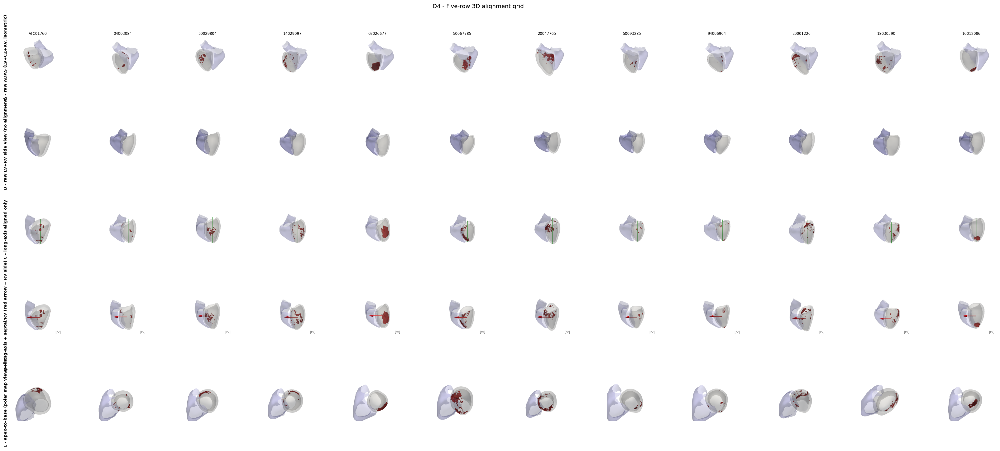

In [12]:
fig, axes = plt.subplots(len(modes), D4_N, figsize=(D4_N * 2.4, len(modes) * 2.4))
fig.suptitle('D4 - Five-row 3D alignment grid', fontsize=11)
for mi, (mode, rlabel) in enumerate(zip(modes, row_labels)):
    for ci, (img, key, lbl) in enumerate(zip(d4_imgs[mode], d4_keys, d4_labels[mode])):
        ax = axes[mi, ci]
        if img is not None:
            ax.imshow(img)
        ax.axis('off')
        if mi == 0:
            ax.set_title(key.split('/')[1], fontsize=7)
        if mi in (2, 3) and lbl:
            ax.text(0.96, 0.04, lbl, transform=ax.transAxes, ha='right', va='bottom',
                    fontsize=6, color='gray', bbox=dict(facecolor='white', alpha=0.65, edgecolor='none'))
    axes[mi, 0].text(-0.10, 0.50, rlabel, transform=axes[mi, 0].transAxes,
                     ha='right', va='center', rotation=90, fontsize=8, fontweight='bold')

plt.tight_layout(rect=(0.04, 0.0, 1.0, 0.97))
plt.savefig(OUT / 'd4_three_panel_3d_grid.png', bbox_inches='tight')
plt.show()


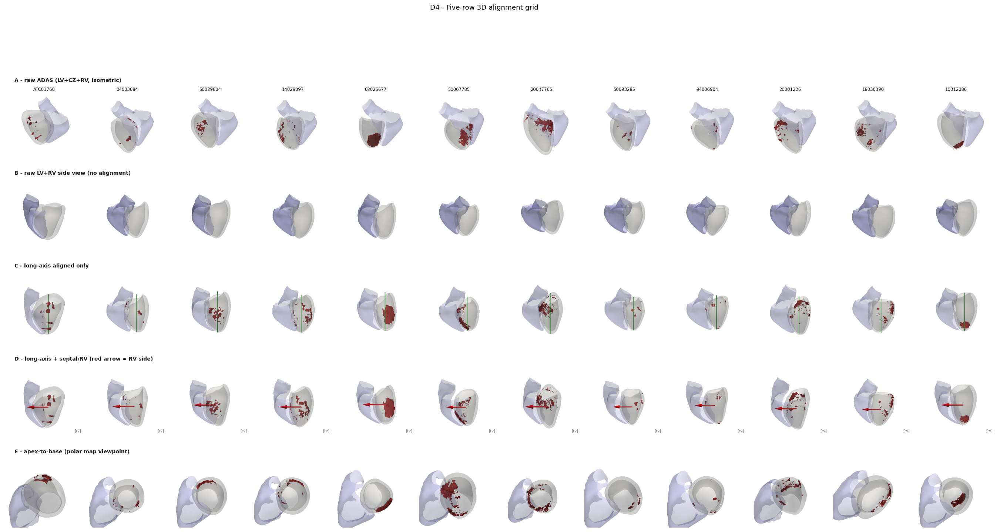

D4 horizontal row labels saved.


In [13]:
# D4 - Horizontal Row Title Layout
# Explanatory variant: same rendered images, row labels placed
# horizontally above each row using a thin title sub-row.

import matplotlib.gridspec as _gridspec_d4h

_D4H_HRATIO = [0.12, 1.0] * len(modes)   # alternating title / image rows

fig_d4h = plt.figure(figsize=(D4_N * 2.4, len(modes) * 2.7))
gs_d4h = _gridspec_d4h.GridSpec(
    len(modes) * 2, D4_N,
    figure=fig_d4h,
    height_ratios=_D4H_HRATIO,
    hspace=0.08,
    wspace=0.04,
)
fig_d4h.suptitle("D4 - Five-row 3D alignment grid", fontsize=11, y=0.997)

for mi, (mode, rlabel) in enumerate(zip(modes, row_labels)):
    # --- horizontal title sub-row spanning all columns ---
    _tax = fig_d4h.add_subplot(gs_d4h[mi * 2, :])
    _tax.axis('off')
    _tax.text(
        0.01, 0.35, rlabel,
        transform=_tax.transAxes,
        ha='left', va='center',
        fontsize=8.5, fontweight='bold', color='#222222',
    )
    # --- image sub-row ---
    for ci, (img, key, lbl) in enumerate(
            zip(d4_imgs[mode], d4_keys, d4_labels[mode])):
        ax = fig_d4h.add_subplot(gs_d4h[mi * 2 + 1, ci])
        if img is not None:
            ax.imshow(img)
        ax.axis('off')
        if mi == 0:
            ax.set_title(key.split('/')[1], fontsize=7)
        if mi in (2, 3) and lbl:
            ax.text(0.96, 0.04, lbl, transform=ax.transAxes,
                    ha='right', va='bottom', fontsize=6, color='gray',
                    bbox=dict(facecolor='white', alpha=0.65, edgecolor='none'))

plt.savefig(OUT / 'd4_horizontal_row_labels.png', bbox_inches='tight')
plt.show()
print('D4 horizontal row labels saved.')


D4 normalized vector:   0%|          | 0/12 [00:00<?, ?it/s]

D4 normalized vector: 100%|██████████| 12/12 [00:05<00:00,  2.34it/s]


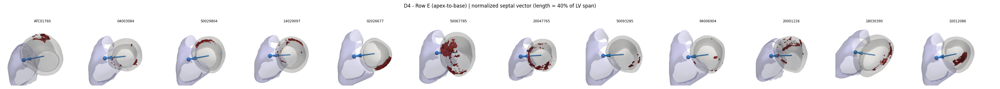

D4 normalized vector saved.


In [14]:
# D4 - Row E apex-to-base with normalized septal vector
# Explanatory: re-renders the apex-to-base view with the septal
# vector scaled to a fixed fraction of the LV span so that its
# length is consistent across cases, making the direction clearer
# in the from-above (apex-to-base) viewpoint.

_D4_NORM_FRAC = 0.40   # vector = 40% of LV span

def _render_apex_normalized(case, frac=_D4_NORM_FRAC, window_size=(360, 280)):
    shell = best_shell(case)
    rv    = best_rv_mesh(case)
    cz    = get_cz_mesh(case)
    if shell is None:
        return None
    if rv is not None:
        _ref = lambda m, ax, ap, _rv=rv: rv_reference_from_rv_mesh(m, _rv, ax, ap)
        R, apex_pt = compute_transform(shell, align_septum=True, ref_fn=_ref, rv_mesh=rv)
    else:
        R, apex_pt = compute_transform(shell, align_septum=True, rv_mesh=None)
    R = rotation_about_z(np.pi) @ R

    shell_t = apply_transform(shell, R, apex_pt)
    cz_t    = apply_transform(cz,    R, apex_pt) if cz is not None else None
    rv_t    = apply_transform(rv,    R, apex_pt) if rv is not None else None

    b    = np.array(shell_t.bounds, dtype=float)
    c    = np.array([(b[0]+b[1])/2, (b[2]+b[3])/2, (b[4]+b[5])/2])
    span = max(b[1]-b[0], b[3]-b[2], b[5]-b[4])

    lv_cen   = np.asarray(shell_t.points).mean(axis=0)
    norm_vec = None
    if rv_t is not None:
        rv_cen  = np.asarray(rv_t.points).mean(axis=0)
        raw_vec = rv_cen - lv_cen
        raw_len = np.linalg.norm(raw_vec)
        if raw_len > 1e-9:
            norm_vec = raw_vec / raw_len * (span * frac)

    pl = pv.Plotter(off_screen=True, window_size=window_size)
    pl.set_background('white')
    pl.add_mesh(shell_t, color='#cccccc', opacity=0.20,
                smooth_shading=True, show_scalar_bar=False)
    if cz_t is not None:
        pl.add_mesh(cz_t, color='firebrick', opacity=0.95,
                    smooth_shading=True, show_scalar_bar=False)
    if rv_t is not None:
        pl.add_mesh(rv_t, color='#aaaaff', opacity=0.30,
                    smooth_shading=True, show_scalar_bar=False)
    if norm_vec is not None:
        pl.add_arrows(lv_cen[np.newaxis], norm_vec[np.newaxis],
                      color='dodgerblue', mag=1.0)
        pl.add_mesh(pv.Sphere(radius=0.04 * span, center=lv_cen + norm_vec),
                    color='dodgerblue', smooth_shading=True, show_scalar_bar=False)

    cam_dist = span * 2.0
    pl.camera.position    = (float(c[0]), float(c[1]), float(b[4]) - cam_dist)
    pl.camera.focal_point = tuple(c)
    pl.camera.up          = (0.0, -1.0, 0.0)
    pl.camera.zoom(1.2)
    img = pl.screenshot(None, return_img=True)
    pl.close()
    return img

_d4_norm_imgs = [_render_apex_normalized(c)
                 for c in tqdm(d4_cases, desc='D4 normalized vector')]

fig_n, axes_n = plt.subplots(1, D4_N, figsize=(D4_N * 2.4, 2.8))
fig_n.suptitle(
    f'D4 - Row E (apex-to-base) | normalized septal vector '
    f'(length = {_D4_NORM_FRAC:.0%} of LV span)',
    fontsize=10,
)
for ci, (img, key) in enumerate(zip(_d4_norm_imgs, d4_keys)):
    ax = axes_n[ci]
    if img is not None:
        ax.imshow(img)
    ax.axis('off')
    ax.set_title(key.split('/')[1], fontsize=7)

plt.tight_layout()
plt.savefig(OUT / 'd4_row_e_normalized_vector.png', bbox_inches='tight')
plt.show()
print('D4 normalized vector saved.')


### D5 - Long Axis and Septal Vector Overlay

Two views per case showing how the long axis is oriented relative to the LV and RV. The 3D display is rolled by `AHA_DISPLAY_DEG` so the blue LV-centroid-to-RV-centroid vector points toward West (9 o'clock) in the apex-to-base view.

| View | Camera | What to check |
|---|---|---|
| **Side** | From +Y, up = (0,0,-1) | Apex (red dot) at top, green axis vertical, RV visible when available |
| **Smashed** | From apex, looking toward base | Long axis = red dot; blue septal vector points to 10:30 |

Green line = `long_axis()` result (apex to base). Red sphere = apex. Blue mesh = RV when available; gray = LV shell. Dodger-blue arrow = LV centroid to RV centroid (septal direction).


D5 render: 100%|██████████| 12/12 [00:11<00:00,  1.06it/s]


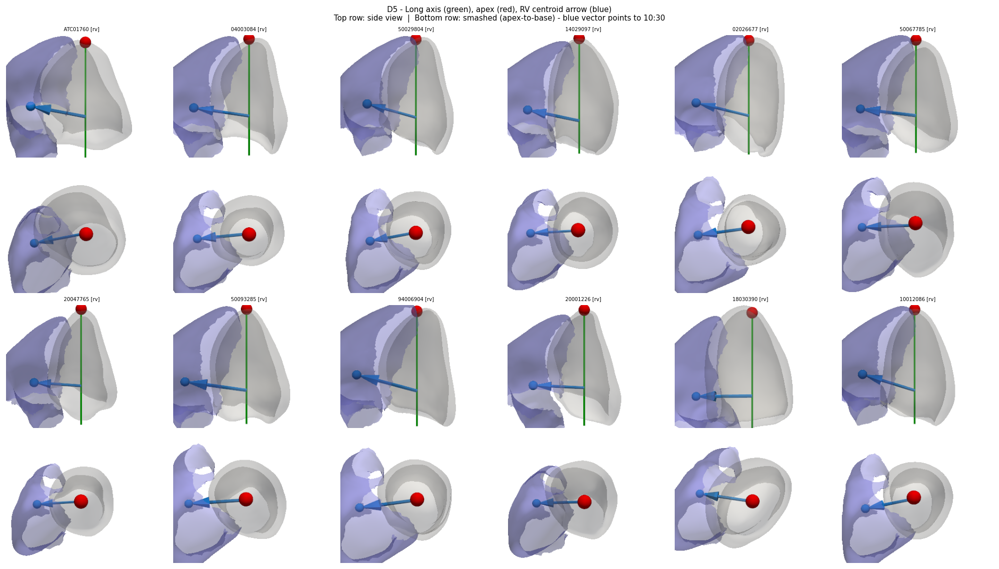

  Saved d5_long_axis_rv.png  (12 cases)


In [15]:
import math as _math_d5

D5_N   = 12
_D5WIN = (320, 260)
_d5_subset = [c for c in known if best_shell(c) is not None][:D5_N]

_d5_side, _d5_smash, _d5_pids = [], [], []

for _case in tqdm(_d5_subset, desc='D5 render'):
    _shell = best_shell(_case)
    _rv    = best_rv_mesh(_case)
    _pid   = str(getattr(_case, 'patient_id', 'unknown'))
    _has_rv = _rv is not None

    try:
        # Align long axis, then roll display so the septal vector points to 10:30.
        if _rv is not None:
            _ref_fn_d5 = lambda mesh, ax, ap, rv_mesh=_rv: rv_reference_from_rv_mesh(mesh, rv_mesh, ax, ap)
            _R, _ap = compute_transform(_shell, align_septum=True, ref_fn=_ref_fn_d5, rv_mesh=_rv)
        else:
            _R, _ap = compute_transform(_shell, align_septum=True, ref_fn=rv_reference_pca, rv_mesh=None)
        _Rd = _display_roll_matrix() @ _R
        _st = apply_transform(_shell, _Rd, _ap)
        _rvt = apply_transform(_rv, _Rd, _ap) if _has_rv else None

        _b    = np.array(_st.bounds, dtype=float)
        _c    = np.array([(_b[0]+_b[1])/2, (_b[2]+_b[3])/2, (_b[4]+_b[5])/2])
        _span = max(_b[1]-_b[0], _b[3]-_b[2], _b[5]-_b[4])

        # long axis line in aligned space = +Z from apex (origin) to base
        _axline = pv.Line(np.array([0., 0., 0.]),
                          np.array([0., 0., float(_b[5]-_b[4])]))
        _sph    = pv.Sphere(radius=0.05 * _span, center=np.zeros(3))

        _lv_centroid, _rv_centroid, _septal_vec = _septal_centroid_vector(_st, _rvt)

        for _view, _store in [('side', _d5_side), ('smash', _d5_smash)]:
            _pl = pv.Plotter(off_screen=True, window_size=_D5WIN)
            _pl.set_background('white')
            _pl.add_mesh(_st,  color='#cccccc', opacity=0.20,
                         smooth_shading=True, show_scalar_bar=False)
            if _rvt is not None:
                _pl.add_mesh(_rvt, color='#8888ff', opacity=0.45,
                             smooth_shading=True, show_scalar_bar=False)
            _pl.add_mesh(_axline, color='green', line_width=4)
            _pl.add_mesh(_sph,    color='red',   smooth_shading=True,
                         show_scalar_bar=False)
            _add_septal_vector(_pl, _st, _rvt, _span)

            if _view == 'side':
                # Display orientation: from +Y, up = (0, 0, -1); apex top
                _pl.camera.position    = (float(_c[0]), float(_c[1]) + 2.5*_span, float(_c[2]))
                _pl.camera.focal_point = tuple(_c)
                _pl.camera.up          = (0., 0., -1.)
            else:
                # Smashed: from below apex (-Z), look toward base (+Z) -> axis = red dot
                _pl.camera.position    = (float(_c[0]), float(_c[1]), float(_b[4]) - 2.0*_span)
                _pl.camera.focal_point = tuple(_c)
                _pl.camera.up          = (0., -1., 0.)
            _pl.camera.zoom(1.25)
            _store.append(_pl.screenshot(None, return_img=True))
            _pl.close()
        _d5_pids.append(_pid + (' [rv]' if _has_rv else ' [pca]'))
    except Exception as _e:
        _d5_side.append(None); _d5_smash.append(None)
        _d5_pids.append(_pid + ' ERR')
        print(f'  skip {_pid}: {_e}')

_n5   = len(_d5_subset)
_nc5  = min(_n5, _math_d5.ceil(_n5 / 2))   # cases per row; keep aspect reasonable
_nc5  = 6
_nr5  = 2 * _math_d5.ceil(_n5 / _nc5)      # 2 view rows per case-block

fig, axes = plt.subplots(_nr5, _nc5, figsize=(_nc5 * 2.8, _nr5 * 2.4))
fig.suptitle(
    'D5 - Long axis (green), apex (red), RV centroid arrow (blue)\n'
    'Top row: side view  |  Bottom row: smashed (apex-to-base) - blue vector points to 10:30',
    fontsize=9,
)
axes_flat = np.array(axes).ravel()
for _ax in axes_flat:
    _ax.axis('off')

for _i in range(_n5):
    _col   = _i % _nc5
    _row_s = 2 * (_i // _nc5)
    _row_m = _row_s + 1
    _pid_lbl = _d5_pids[_i]

    _ax_s = axes[_row_s, _col]
    _ax_m = axes[_row_m, _col]

    if _d5_side[_i] is not None:
        _ax_s.imshow(_d5_side[_i])
    _ax_s.set_title(_pid_lbl, fontsize=6)
    _ax_s.axis('off')

    if _d5_smash[_i] is not None:
        _ax_m.imshow(_d5_smash[_i])
    _ax_m.axis('off')

    if _col == 0:
        _ax_s.set_ylabel('side', fontsize=7, rotation=90, labelpad=4)
        _ax_m.set_ylabel('smashed', fontsize=7, rotation=90, labelpad=4)

plt.tight_layout()
plt.savefig(OUT / 'd5_long_axis_rv.png', bbox_inches='tight', dpi=120)
plt.show()
print(f'  Saved d5_long_axis_rv.png  ({_n5} cases)')


### Axis Diagnostic - Raw LV PCA Axis vs Robust Long Axis

Original-coordinate comparison of the naive LV SVD PC1 against the robust `long_axis()` result.


Axis diag: 100%|██████████| 12/12 [00:05<00:00,  2.14it/s]


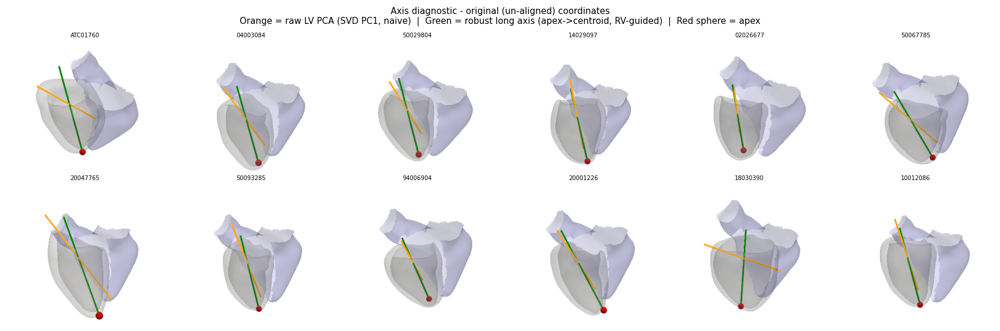

  Saved axis_diagnostic.png


In [16]:
# ----------------------------------------------------------
# AXIS DIAGNOSTIC - compare raw LV PCA axis vs robust axis
# Original (un-aligned) coordinates.
# Orange  = raw LV SVD PC1 from centroid
# Green   = robust long_axis() result (apex-to-centroid, forced through tip)
# Red sph = apex from long_axis()
# Blue    = RV mesh (when available)
# ----------------------------------------------------------
from src.lv_geometry import long_axis as _la_robust

_AD_NCOLS  = 6
_AD_WIN    = (360, 320)
_AD_SUBSET = 12

_ad_imgs, _ad_labels = [], []
for _case in tqdm(known[:_AD_SUBSET], desc='Axis diag'):
    _shell = best_shell(_case)
    _rv    = best_rv_mesh(_case)
    _img   = None
    try:
        _pts    = np.asarray(_shell.points)
        _center = _pts.mean(axis=0)

        # Raw LV PCA axis (orange) - naive SVD PC1, no RV guidance
        _, _, _vt  = np.linalg.svd(_pts - _center, full_matrices=False)
        _pc1_raw   = _vt[0]
        # orient: point away from centroid toward most negative end
        _pc1_proj  = (_pts - _center) @ _pc1_raw
        _pc1_apex  = _pts[_pc1_proj.argmin()]
        if np.dot(_center - _pc1_apex, _pc1_raw) < 0:
            _pc1_raw = -_pc1_raw

        # Robust axis (green) - apex forced through geometric tip
        _axis, _apex = _la_robust(_shell, rv_mesh=_rv)

        # Spans for line lengths
        _span_raw  = float((_pc1_proj.max() - _pc1_proj.min()))
        _span_rob  = float(np.ptp((_pts - _apex) @ _axis))

        _pc1_line = pv.Line(_center - 0.55 * _span_raw * _pc1_raw,
                            _center + 0.55 * _span_raw * _pc1_raw)
        _rob_line = pv.Line(_apex, _apex + 1.1 * _span_rob * _axis)
        _sph      = pv.Sphere(radius=0.04 * _span_rob, center=_apex)

        _pl = pv.Plotter(off_screen=True, window_size=_AD_WIN)
        _pl.set_background('white')
        _pl.add_mesh(_shell, color='#cccccc', opacity=0.18,
                     smooth_shading=True, show_scalar_bar=False)
        if _rv is not None:
            _pl.add_mesh(_rv, color='#aaaaff', opacity=0.30,
                         smooth_shading=True, show_scalar_bar=False)
        _pl.add_mesh(_pc1_line, color='orange',  line_width=4)
        _pl.add_mesh(_rob_line, color='green',   line_width=4)
        _pl.add_mesh(_sph,      color='red',     smooth_shading=True,
                     show_scalar_bar=False)
        _pl.view_isometric()
        _pl.camera.zoom(1.15)
        _img = _pl.screenshot(None, return_img=True)
        _pl.close()
    except Exception as _e:
        print(f'  skip {_case.patient_id}: {_e}')
    _ad_imgs.append(_img)
    _ad_labels.append(str(getattr(_case, 'patient_id', 'unknown')))

# --- grid ---
import math as _math
_n     = len(_ad_imgs)
_nrows = max(1, _math.ceil(_n / _AD_NCOLS))
_fig, _axes = plt.subplots(_nrows, _AD_NCOLS,
                            figsize=(_AD_NCOLS * 2.4, _nrows * 2.4))
_fig.suptitle(
    'Axis diagnostic - original (un-aligned) coordinates\n'
    'Orange = raw LV PCA (SVD PC1, naive)  |  Green = robust long axis (apex->centroid, RV-guided)  |  Red sphere = apex',
    fontsize=9,
)
for _ax in np.array(_axes).ravel():
    _ax.axis('off')
for _ax, _img, _lbl in zip(np.array(_axes).ravel(), _ad_imgs, _ad_labels):
    if _img is not None:
        _ax.imshow(_img)
    _ax.set_title(_lbl, fontsize=6)
plt.tight_layout()
_ad_path = OUT / 'axis_diagnostic.png'
plt.savefig(_ad_path, bbox_inches='tight', dpi=110)
plt.show()
print(f'  Saved {_ad_path.name}')


### D6 - Long Axis Candidates

For each case, shows all candidate axes tried by `long_axis()` and highlights the chosen one.

**Candidates (always tested in this order):**
- **Blue** = RV SVD PC1 (only when RV mesh available)
- **Orange** = LV SVD PC1 (naive long axis)
- **Purple** = LV SVD PC2

**Chosen axis:** drawn **thick green**; the candidate with highest apex eccentricity.

**Red sphere** = apex detected by the chosen candidate.

A good result: green overlaps the anatomical apex-to-base direction. When RV mesh is present the blue line typically wins.

D6 render: 100%|██████████| 12/12 [00:06<00:00,  1.81it/s]


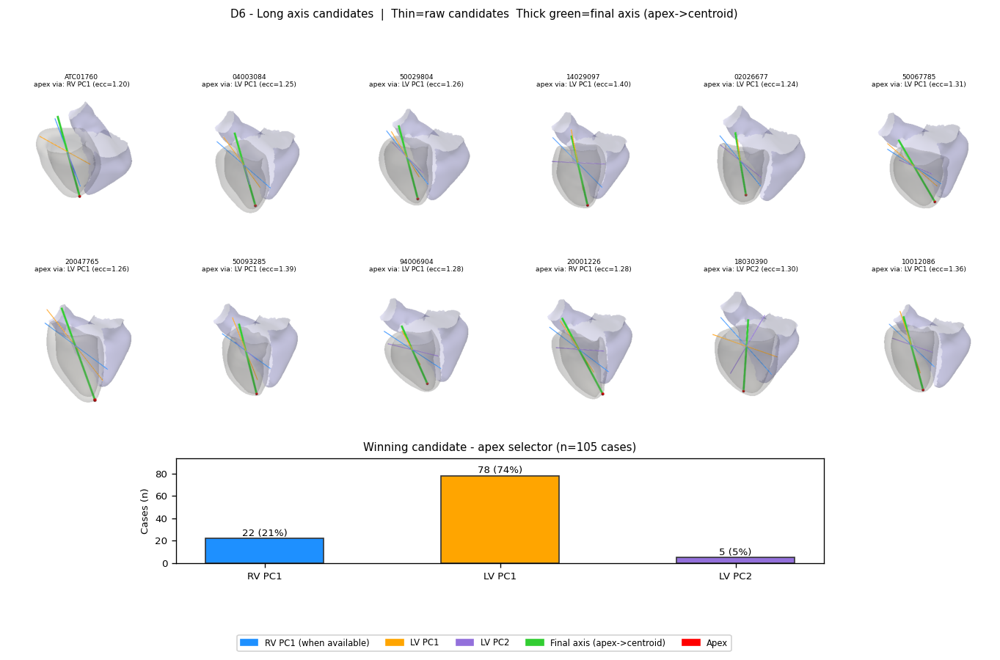

  Saved d6_long_axis_candidates.png
  Winner counts: {'RV PC1': 22, 'LV PC1': 78, 'LV PC2': 5}


In [17]:
# ----------------------------------------------------------
# D6 - Long Axis Candidates
# Shows all candidate axes tested by long_axis() and the final chosen axis.
#
# Candidates (raw SVD directions, centered at LV centroid):
#   Blue   = RV PC1 (only when RV mesh present)
#   Orange = LV PC1 (naive SVD)
#   Purple = LV PC2
#
# Green (thick) = FINAL long_axis() output: apex->centroid direction
#                 anchored at the detected apex (same as Axis Diagnostic).
# Red sphere    = detected apex.
# ----------------------------------------------------------
from src.lv_geometry import _hull_apex_candidate

_D6_NCOLS  = 6
_D6_WIN    = (360, 320)
_D6_SUBSET = 12

_d6_imgs, _d6_labels = [], []
_d6_winner_counts = {}

# --- count winners across full cohort ---
for _case in tqdm(known, desc='D6 winner count'):
    _shell = best_shell(_case)
    _rv    = best_rv_mesh(_case)
    if _shell is None:
        continue
    _pts    = np.asarray(_shell.points)
    _center = _pts.mean(axis=0)
    try:
        _, _sv, _vt = np.linalg.svd(_pts - _center, full_matrices=False)
        _cands2, _clabels2 = [], []
        if _rv is not None:
            try:
                _rv_pts2 = np.asarray(_rv.points)
                _rv_c2   = _rv_pts2.mean(axis=0)
                _, _, _rv_vt2 = np.linalg.svd(_rv_pts2 - _rv_c2, full_matrices=False)
                _cands2.append(_rv_vt2[0]); _clabels2.append('RV PC1')
            except Exception:
                pass
        _cands2.append(_vt[0]); _clabels2.append('LV PC1')
        if len(_sv) > 1:
            _cands2.append(_vt[1]); _clabels2.append('LV PC2')
        _best_ecc2, _w2 = -1.0, 0
        for _ci2, _c2 in enumerate(_cands2):
            _, _ecc2, _ = _hull_apex_candidate(_pts, _center, _c2)
            if _ecc2 > _best_ecc2:
                _best_ecc2 = _ecc2; _w2 = _ci2
        _lbl2 = _clabels2[_w2]
        _d6_winner_counts[_lbl2] = _d6_winner_counts.get(_lbl2, 0) + 1
    except Exception:
        pass

# --- render subset ---
for _case in tqdm(known[:_D6_SUBSET], desc='D6 render'):
    _shell = best_shell(_case)
    _rv    = best_rv_mesh(_case)
    _img   = None
    try:
        _pts    = np.asarray(_shell.points)
        _center = _pts.mean(axis=0)
        _, _sv, _vt = np.linalg.svd(_pts - _center, full_matrices=False)

        _cands, _clabels, _ccolors = [], [], []
        if _rv is not None:
            try:
                _rv_pts    = np.asarray(_rv.points)
                _rv_center = _rv_pts.mean(axis=0)
                _, _, _rv_vt = np.linalg.svd(_rv_pts - _rv_center, full_matrices=False)
                _cands.append(_rv_vt[0]); _clabels.append('RV PC1'); _ccolors.append('dodgerblue')
            except Exception:
                pass
        _cands.append(_vt[0]); _clabels.append('LV PC1'); _ccolors.append('orange')
        if len(_sv) > 1:
            _cands.append(_vt[1]); _clabels.append('LV PC2'); _ccolors.append('mediumpurple')

        _best_apex, _best_ecc, _winner_idx = _pts[0], -1.0, 0
        _eccs = []
        for _ci, _c in enumerate(_cands):
            _ap, _ecc, _ = _hull_apex_candidate(_pts, _center, _c)
            _eccs.append(_ecc)
            if _ecc > _best_ecc:
                _best_ecc = _ecc; _best_apex = _ap; _winner_idx = _ci

        _vec   = _center - _best_apex
        _vnorm = np.linalg.norm(_vec)
        _final_axis = _vec / _vnorm if _vnorm > 1e-9 else _vt[0]
        _, _, _span = _hull_apex_candidate(_pts, _center, _final_axis)

        _pl = pv.Plotter(off_screen=True, window_size=_D6_WIN)
        _pl.set_background('white')
        _pl.add_mesh(_shell, color='#cccccc', opacity=0.18,
                     smooth_shading=True, show_scalar_bar=False)
        if _rv is not None:
            _pl.add_mesh(_rv, color='#aaaaff', opacity=0.28,
                         smooth_shading=True, show_scalar_bar=False)

        for _c, _col in zip(_cands, _ccolors):
            _proj_ci   = (_pts - _center) @ _c
            _full_span = float(_proj_ci.max() - _proj_ci.min())
            _line = pv.Line(_center - 0.5 * _full_span * _c,
                            _center + 0.5 * _full_span * _c)
            _pl.add_mesh(_line, color=_col, line_width=2)

        _rob_span = float(np.ptp((_pts - _best_apex) @ _final_axis))
        _rob_line = pv.Line(_best_apex, _best_apex + 1.1 * _rob_span * _final_axis)
        _pl.add_mesh(_rob_line, color='limegreen', line_width=5)

        _sph = pv.Sphere(radius=0.04 * _span, center=_best_apex)
        _pl.add_mesh(_sph, color='red', smooth_shading=True, show_scalar_bar=False)

        _pl.view_isometric()
        _pl.camera.zoom(1.15)
        _img = _pl.screenshot(None, return_img=True)
        _pl.close()

        _d6_labels.append(
            '{}\napex via: {} (ecc={:.2f})'.format(
                getattr(_case, 'patient_id', 'unknown'),
                _clabels[_winner_idx], _eccs[_winner_idx])
        )
    except Exception as _e:
        print('  skip {}: {}'.format(getattr(_case, 'patient_id', '?'), _e))
        _d6_labels.append(str(getattr(_case, 'patient_id', 'unknown')))
    _d6_imgs.append(_img)

# --- figure: grid + winner bar chart ---
import math as _math_d6
import matplotlib.patches as _mpatches

_n6     = len(_d6_imgs)
_nrows6 = max(1, _math_d6.ceil(_n6 / _D6_NCOLS))

_fig6 = plt.figure(figsize=(_D6_NCOLS * 2.4, _nrows6 * 2.4 + 2.2))
_gs6  = _fig6.add_gridspec(
    _nrows6 + 1, _D6_NCOLS,
    height_ratios=[2.4] * _nrows6 + [1.8],
    hspace=0.35, wspace=0.15,
)

_img_axes = [_fig6.add_subplot(_gs6[_r, _c])
             for _r in range(_nrows6) for _c in range(_D6_NCOLS)]
for _ax6 in _img_axes:
    _ax6.axis('off')
for _ax6, _img6, _lbl6 in zip(_img_axes, _d6_imgs, _d6_labels):
    if _img6 is not None:
        _ax6.imshow(_img6)
    _ax6.set_title(_lbl6, fontsize=5.5)

_bar_ax = _fig6.add_subplot(_gs6[_nrows6, 1:-1])
_bar_order  = ['RV PC1', 'LV PC1', 'LV PC2']
_bar_colors = ['dodgerblue', 'orange', 'mediumpurple']
_bar_vals   = [_d6_winner_counts.get(k, 0) for k in _bar_order]
_total_cases = sum(_bar_vals)
_bars = _bar_ax.bar(_bar_order, _bar_vals, color=_bar_colors, edgecolor='#333', width=0.5)
for _b, _v in zip(_bars, _bar_vals):
    _pct = 100 * _v / _total_cases if _total_cases else 0
    _bar_ax.text(_b.get_x() + _b.get_width() / 2, _v + 0.3,
                 '{} ({:.0f}%)'.format(_v, _pct),
                 ha='center', va='bottom', fontsize=8)
_bar_ax.set_ylabel('Cases (n)', fontsize=8)
_bar_ax.set_title('Winning candidate - apex selector (n={} cases)'.format(_total_cases), fontsize=9)
_bar_ax.tick_params(labelsize=8)
_bar_ax.set_ylim(0, max(_bar_vals) * 1.2 if _bar_vals else 1)

_fig6.suptitle(
    'D6 - Long axis candidates  |  '
    'Thin=raw candidates  Thick green=final axis (apex->centroid)',
    fontsize=9, y=1.01,
)
_legend_items = [
    _mpatches.Patch(color='dodgerblue',   label='RV PC1 (when available)'),
    _mpatches.Patch(color='orange',       label='LV PC1'),
    _mpatches.Patch(color='mediumpurple', label='LV PC2'),
    _mpatches.Patch(color='limegreen',    label='Final axis (apex->centroid)'),
    _mpatches.Patch(color='red',          label='Apex'),
]
_fig6.legend(handles=_legend_items, loc='lower center', ncol=5,
             fontsize=7, framealpha=0.85, bbox_to_anchor=(0.5, -0.04))

_d6_path = OUT / 'd6_long_axis_candidates.png'
plt.savefig(_d6_path, bbox_inches='tight', dpi=110)
plt.show()
print('  Saved {}'.format(_d6_path.name))
print('  Winner counts: {}'.format(_d6_winner_counts))


### D6b - Long Axis Candidates (No RV Mesh)

Same as D6 but RV mesh excluded — only LV PC1 and LV PC2 compete.
Shows what `long_axis()` would choose without RV guidance.
Compare green axis here vs D6 to see RV mesh impact on apex detection.

D6b render: 100%|██████████| 12/12 [00:06<00:00,  1.89it/s]


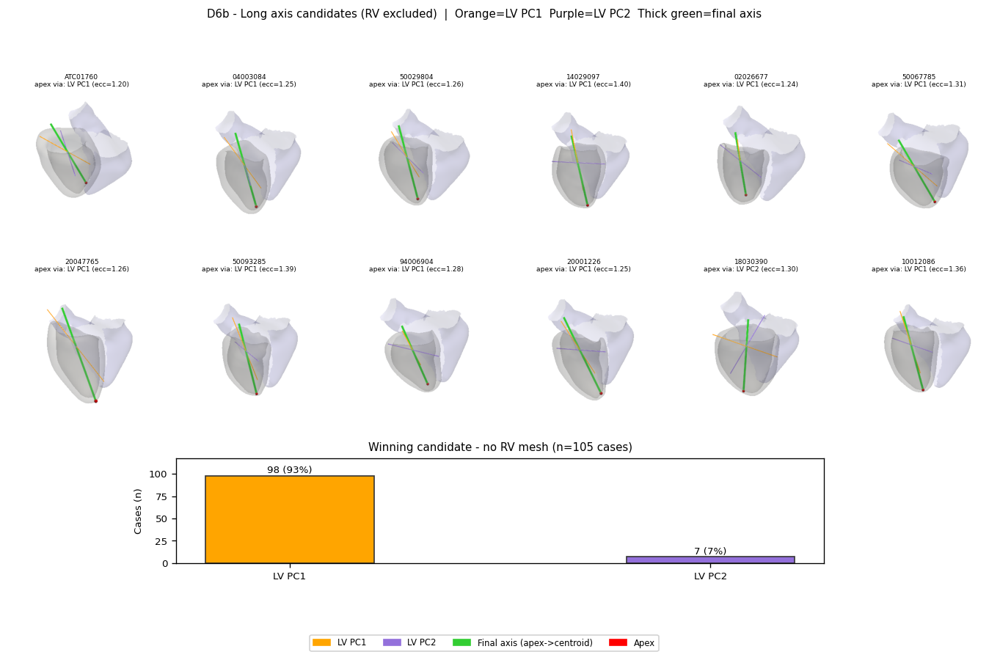

  Saved d6b_long_axis_candidates_norv.png
  Winner counts (no RV): {'LV PC1': 98, 'LV PC2': 7}


In [18]:
# ----------------------------------------------------------
# D6b - Long Axis Candidates (RV excluded)
# Same logic as long_axis() but rv_mesh=None forced.
# Only LV PC1 and LV PC2 compete as candidates.
# Compare green axis vs D6 to see RV mesh impact on apex detection.
# ----------------------------------------------------------
_D6B_NCOLS  = 6
_D6B_WIN    = (360, 320)
_D6B_SUBSET = 12

_d6b_imgs, _d6b_labels = [], []
_d6b_winner_counts = {}

# --- count winners (no RV) across full cohort ---
for _case in tqdm(known, desc='D6b winner count'):
    _shell = best_shell(_case)
    if _shell is None:
        continue
    _pts    = np.asarray(_shell.points)
    _center = _pts.mean(axis=0)
    try:
        _, _sv2b, _vt2b = np.linalg.svd(_pts - _center, full_matrices=False)
        _cands2b = [_vt2b[0]]
        _lbls2b  = ['LV PC1']
        if len(_sv2b) > 1:
            _cands2b.append(_vt2b[1]); _lbls2b.append('LV PC2')
        _best_ecc2b, _w2b = -1.0, 0
        for _ci2b, _c2b in enumerate(_cands2b):
            _, _ecc2b, _ = _hull_apex_candidate(_pts, _center, _c2b)
            if _ecc2b > _best_ecc2b:
                _best_ecc2b = _ecc2b; _w2b = _ci2b
        _lbl2b = _lbls2b[_w2b]
        _d6b_winner_counts[_lbl2b] = _d6b_winner_counts.get(_lbl2b, 0) + 1
    except Exception:
        pass

# --- render subset ---
for _case in tqdm(known[:_D6B_SUBSET], desc='D6b render'):
    _shell = best_shell(_case)
    _rv    = best_rv_mesh(_case)
    _img   = None
    try:
        _pts    = np.asarray(_shell.points)
        _center = _pts.mean(axis=0)
        _, _svb, _vtb = np.linalg.svd(_pts - _center, full_matrices=False)

        _cands_b   = [_vtb[0]]
        _clabels_b = ['LV PC1']
        _ccolors_b = ['orange']
        if len(_svb) > 1:
            _cands_b.append(_vtb[1]); _clabels_b.append('LV PC2'); _ccolors_b.append('mediumpurple')

        _best_apex_b, _best_ecc_b, _winner_idx_b = _pts[0], -1.0, 0
        _eccs_b = []
        for _cib, _cb in enumerate(_cands_b):
            _apb, _eccb, _ = _hull_apex_candidate(_pts, _center, _cb)
            _eccs_b.append(_eccb)
            if _eccb > _best_ecc_b:
                _best_ecc_b = _eccb; _best_apex_b = _apb; _winner_idx_b = _cib

        _vec_b   = _center - _best_apex_b
        _vnorm_b = np.linalg.norm(_vec_b)
        _final_axis_b = _vec_b / _vnorm_b if _vnorm_b > 1e-9 else _vtb[0]
        _, _, _span_b = _hull_apex_candidate(_pts, _center, _final_axis_b)

        _pl = pv.Plotter(off_screen=True, window_size=_D6B_WIN)
        _pl.set_background('white')
        _pl.add_mesh(_shell, color='#cccccc', opacity=0.18,
                     smooth_shading=True, show_scalar_bar=False)
        if _rv is not None:
            _pl.add_mesh(_rv, color='#aaaaff', opacity=0.18,
                         smooth_shading=True, show_scalar_bar=False)

        for _cb, _col_b in zip(_cands_b, _ccolors_b):
            _proj_b  = (_pts - _center) @ _cb
            _fspan_b = float(_proj_b.max() - _proj_b.min())
            _line_b  = pv.Line(_center - 0.5 * _fspan_b * _cb,
                               _center + 0.5 * _fspan_b * _cb)
            _pl.add_mesh(_line_b, color=_col_b, line_width=2)

        _rob_span_b = float(np.ptp((_pts - _best_apex_b) @ _final_axis_b))
        _rob_line_b = pv.Line(_best_apex_b,
                              _best_apex_b + 1.1 * _rob_span_b * _final_axis_b)
        _pl.add_mesh(_rob_line_b, color='limegreen', line_width=5)

        _sph_b = pv.Sphere(radius=0.04 * _span_b, center=_best_apex_b)
        _pl.add_mesh(_sph_b, color='red', smooth_shading=True, show_scalar_bar=False)

        _pl.view_isometric()
        _pl.camera.zoom(1.15)
        _img = _pl.screenshot(None, return_img=True)
        _pl.close()

        _d6b_labels.append(
            '{}\napex via: {} (ecc={:.2f})'.format(
                getattr(_case, 'patient_id', 'unknown'),
                _clabels_b[_winner_idx_b], _eccs_b[_winner_idx_b])
        )
    except Exception as _e:
        print('  skip {}: {}'.format(getattr(_case, 'patient_id', '?'), _e))
        _d6b_labels.append(str(getattr(_case, 'patient_id', 'unknown')))
    _d6b_imgs.append(_img)

# --- figure ---
import math as _math_d6b
import matplotlib.patches as _mpatches_b

_n6b     = len(_d6b_imgs)
_nrows6b = max(1, _math_d6b.ceil(_n6b / _D6B_NCOLS))

_fig6b = plt.figure(figsize=(_D6B_NCOLS * 2.4, _nrows6b * 2.4 + 2.2))
_gs6b  = _fig6b.add_gridspec(
    _nrows6b + 1, _D6B_NCOLS,
    height_ratios=[2.4] * _nrows6b + [1.8],
    hspace=0.35, wspace=0.15,
)

_img_axes_b = [_fig6b.add_subplot(_gs6b[_r, _c])
               for _r in range(_nrows6b) for _c in range(_D6B_NCOLS)]
for _ax6b in _img_axes_b:
    _ax6b.axis('off')
for _ax6b, _img6b, _lbl6b in zip(_img_axes_b, _d6b_imgs, _d6b_labels):
    if _img6b is not None:
        _ax6b.imshow(_img6b)
    _ax6b.set_title(_lbl6b, fontsize=5.5)

_bar_ax_b = _fig6b.add_subplot(_gs6b[_nrows6b, 1:-1])
_bar_order_b  = ['LV PC1', 'LV PC2']
_bar_colors_b = ['orange', 'mediumpurple']
_bar_vals_b   = [_d6b_winner_counts.get(k, 0) for k in _bar_order_b]
_total_b = sum(_bar_vals_b)
_bars_b = _bar_ax_b.bar(_bar_order_b, _bar_vals_b,
                         color=_bar_colors_b, edgecolor='#333', width=0.4)
for _bb, _vb in zip(_bars_b, _bar_vals_b):
    _pct_b = 100 * _vb / _total_b if _total_b else 0
    _bar_ax_b.text(_bb.get_x() + _bb.get_width() / 2, _vb + 0.3,
                   '{} ({:.0f}%)'.format(_vb, _pct_b),
                   ha='center', va='bottom', fontsize=8)
_bar_ax_b.set_ylabel('Cases (n)', fontsize=8)
_bar_ax_b.set_title('Winning candidate - no RV mesh (n={} cases)'.format(_total_b), fontsize=9)
_bar_ax_b.tick_params(labelsize=8)
_bar_ax_b.set_ylim(0, max(_bar_vals_b) * 1.2 if _bar_vals_b else 1)

_fig6b.suptitle(
    'D6b - Long axis candidates (RV excluded)  |  '
    'Orange=LV PC1  Purple=LV PC2  Thick green=final axis',
    fontsize=9, y=1.01,
)
_legend_items_b = [
    _mpatches_b.Patch(color='orange',       label='LV PC1'),
    _mpatches_b.Patch(color='mediumpurple', label='LV PC2'),
    _mpatches_b.Patch(color='limegreen',    label='Final axis (apex->centroid)'),
    _mpatches_b.Patch(color='red',          label='Apex'),
]
_fig6b.legend(handles=_legend_items_b, loc='lower center', ncol=4,
              fontsize=7, framealpha=0.85, bbox_to_anchor=(0.5, -0.04))

_d6b_path = OUT / 'd6b_long_axis_candidates_norv.png'
plt.savefig(_d6b_path, bbox_inches='tight', dpi=110)
plt.show()
print('  Saved {}'.format(_d6b_path.name))
print('  Winner counts (no RV): {}'.format(_d6b_winner_counts))


### D6c - RV PC1 / LV PC2 Winners vs LV PC1 Fallback

Finds cases where `long_axis()` chose **RV PC1** or **LV PC2** as the apex selector
(i.e. LV PC1 was *not* the best candidate), then renders each case twice:

| Column | Description |
|---|---|
| **Left** | Actual chosen axis (green) — winner = RV PC1 or LV PC2 |
| **Right** | Counterfactual: LV PC1 forced as winner (crimson) |

Panel title shows which candidate won and the eccentricity gap.
A large gap means RV/PC2 found a much better apex than PC1 would have.


D6c scan:   0%|          | 0/105 [00:00<?, ?it/s]

D6c scan:  57%|█████▋    | 60/105 [00:06<00:05,  8.93it/s]


Non-PC1 cases found: 10


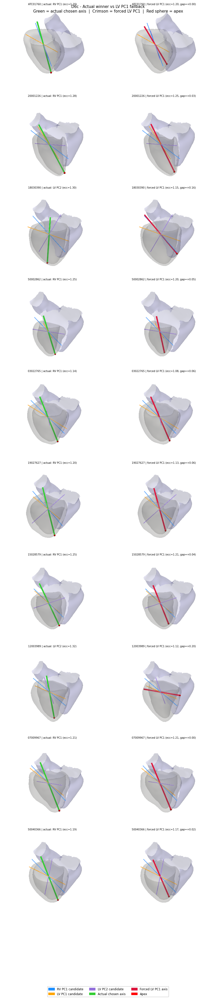

  Saved d6c_winner_vs_pc1.png


In [19]:
# ----------------------------------------------------------
# D6c - Cases where RV PC1 or LV PC2 wins vs LV PC1 fallback
# Left panel  = actual chosen axis (green)
# Right panel = counterfactual: LV PC1 forced as winner
# ----------------------------------------------------------
_D6C_WIN     = (360, 300)
_D6C_MAX     = 10   # max non-PC1 cases to show

_d6c_entries = []   # list of dicts

for _case in tqdm(known, desc='D6c scan'):
    _shell = best_shell(_case)
    _rv    = best_rv_mesh(_case)
    if _shell is None:
        continue
    _pts    = np.asarray(_shell.points)
    _center = _pts.mean(axis=0)
    try:
        _, _sv, _vt = np.linalg.svd(_pts - _center, full_matrices=False)

        _cands, _clabels = [], []
        if _rv is not None:
            try:
                _rv_pts2 = np.asarray(_rv.points)
                _rv_c2   = _rv_pts2.mean(axis=0)
                _, _, _rv_vt2 = np.linalg.svd(_rv_pts2 - _rv_c2, full_matrices=False)
                _cands.append(_rv_vt2[0]); _clabels.append('RV PC1')
            except Exception:
                pass
        _cands.append(_vt[0]); _clabels.append('LV PC1')
        if len(_sv) > 1:
            _cands.append(_vt[1]); _clabels.append('LV PC2')

        _eccs = []
        _apices = []
        for _c in _cands:
            _ap, _ecc, _ = _hull_apex_candidate(_pts, _center, _c)
            _eccs.append(_ecc); _apices.append(_ap)

        _winner_idx = int(np.argmax(_eccs))
        _winner_lbl = _clabels[_winner_idx]

        # Only keep cases where winner != LV PC1
        _lv_pc1_idx = _clabels.index('LV PC1')
        if _winner_lbl == 'LV PC1':
            continue
        if len(_d6c_entries) >= _D6C_MAX:
            break

        _d6c_entries.append({
            'case':        _case,
            'shell':       _shell,
            'rv':          _rv,
            'pts':         _pts,
            'center':      _center,
            'vt':          _vt,
            'cands':       _cands,
            'clabels':     _clabels,
            'eccs':        _eccs,
            'apices':      _apices,
            'winner_idx':  _winner_idx,
            'winner_lbl':  _winner_lbl,
            'lv_pc1_idx':  _lv_pc1_idx,
        })
    except Exception:
        pass

print('Non-PC1 cases found:', len(_d6c_entries))

def _render_axis(shell, rv, pts, center, apex, axis, span,
                 cands, ccolors, win_idx, win_color):
    """Render one 3D panel showing candidate lines + chosen axis."""
    _pl = pv.Plotter(off_screen=True, window_size=_D6C_WIN)
    _pl.set_background('white')
    _pl.add_mesh(shell, color='#cccccc', opacity=0.18,
                 smooth_shading=True, show_scalar_bar=False)
    if rv is not None:
        _pl.add_mesh(rv, color='#aaaaff', opacity=0.25,
                     smooth_shading=True, show_scalar_bar=False)
    # raw candidates (thin)
    for _ci2, (_c2, _col2) in enumerate(zip(cands, ccolors)):
        _proj2    = (pts - center) @ _c2
        _fspan2   = float(_proj2.max() - _proj2.min())
        _line2    = pv.Line(center - 0.5 * _fspan2 * _c2,
                            center + 0.5 * _fspan2 * _c2)
        _pl.add_mesh(_line2, color=_col2, line_width=2)
    # chosen / forced axis (thick green or red)
    _rob_span2 = float(np.ptp((pts - apex) @ axis))
    _rob_line2 = pv.Line(apex, apex + 1.1 * _rob_span2 * axis)
    _pl.add_mesh(_rob_line2, color=win_color, line_width=5)
    _sph2 = pv.Sphere(radius=0.04 * span, center=apex)
    _pl.add_mesh(_sph2, color='red', smooth_shading=True, show_scalar_bar=False)
    _pl.view_isometric()
    _pl.camera.zoom(1.15)
    _img2 = _pl.screenshot(None, return_img=True)
    _pl.close()
    return _img2

_CAND_COLORS_MAP = {'RV PC1': 'dodgerblue', 'LV PC1': 'orange', 'LV PC2': 'mediumpurple'}

_d6c_rows = []   # list of (img_actual, img_pc1, title_actual, title_pc1)

for _e in _d6c_entries:
    _pts    = _e['pts']
    _center = _e['center']
    _cands  = _e['cands']
    _clabels= _e['clabels']
    _eccs   = _e['eccs']
    _apices = _e['apices']
    _ccolors= [_CAND_COLORS_MAP.get(l, 'gray') for l in _clabels]
    _pid    = str(getattr(_e['case'], 'patient_id', 'unknown'))

    # --- actual winner ---
    _wi      = _e['winner_idx']
    _w_apex  = _apices[_wi]
    _w_vec   = _center - _w_apex
    _w_norm  = np.linalg.norm(_w_vec)
    _w_axis  = _w_vec / _w_norm if _w_norm > 1e-9 else _cands[_wi]
    _, _, _w_span = _hull_apex_candidate(_pts, _center, _w_axis)

    _img_actual = _render_axis(
        _e['shell'], _e['rv'], _pts, _center,
        _w_apex, _w_axis, _w_span,
        _cands, _ccolors, _wi, 'limegreen',
    )

    # --- LV PC1 forced ---
    _pi      = _e['lv_pc1_idx']
    _p_apex  = _apices[_pi]
    _p_vec   = _center - _p_apex
    _p_norm  = np.linalg.norm(_p_vec)
    _p_axis  = _p_vec / _p_norm if _p_norm > 1e-9 else _cands[_pi]
    _, _, _p_span = _hull_apex_candidate(_pts, _center, _p_axis)

    _img_pc1 = _render_axis(
        _e['shell'], _e['rv'], _pts, _center,
        _p_apex, _p_axis, _p_span,
        _cands, _ccolors, _pi, 'crimson',
    )

    _ecc_gap = _eccs[_wi] - _eccs[_pi]
    _d6c_rows.append((
        _img_actual, _img_pc1,
        '{} | actual: {} (ecc={:.2f})'.format(_pid, _e['winner_lbl'], _eccs[_wi]),
        '{} | forced LV PC1 (ecc={:.2f}, gap={:+.2f})'.format(_pid, _eccs[_pi], _ecc_gap),
    ))

# --- plot ---
import math as _math_d6c
import matplotlib.patches as _mpatches_c

_nc = len(_d6c_rows)
if _nc == 0:
    print('No non-PC1 cases found in subset.')
else:
    _fig6c, _axes6c = plt.subplots(_nc, 2, figsize=(2 * 3.8, _nc * 3.2))
    if _nc == 1:
        _axes6c = [_axes6c]
    _fig6c.suptitle(
        'D6c - Actual winner vs LV PC1 fallback\n'
        'Green = actual chosen axis  |  Crimson = forced LV PC1  |  Red sphere = apex',
        fontsize=9,
    )
    for _row, (_img_a, _img_p, _t_a, _t_p) in enumerate(_d6c_rows):
        _axes6c[_row][0].imshow(_img_a)
        _axes6c[_row][0].set_title(_t_a, fontsize=6)
        _axes6c[_row][0].axis('off')
        _axes6c[_row][1].imshow(_img_p)
        _axes6c[_row][1].set_title(_t_p, fontsize=6)
        _axes6c[_row][1].axis('off')

    _legend_c = [
        _mpatches_c.Patch(color='dodgerblue',   label='RV PC1 candidate'),
        _mpatches_c.Patch(color='orange',       label='LV PC1 candidate'),
        _mpatches_c.Patch(color='mediumpurple', label='LV PC2 candidate'),
        _mpatches_c.Patch(color='limegreen',    label='Actual chosen axis'),
        _mpatches_c.Patch(color='crimson',      label='Forced LV PC1 axis'),
        _mpatches_c.Patch(color='red',          label='Apex'),
    ]
    _fig6c.legend(handles=_legend_c, loc='lower center', ncol=3,
                  fontsize=7, framealpha=0.85, bbox_to_anchor=(0.5, -0.03))
    plt.tight_layout(rect=[0, 0.05, 1, 1])
    _d6c_path = OUT / 'd6c_winner_vs_pc1.png'
    plt.savefig(_d6c_path, bbox_inches='tight', dpi=110)
    plt.show()
    print('  Saved {}'.format(_d6c_path.name))


### D6d - Candidate Axis Origin and Apex Detection

For each case, **3 panels** (one per candidate type):

| Column | Axis source |
|---|---|
| **RV PC1** | SVD PC1 of **RV mesh** point cloud |
| **LV PC1** | SVD PC1 of **LV mesh** point cloud |
| **LV PC2** | SVD PC2 of **LV mesh** point cloud |

**In each panel:**
- Colored line = candidate axis direction (through LV centroid)
- Hull vertices of LV colored by `|projection onto axis|` (yellow = far from centroid, dark = near)
- **Red sphere** = apex chosen by this candidate (hull vertex with max `|projection|`)
- **Gray sphere** = LV centroid
- `[WINNER]` = the candidate `long_axis()` selects (highest eccentricity)

The eccentricity measures how sharp/pointy the detected apex is:
`ecc = |apex - centroid| / half_span`. Higher = better-defined tip.


D6d render: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


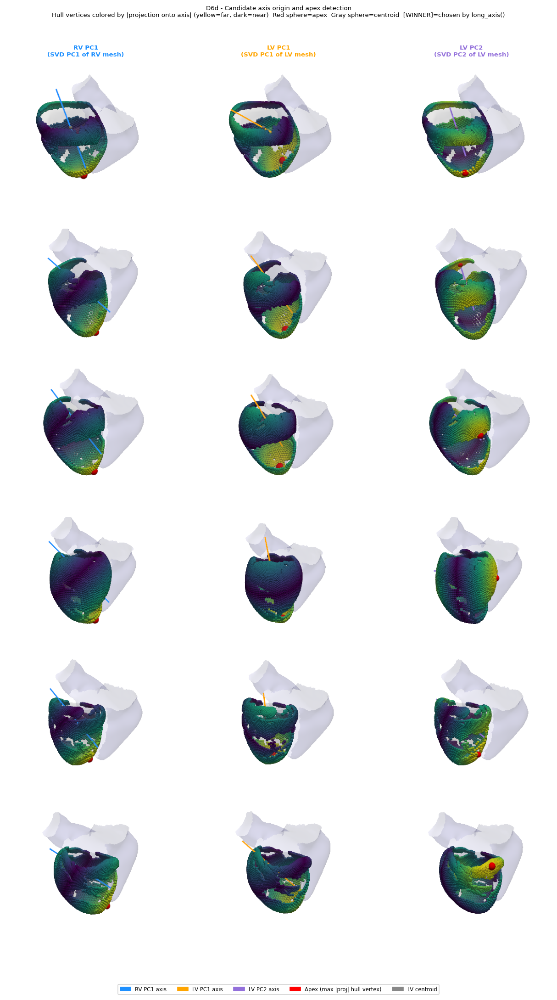

  Saved d6d_axis_method_explainer.png


In [20]:
# ----------------------------------------------------------
# D6d - How each candidate axis is obtained and apex found
#
# For each case, 3 panels (one per candidate type):
#   Col 0: RV PC1  - axis = SVD PC1 of RV mesh points
#   Col 1: LV PC1  - axis = SVD PC1 of LV mesh points
#   Col 2: LV PC2  - axis = SVD PC2 of LV mesh points
#
# Each panel shows:
#   - LV mesh (gray, transparent)
#   - RV mesh (blue, transparent) if available
#   - Convex hull vertices of LV: colored by |projection onto candidate axis|
#     (yellow = far from centroid along axis, dark = near)
#   - Candidate axis line (colored per method)
#   - Large RED sphere = apex selected by this candidate
#     (hull vertex with max |projection|)
#   - Small GRAY sphere = LV centroid
#
# Title shows: method | ecc | whether this candidate won
# ----------------------------------------------------------
from scipy.spatial import ConvexHull as _ConvexHull

_D6D_WIN    = (340, 290)
_D6D_NCASES = 6   # cases to show

_CAND_COLORS_D6D = {'RV PC1': 'dodgerblue', 'LV PC1': 'orange', 'LV PC2': 'mediumpurple'}

# use first N cohort cases that have a shell
_d6d_cases = [c for c in known if best_shell(c) is not None][:_D6D_NCASES]

_d6d_imgs   = []   # flat list, row-major: case0_col0, case0_col1, case0_col2, case1_col0, ...
_d6d_titles = []
_d6d_ncols  = 3    # always 3 cols (skip RV PC1 col if no RV but keep slot)

for _case in tqdm(_d6d_cases, desc='D6d render'):
    _shell = best_shell(_case)
    _rv    = best_rv_mesh(_case)
    _pts   = np.asarray(_shell.points)
    _center = _pts.mean(axis=0)
    _pid   = str(getattr(_case, 'patient_id', 'unknown'))

    # Compute LV SVD
    _, _sv_lv, _vt_lv = np.linalg.svd(_pts - _center, full_matrices=False)

    # Compute RV SVD if available
    _rv_axis = None
    if _rv is not None:
        try:
            _rv_pts2  = np.asarray(_rv.points)
            _rv_c2    = _rv_pts2.mean(axis=0)
            _, _, _rv_vt2 = np.linalg.svd(_rv_pts2 - _rv_c2, full_matrices=False)
            _rv_axis  = _rv_vt2[0]
        except Exception:
            pass

    # LV convex hull vertices
    try:
        _hull = _ConvexHull(_pts)
        _hull_pts = _pts[_hull.vertices]
    except Exception:
        _hull_pts = _pts

    # Evaluate all candidates to know the overall winner
    _all_cands = []
    if _rv_axis is not None:
        _all_cands.append(('RV PC1', _rv_axis))
    _all_cands.append(('LV PC1', _vt_lv[0]))
    if len(_sv_lv) > 1:
        _all_cands.append(('LV PC2', _vt_lv[1]))

    _all_eccs = []
    for _, _c in _all_cands:
        _ap, _ecc, _ = _hull_apex_candidate(_pts, _center, _c)
        _all_eccs.append(_ecc)
    _overall_winner_lbl = _all_cands[int(np.argmax(_all_eccs))][0]

    # 3 fixed slots: RV PC1 / LV PC1 / LV PC2
    _slot_defs = [
        ('RV PC1', _rv_axis),
        ('LV PC1', _vt_lv[0]),
        ('LV PC2', _vt_lv[1] if len(_sv_lv) > 1 else None),
    ]

    for _lbl, _cand_axis in _slot_defs:
        _col = _CAND_COLORS_D6D[_lbl]

        if _cand_axis is None:
            # No LV PC2 or no RV
            _d6d_imgs.append(None)
            _d6d_titles.append('{} | {} N/A'.format(_pid, _lbl))
            continue

        # Project hull vertices onto candidate axis (relative to centroid)
        _hull_proj = (_hull_pts - _center) @ _cand_axis   # signed projection
        _hull_abs  = np.abs(_hull_proj)

        # Apex = hull vertex with max |projection|
        _apex_idx  = int(np.argmax(_hull_abs))
        _apex_pt   = _hull_pts[_apex_idx]
        _apex_ecc  = float(_hull_abs[_apex_idx] / (
            ((_pts - _center) @ _cand_axis).max() -
            ((_pts - _center) @ _cand_axis).min()
        ) / 2.0 + 1e-9)
        _, _ecc_val, _ = _hull_apex_candidate(_pts, _center, _cand_axis)

        _pl = pv.Plotter(off_screen=True, window_size=_D6D_WIN)
        _pl.set_background('white')

        # LV shell
        _pl.add_mesh(_shell, color='#cccccc', opacity=0.12,
                     smooth_shading=True, show_scalar_bar=False)

        # RV mesh
        if _rv is not None:
            _pl.add_mesh(_rv, color='#aaaaff', opacity=0.18,
                         smooth_shading=True, show_scalar_bar=False)

        # Hull vertices colored by |projection| (viridis: dark=near, yellow=far)
        _cloud = pv.PolyData(_hull_pts)
        _cloud['proj'] = _hull_abs
        _pl.add_mesh(_cloud, scalars='proj', cmap='viridis',
                     point_size=6, render_points_as_spheres=True,
                     show_scalar_bar=False)

        # Candidate axis line (full LV span, colored per method)
        _full_proj = (_pts - _center) @ _cand_axis
        _fspan     = float(_full_proj.max() - _full_proj.min())
        _axis_line = pv.Line(_center - 0.55 * _fspan * _cand_axis,
                             _center + 0.55 * _fspan * _cand_axis)
        _pl.add_mesh(_axis_line, color=_col, line_width=3)

        # LV centroid (small gray sphere)
        _pl.add_mesh(pv.Sphere(radius=0.025 * _fspan, center=_center),
                     color='#888888', smooth_shading=True, show_scalar_bar=False)

        # Apex sphere (large red)
        _pl.add_mesh(pv.Sphere(radius=0.055 * _fspan, center=_apex_pt),
                     color='red', smooth_shading=True, show_scalar_bar=False)

        _pl.view_isometric()
        _pl.camera.zoom(1.15)
        _img_d6d = _pl.screenshot(None, return_img=True)
        _pl.close()

        _won = ' [WINNER]' if _lbl == _overall_winner_lbl else ''
        _d6d_imgs.append(_img_d6d)
        _d6d_titles.append('{} | {} | ecc={:.2f}{}'.format(_pid, _lbl, _ecc_val, _won))

# --- plot grid ---
import math as _math_d6d
import matplotlib.patches as _mpatches_d

_n_cases_d6d = len(_d6d_cases)
_col_headers = ['RV PC1\n(SVD PC1 of RV mesh)', 'LV PC1\n(SVD PC1 of LV mesh)', 'LV PC2\n(SVD PC2 of LV mesh)']

_fig_d6d, _axes_d6d = plt.subplots(
    _n_cases_d6d, _d6d_ncols,
    figsize=(_d6d_ncols * 3.6, _n_cases_d6d * 3.0),
)
if _n_cases_d6d == 1:
    _axes_d6d = [_axes_d6d]

_fig_d6d.suptitle(
    'D6d - Candidate axis origin and apex detection\n'
    'Hull vertices colored by |projection onto axis| (yellow=far, dark=near)  '
    'Red sphere=apex  Gray sphere=centroid  [WINNER]=chosen by long_axis()',
    fontsize=8,
)

# column headers
for _ci, _hdr in enumerate(_col_headers):
    _axes_d6d[0][_ci].set_title(_hdr, fontsize=8, color=list(_CAND_COLORS_D6D.values())[_ci],
                                 fontweight='bold', pad=14)

for _ri in range(_n_cases_d6d):
    for _ci in range(_d6d_ncols):
        _flat_idx = _ri * _d6d_ncols + _ci
        _ax = _axes_d6d[_ri][_ci]
        _ax.axis('off')
        _img_item = _d6d_imgs[_flat_idx]
        if _img_item is not None:
            _ax.imshow(_img_item)
        _ax.set_xlabel(_d6d_titles[_flat_idx], fontsize=5.5, labelpad=2)
        _ax.xaxis.set_label_position('bottom')

_legend_d = [
    _mpatches_d.Patch(color='dodgerblue',   label='RV PC1 axis'),
    _mpatches_d.Patch(color='orange',       label='LV PC1 axis'),
    _mpatches_d.Patch(color='mediumpurple', label='LV PC2 axis'),
    _mpatches_d.Patch(color='red',          label='Apex (max |proj| hull vertex)'),
    _mpatches_d.Patch(color='#888888',      label='LV centroid'),
]
_fig_d6d.legend(handles=_legend_d, loc='lower center', ncol=5,
                fontsize=7, framealpha=0.85, bbox_to_anchor=(0.5, -0.02))
plt.tight_layout(rect=[0, 0.04, 1, 0.97])
_d6d_path = OUT / 'd6d_axis_method_explainer.png'
plt.savefig(_d6d_path, bbox_inches='tight', dpi=110)
plt.show()
print('  Saved {}'.format(_d6d_path.name))


## Section 3 - Polar Map Construction

### 3.1 Computational Steps

Each case is rendered as one row of five panels showing the full projection pipeline:

| Step | Panel | What it shows |
|---|---|---|
| 1 | **Side view** | Aligned LV + CZ; green axis, red apex, blue septal vector |
| 2 | **Smashed** | Apex-to-base view; blue septal vector rolled to 10:30 |
| 3 | **theta coloring** | Smashed view; HSV rainbow = circumferential angle from septal reference |
| 4 | **s coloring** | Side view; blue = apex (s=0), red = base (s=1) |
| 5 | **Bull's-eye** | Final polar map: (s, theta) binned to 64 x 128 grid; red = CZ present |

Steps 3-5 show the coordinate system used by the polar map. The blue point on bull's-eye plots marks theta=0, the septal/RV reference used for binning.


Steps render: 100%|██████████| 4/4 [00:08<00:00,  2.11s/it]


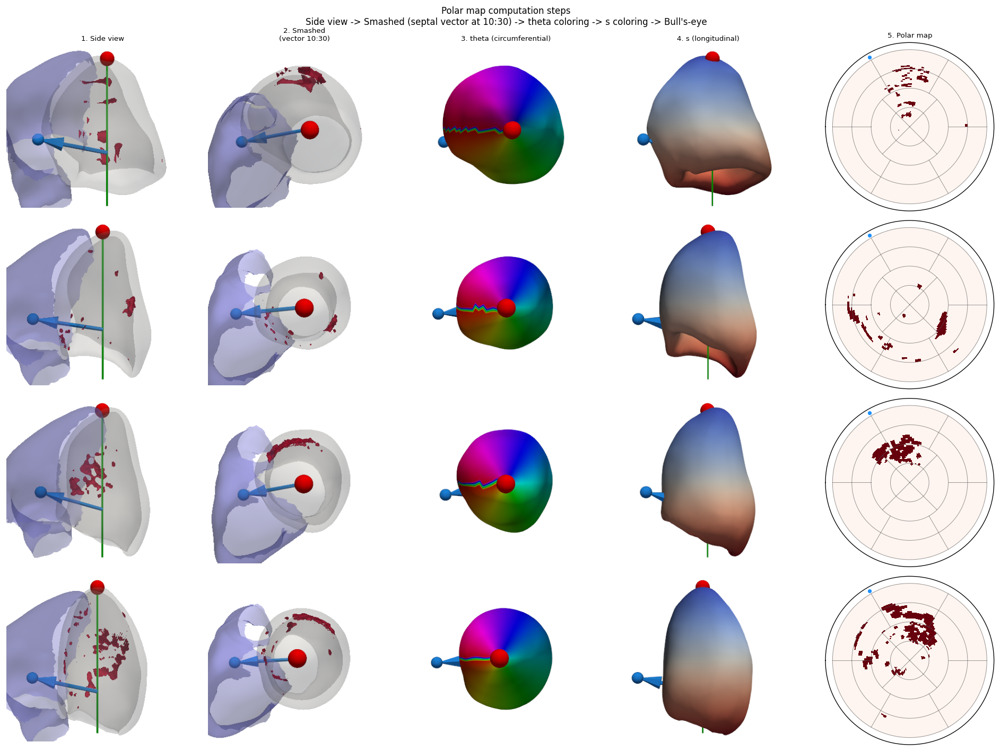

  Saved polar_map_steps.png  (4 cases)


In [21]:
import math as _math_steps

_STEPS_N   = 4   # cases to show
_STEPS_WIN = (380, 320)
_STEPS_COLS = 5  # side / smash / theta / s / bullseye

# Pick cases that have both shell and CZ
_steps_cases = [c for c in known if best_shell(c) is not None
                and get_cz_mesh(c) is not None][:_STEPS_N]

_nr_st = len(_steps_cases)
fig = plt.figure(figsize=(_STEPS_COLS * 3.2, _nr_st * 3.0))
fig.suptitle(
    'Polar map computation steps\n'
    'Side view -> Smashed (septal vector at 10:30) -> theta coloring -> s coloring -> Bull\'s-eye',
    fontsize=10,
)
_col_titles = ['1. Side view', '2. Smashed\n(vector 10:30)',
               '3. theta (circumferential)', '4. s (longitudinal)', '5. Polar map']

for _ri, _case in enumerate(tqdm(_steps_cases, desc='Steps render')):
    _shell = best_shell(_case)
    _cz    = get_cz_mesh(_case)
    _rv    = best_rv_mesh(_case)
    _pid   = str(getattr(_case, 'patient_id', 'unknown'))

    # Compute polar geometry with the current src.lv_geometry API.
    # Method C uses an RV-bound reference function; Method B is the PCA fallback.
    if _rv is not None:
        _ref_fn = lambda mesh, ax, ap, rv_mesh=_rv: rv_reference_from_rv_mesh(mesh, rv_mesh, ax, ap)
        _method = 'rv'
        _geom = prepare_polar_geometry(_shell, ref_fn=_ref_fn, rv_mesh=_rv)
    else:
        _ref_fn = rv_reference_pca
        _method = 'pca'
        _geom = prepare_polar_geometry(_shell, ref_fn=_ref_fn, rv_mesh=None)

    # s and theta for LV shell vertices
    _lv_pts = np.array(_shell.points)
    _lv_theta, _lv_s = project_points_to_polar(_lv_pts, _geom)
    # Bake CW flip (same as _polar_map_for_case)
    _lv_theta_cw = (2.0 * np.pi - _lv_theta) % (2.0 * np.pi)

    # Aligned transform, using the same reference function as the polar map.
    _R, _ap = compute_transform(_shell, align_septum=True, ref_fn=_ref_fn, rv_mesh=_rv)
    _Rd = _display_roll_matrix() @ _R
    _st = apply_transform(_shell, _Rd, _ap)
    _czt = apply_transform(_cz, _Rd, _ap)
    _rvt = apply_transform(_rv, _Rd, _ap) if _rv is not None else None

    _b    = np.array(_st.bounds, dtype=float)
    _c    = np.array([(_b[0]+_b[1])/2, (_b[2]+_b[3])/2, (_b[4]+_b[5])/2])
    _span = max(_b[1]-_b[0], _b[3]-_b[2], _b[5]-_b[4])
    _axln = pv.Line(np.zeros(3), np.array([0., 0., float(_b[5]-_b[4])]))
    _sph  = pv.Sphere(radius=0.05 * _span, center=np.zeros(3))
    _lv_centroid, _rv_centroid, _septal_vec = _septal_centroid_vector(_st, _rvt)

    _imgs = []

    # -- Panel 1: side view --------------------------------------------------
    _pl = pv.Plotter(off_screen=True, window_size=_STEPS_WIN)
    _pl.set_background('white')
    _pl.add_mesh(_st,  color='#cccccc', opacity=0.18, smooth_shading=True, show_scalar_bar=False)
    if _rvt is not None:
        _pl.add_mesh(_rvt, color='#8888ff', opacity=0.40, smooth_shading=True, show_scalar_bar=False)
    if _czt is not None:
        _pl.add_mesh(_czt, color='crimson', opacity=0.90, smooth_shading=True, show_scalar_bar=False)
    _pl.add_mesh(_axln, color='green', line_width=4)
    _pl.add_mesh(_sph,  color='red',   smooth_shading=True, show_scalar_bar=False)
    _add_septal_vector(_pl, _st, _rvt, _span)
    _pl.camera.position    = (float(_c[0]), float(_c[1]) + 2.5*_span, float(_c[2]))
    _pl.camera.focal_point = tuple(_c)
    _pl.camera.up          = (0., 0., -1.)
    _pl.camera.zoom(1.2)
    _imgs.append(_pl.screenshot(None, return_img=True)); _pl.close()

    # -- Panel 2: smashed (apex-to-base) -------------------------------------
    _pl = pv.Plotter(off_screen=True, window_size=_STEPS_WIN)
    _pl.set_background('white')
    _pl.add_mesh(_st,  color='#cccccc', opacity=0.18, smooth_shading=True, show_scalar_bar=False)
    if _rvt is not None:
        _pl.add_mesh(_rvt, color='#8888ff', opacity=0.45, smooth_shading=True, show_scalar_bar=False)
    if _czt is not None:
        _pl.add_mesh(_czt, color='crimson', opacity=0.90, smooth_shading=True, show_scalar_bar=False)
    _pl.add_mesh(_sph, color='red', smooth_shading=True, show_scalar_bar=False)
    _add_septal_vector(_pl, _st, _rvt, _span)
    _pl.camera.position    = (float(_c[0]), float(_c[1]), float(_b[4]) - 2.0*_span)
    _pl.camera.focal_point = tuple(_c)
    _pl.camera.up          = (0., -1., 0.)
    _pl.camera.zoom(1.25)
    _imgs.append(_pl.screenshot(None, return_img=True)); _pl.close()

    # -- Panel 3: theta coloring (smashed view) -------------------------------
    _sh3 = _st.copy()
    _sh3['theta_cw'] = _lv_theta_cw  # CW-baked theta, same as polar map
    _pl = pv.Plotter(off_screen=True, window_size=_STEPS_WIN)
    _pl.set_background('white')
    _pl.add_mesh(_sh3, scalars='theta_cw', cmap='hsv',
                 clim=[0, 2 * np.pi], smooth_shading=True, show_scalar_bar=False)
    _pl.add_mesh(_sph, color='red', smooth_shading=True, show_scalar_bar=False)
    _add_septal_vector(_pl, _st, _rvt, _span)
    _pl.camera.position    = (float(_c[0]), float(_c[1]), float(_b[4]) - 2.0*_span)
    _pl.camera.focal_point = tuple(_c)
    _pl.camera.up          = (0., -1., 0.)
    _pl.camera.zoom(1.25)
    _imgs.append(_pl.screenshot(None, return_img=True)); _pl.close()

    # -- Panel 4: s coloring (side view) -------------------------------------
    _sh4 = _st.copy()
    _sh4['s'] = np.clip(_lv_s, 0., 1.)
    _pl = pv.Plotter(off_screen=True, window_size=_STEPS_WIN)
    _pl.set_background('white')
    _pl.add_mesh(_sh4, scalars='s', cmap='coolwarm',
                 clim=[0, 1], smooth_shading=True, show_scalar_bar=False)
    _pl.add_mesh(_axln, color='green', line_width=3)
    _pl.add_mesh(_sph,  color='red',   smooth_shading=True, show_scalar_bar=False)
    _add_septal_vector(_pl, _st, _rvt, _span)
    _pl.camera.position    = (float(_c[0]), float(_c[1]) + 2.5*_span, float(_c[2]))
    _pl.camera.focal_point = tuple(_c)
    _pl.camera.up          = (0., 0., -1.)
    _pl.camera.zoom(1.2)
    _imgs.append(_pl.screenshot(None, return_img=True)); _pl.close()

    # -- Panel 5: bull's-eye polar map ----------------------------------------
    _pm = _polar_map_for_case(_case, use_rv=True)

    # Draw row in figure
    for _ci, (_img, _ctitle) in enumerate(zip(_imgs, _col_titles)):
        _ax = fig.add_subplot(_nr_st, _STEPS_COLS, _ri * _STEPS_COLS + _ci + 1)
        if _img is not None:
            _ax.imshow(_img)
        _ax.axis('off')
        if _ri == 0:
            _ax.set_title(_ctitle, fontsize=8)
        if _ci == 0:
            _ax.set_ylabel(f'{_pid}\n[{_method}]', fontsize=7, rotation=90, labelpad=4)

    # Panel 5 is polar - must use add_subplot with projection
    _ax_be = fig.add_subplot(_nr_st, _STEPS_COLS, _ri * _STEPS_COLS + 5, projection='polar')
    _ax_be.set_theta_zero_location('W')
    _ax_be.set_theta_direction(-1)
    if _pm is not None:
        _T5, _R5 = np.meshgrid(
            np.linspace(0, 2 * np.pi, N_THETA + 1),
            np.linspace(0, 1.0,       N_R + 1),
        )
        _ax_be.pcolormesh(_T5, _R5, _pm.astype(float),
                          cmap='Reds', vmin=0, vmax=1, shading='flat')
        _draw_bullseye_grid(_ax_be)
    if _ri == 0:
        _ax_be.set_title(_col_titles[4], fontsize=8)

plt.tight_layout()
plt.savefig(OUT / 'polar_map_steps.png', bbox_inches='tight', dpi=120)
plt.show()
print(f'  Saved polar_map_steps.png  ({len(_steps_cases)} cases)')


### 3.2 Trial - All-Case Polar Maps

### Long axis and apex

`long_axis(shell, rv_mesh)` uses robust SVD on LV shell vertices:

1. SVD on centred shell points -> PC1 is the principal elongation axis (apex <-> base)
2. **Apex** = shell vertex at the pointed tip of the LV along PC1
   (extremal end with highest geometric eccentricity)
3. When `rv_mesh` is provided, the axis orientation is resolved unambiguously
   (avoids flipping on pathological or truncated meshes)

### Polar coordinate system

After `prepare_polar_geometry(shell, ref_fn=...)`:

| Coord | Definition | Range |
|---|---|---|
| `s` | Normalised distance along long axis | 0 = apex (centre), 1 = base (outer ring) |
| `theta` | Circumferential angle from septal reference | 0 = RV / septum |

**Septal reference** (`ref`): direction from LV centroid toward RV insertion in the basal cross-section plane. Method C (RV mesh centroid) when RV available, else Method B (PCA of the concave half of the basal ring).

### Clockwise anatomical orientation (baked in)

`theta` from `project_points_to_polar` is CCW (mathematical convention). `_polar_map_for_case` flips it before binning:
```python
theta = (2.0 * np.pi - theta) % (2.0 * np.pi)
```
Every polar axis uses `set_theta_zero_location('W')` + `set_theta_direction(-1)`, giving the standard AHA apical bull's-eye view:

```
        ANT  (12 o'clock)
         |
SEPT ----+--- LAT
(left)   |    (right)
         |
        INF  (6 o'clock)
```

Below: per-patient bull's-eyes only. Population superposition is isolated in Section 3.3.


Polar maps (trial): 100%|██████████| 105/105 [00:32<00:00,  3.18it/s]


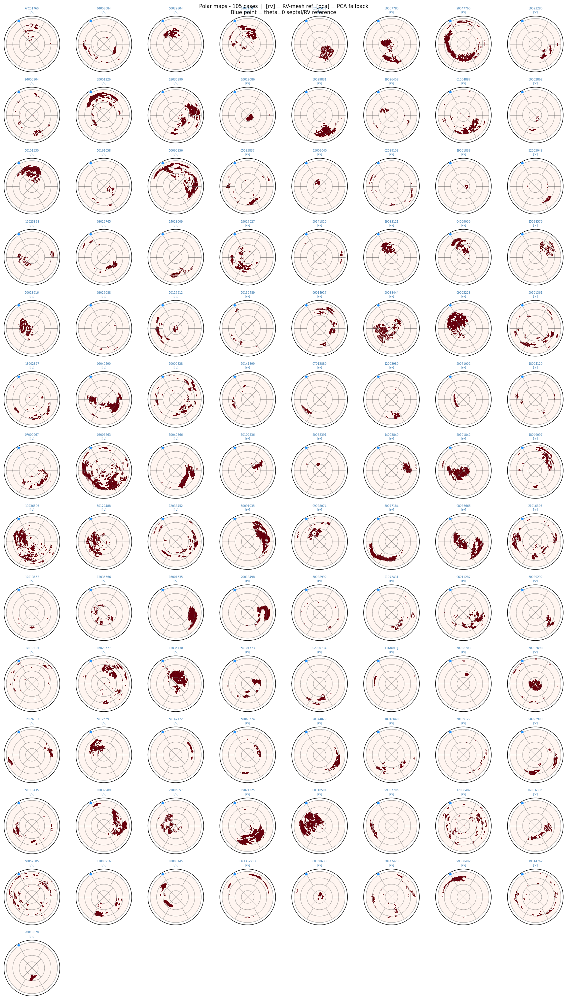

  Saved polar_maps_all_cases.png  (105 cases  105 rv / 0 pca)


In [22]:
import math as _math_trial

# Recompute pmaps if not already in scope.
if "pmaps" not in globals() or not pmaps:
    pmaps = {}
    for _case in tqdm(known, desc="Polar maps (trial)"):
        _key = f"{_case.year}/{_case.patient_id}"
        try:
            _m = _polar_map_for_case(_case, use_rv=True)
            if _m is not None:
                pmaps[_key] = _m.astype(float)
        except Exception as _e:
            print(f"  skip {_key}: {_e}")

_PM_NCOLS = 8
_PM_CELL  = 1.8
_pm_rows  = []
for _case in known:
    _rv  = best_rv_mesh(_case)
    _key = f"{_case.year}/{_case.patient_id}"
    _meth = "rv" if _rv is not None else "pca"
    if _key in pmaps:
        _pm_rows.append({"pid": str(getattr(_case, "patient_id", "unknown")),
                         "pm": pmaps[_key], "meth": _meth})

_n = len(_pm_rows)
if _n == 0:
    print("No per-patient polar maps available.")
else:
    _nrows = _math_trial.ceil(_n / _PM_NCOLS)
    _fig = plt.figure(figsize=(_PM_NCOLS * _PM_CELL, _nrows * _PM_CELL))
    _fig.suptitle(
        f"Polar maps - {_n} cases  |  [rv] = RV-mesh ref  [pca] = PCA fallback\n"
        "Blue point = theta=0 septal/RV reference",
        fontsize=9,
    )

    _T_pm, _R_pm = np.meshgrid(
        np.linspace(0, 2 * np.pi, N_THETA + 1),
        np.linspace(0, 1.0,       N_R + 1),
    )

    for _i, _row in enumerate(_pm_rows):
        _ax = _fig.add_subplot(_nrows, _PM_NCOLS, _i + 1, projection="polar")
        _ax.set_theta_zero_location("W")
        _ax.set_theta_direction(-1)
        _ax.pcolormesh(_T_pm, _R_pm, _row["pm"],
                       cmap="Reds", vmin=0, vmax=1, shading="flat")
        _draw_bullseye_grid(_ax)
        _col = "steelblue" if _row["meth"] == "rv" else "darkorange"
        _ax.set_title(f"{_row['pid']}\n[{_row['meth']}]", fontsize=5, color=_col)

    # Hide any unused grid slots.
    for _j in range(_n, _nrows * _PM_NCOLS):
        _ax_b = _fig.add_subplot(_nrows, _PM_NCOLS, _j + 1)
        _ax_b.axis("off")

    plt.tight_layout()
    _pm_path = OUT / "polar_maps_all_cases.png"
    plt.savefig(_pm_path, bbox_inches="tight", dpi=130)
    plt.show()
    print(f"  Saved {_pm_path.name}  ({_n} cases  "
          f"{sum(1 for r in _pm_rows if r['meth']=='rv')} rv / "
          f"{sum(1 for r in _pm_rows if r['meth']=='pca')} pca)")


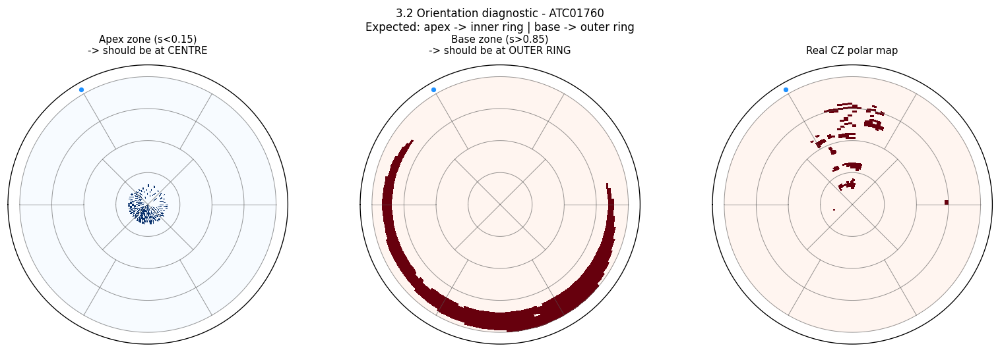

ORIENTATION OK - apex zone in inner rings (frac=1.00). No src change needed.


In [23]:
# 3.2 - Polar Orientation Diagnostic
# -------------------------------------------------------
# Verifies that the bull's-eye places APEX at the INNER ring
# (centre, r->0) and BASE at the OUTER ring.
# Standard AHA convention: apex = centre, base = outer ring.
#
# Method:
#   1. Take one case with shell.
#   2. Compute s-coordinate for every LV vertex.
#   3. Build synthetic 'apex scar' (s < 0.15) and
#      'base scar' (s > 0.85) polar maps.
#   4. Render both as bull's-eyes to confirm radial orientation.
#   5. If apex appears at the outer ring -> need [::-1, :] flip.
#
# Src fix (lv_geometry.py long_axis, lines 61-86):
#   _hull_apex_candidate uses argmax(abs(proj)) - can pick base
#   as apex if base is farther from centroid.
#   Fix: after finding best_apex, check RV proximity.
#   Cardiac apex is AWAY from RV. If best_apex closer to RV
#   than the other extreme, swap to the true apex.
#   Old line: best_axis = vec / norm if norm > 1e-9 else vt[0]
#   New code: cand_axis + RV proximity check + swap if needed.
# -------------------------------------------------------

_diag_case = next(
    (c for c in known if best_shell(c) is not None), None)

if _diag_case is None:
    print('No case with shell for orientation diagnostic.')
else:
    _d_shell = best_shell(_diag_case)
    _d_rv    = best_rv_mesh(_diag_case)
    _d_pid   = str(getattr(_diag_case, 'patient_id', 'unknown'))

    if _d_rv is not None:
        _d_rfn = lambda m, ax, ap, rv=_d_rv: rv_reference_from_rv_mesh(m, rv, ax, ap)
        _d_geom = prepare_polar_geometry(_d_shell, ref_fn=_d_rfn, rv_mesh=_d_rv)
    else:
        _d_geom = prepare_polar_geometry(_d_shell, rv_mesh=None)

    _d_theta, _d_s = project_points_to_polar(
        np.asarray(_d_shell.points), _d_geom)
    _d_theta_cw = (2.0 * np.pi - _d_theta) % (2.0 * np.pi)

    def _zone_map(s_vals, theta_vals, lo, hi, n_r=N_R, n_theta=N_THETA):
        mask = (s_vals >= lo) & (s_vals <= hi)
        pm   = np.zeros((n_r, n_theta), dtype=float)
        ri   = np.clip((s_vals[mask] * n_r).astype(int), 0, n_r - 1)
        ti   = np.clip((theta_vals[mask] / (2*np.pi) * n_theta).astype(int), 0, n_theta-1)
        pm[ri, ti] = 1.0
        return pm

    _d_apex_map = _zone_map(_d_s, _d_theta_cw, 0.00, 0.15)
    _d_base_map = _zone_map(_d_s, _d_theta_cw, 0.85, 1.00)
    _d_real_key = f'{_diag_case.year}/{_d_pid}'
    _d_real_map = pmaps.get(_d_real_key)

    _T_d, _R_d = np.meshgrid(
        np.linspace(0, 2*np.pi, N_THETA+1),
        np.linspace(0, 1.0, N_R+1),
    )
    _panels = [
        (_d_apex_map, 'Blues', 'Apex zone (s<0.15)\n-> should be at CENTRE'),
        (_d_base_map, 'Reds',  'Base zone (s>0.85)\n-> should be at OUTER RING'),
    ]
    if _d_real_map is not None:
        _panels.append((_d_real_map.astype(float), 'Reds', 'Real CZ polar map'))

    fig_od, axes_od = plt.subplots(
        1, len(_panels), figsize=(4.5*len(_panels), 4.5),
        subplot_kw={'projection': 'polar'})
    fig_od.suptitle(
        f'3.2 Orientation diagnostic - {_d_pid}\n'
        'Expected: apex -> inner ring | base -> outer ring',
        fontsize=10)
    for _ax, (_pm, _cmap, _ttl) in zip(axes_od, _panels):
        _ax.set_theta_zero_location('W')
        _ax.set_theta_direction(-1)
        _ax.pcolormesh(_T_d, _R_d, _pm, cmap=_cmap, vmin=0, vmax=1, shading='flat')
        _draw_bullseye_grid(_ax)
        _ax.set_title(_ttl, fontsize=9, pad=10)

    plt.tight_layout()
    plt.savefig(OUT / 'polar_orientation_diagnostic.png', bbox_inches='tight')
    plt.show()

    # Verdict
    _inner = _d_apex_map[:N_R//4, :].sum()
    _total = _d_apex_map.sum()
    _frac  = _inner / (_total + 1e-9)
    if _frac > 0.5:
        print(f'ORIENTATION OK - apex zone in inner rings (frac={_frac:.2f}). '
              'No src change needed.')
    else:
        print(f'ORIENTATION ISSUE - apex NOT in inner rings (frac={_frac:.2f}).')
        print('  Fix in notebook: pm_fixed = pm[::-1, :]')
        print('  Fix in src/lv_geometry.py project_points_to_polar:')
        print('  # OLD: s = clip((s_raw - s_min) / span, 0, 1)')
        print('  # NEW: s = clip(1.0 - (s_raw - s_min) / span, 0, 1)')


Validation: 100%|██████████| 6/6 [00:02<00:00,  2.35it/s]


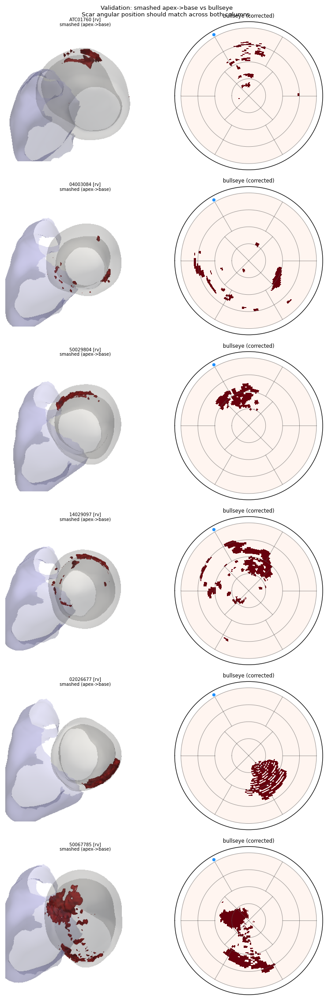

Saved validation_bullseye_corrected.png


In [24]:
# ============================================================
# Validation: smashed apex->base vs corrected bullseye
# X-axis flip baked into _polar_mask (mask[:, ::-1]).
# long_axis now uses RV-proximity disambiguation.
# ============================================================

_VAL_N    = min(len(known), 6)
_VAL_WIN  = (340, 280)

_T_f, _R_f = np.meshgrid(
    np.linspace(0, 2*np.pi, N_THETA+1),
    np.linspace(0, 1.0,     N_R+1),
)

_val_cases = [c for c in known
              if best_shell(c) is not None and get_cz_mesh(c) is not None][:_VAL_N]

fig_v = plt.figure(figsize=(2 * 3.2, len(_val_cases) * 3.2))
fig_v.suptitle(
    'Validation: smashed apex->base vs bullseye\n'
    'Scar angular position should match across both columns.',
    fontsize=8,
)

for _riv, _case in enumerate(tqdm(_val_cases, desc='Validation')):
    _sh  = best_shell(_case)
    _cz  = get_cz_mesh(_case)
    _rv  = best_rv_mesh(_case)
    _pid = str(getattr(_case, 'patient_id', 'unknown'))

    if _rv is not None:
        _rfn  = lambda m, ax, ap, rv=_rv: rv_reference_from_rv_mesh(m, rv, ax, ap)
        _meth = 'rv'
    else:
        _rfn  = rv_reference_pca
        _meth = 'pca'

    _R, _ap = compute_transform(_sh, align_septum=True, ref_fn=_rfn, rv_mesh=_rv)
    _Rd  = _display_roll_matrix() @ _R
    _st  = apply_transform(_sh, _Rd, _ap)
    _czt = apply_transform(_cz, _Rd, _ap)
    _rvt = apply_transform(_rv, _Rd, _ap) if _rv is not None else None

    _b  = np.array(_st.bounds, dtype=float)
    _c  = np.array([(_b[0]+_b[1])/2, (_b[2]+_b[3])/2, (_b[4]+_b[5])/2])
    _sp = max(_b[1]-_b[0], _b[3]-_b[2], _b[5]-_b[4])

    _pl = pv.Plotter(off_screen=True, window_size=_VAL_WIN)
    _pl.set_background('white')
    _pl.add_mesh(_st,  color='#cccccc', opacity=0.18, smooth_shading=True, show_scalar_bar=False)
    _pl.add_mesh(_czt, color='firebrick', opacity=0.95, smooth_shading=True, show_scalar_bar=False)
    if _rvt is not None:
        _pl.add_mesh(_rvt, color='#aaaaff', opacity=0.30, smooth_shading=True, show_scalar_bar=False)
    _pl.camera.position    = (float(_c[0]), float(_c[1]), float(_b[4]) - 2.0*_sp)
    _pl.camera.focal_point = tuple(_c)
    _pl.camera.up          = (0., -1., 0.)
    _pl.camera.zoom(1.2)
    _img = _pl.screenshot(None, return_img=True)
    _pl.close()

    _geom   = prepare_polar_geometry(_sh, ref_fn=_rfn, rv_mesh=_rv)
    _t, _s  = project_points_to_polar(np.asarray(_cz.points), _geom)
    _t_cw   = (2*np.pi - _t) % (2*np.pi)
    _pm     = _polar_mask(_t_cw, _s).astype(float)  # already X-flipped inside

    ax_sm = fig_v.add_subplot(len(_val_cases), 2, _riv*2 + 1)
    ax_sm.imshow(_img)
    ax_sm.axis('off')
    ax_sm.set_title(f'{_pid} [{_meth}]\nsmashed (apex->base)', fontsize=6)

    ax_b = fig_v.add_subplot(len(_val_cases), 2, _riv*2 + 2, projection='polar')
    ax_b.set_theta_zero_location('W')
    ax_b.set_theta_direction(-1)
    ax_b.pcolormesh(_T_f, _R_f, _pm, cmap='Reds', vmin=0, vmax=1, shading='flat')
    _draw_bullseye_grid(ax_b)
    _mark_septal_point(ax_b)
    ax_b.set_title('bullseye (corrected)', fontsize=7)

plt.tight_layout()
plt.savefig(OUT / 'validation_bullseye_corrected.png', bbox_inches='tight', dpi=130)
plt.show()
print('Saved validation_bullseye_corrected.png')


### 3.3 Population Polar-Map Superposition

Pixel-wise mean scar fraction across all patients. Each pixel shows the fraction of patients with scar at that (r, theta) location. First row: all patients; second row: split by sex.

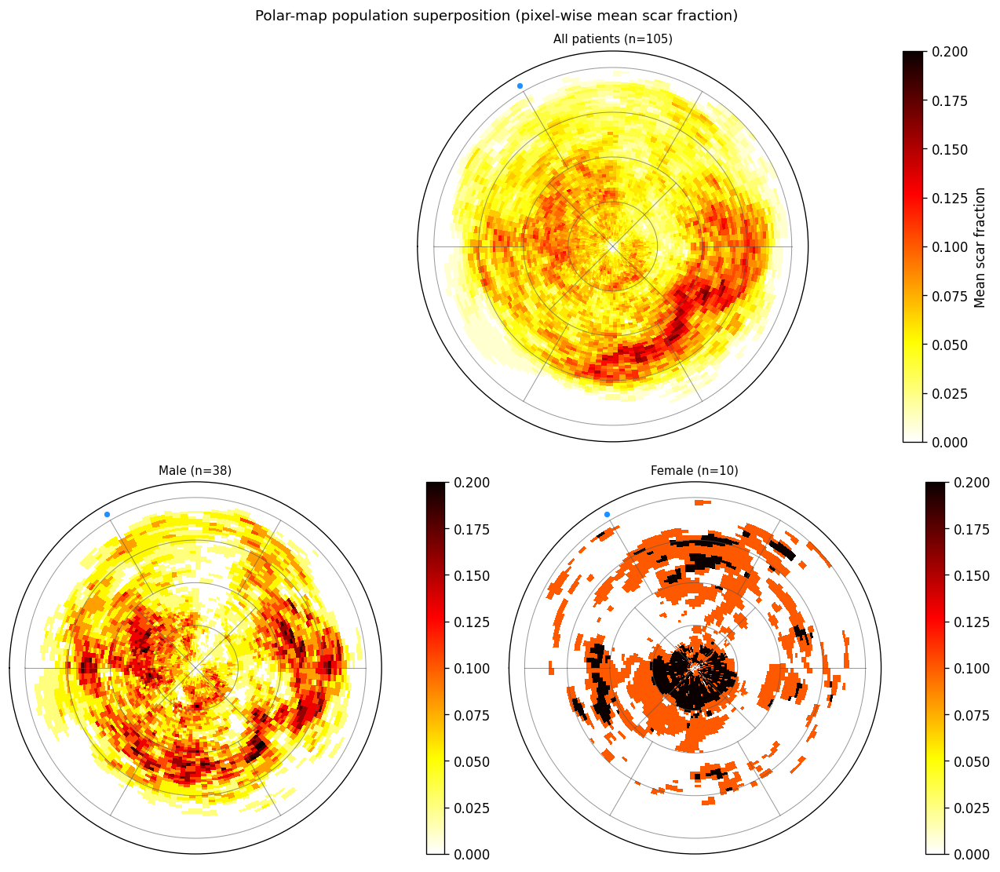

Saved polar_maps_superposition.png


In [25]:
pmaps   = globals().get('pmaps', {})
sex_map = globals().get('sex_map', {})

if not pmaps:
    print('No polar maps available. Run Section 3.2 first.')
else:
    _pm_items = [(k, np.asarray(v, dtype=float)) for k, v in pmaps.items()]

    def _mean_scar_map(items):
        stack = np.stack([v for _, v in items], axis=0)
        return stack.mean(axis=0)   # pixel-wise mean scar fraction

    def _draw_superposition(ax, scar_map, title, vmax):
        T, R = np.meshgrid(
            np.linspace(0, 2 * np.pi, scar_map.shape[1] + 1),
            np.linspace(0,       1.0, scar_map.shape[0] + 1),
        )
        ax.set_theta_zero_location('W')
        ax.set_theta_direction(-1)
        mesh = ax.pcolormesh(T, R, scar_map, cmap='hot_r', vmin=0, vmax=vmax, shading='flat')
        _draw_bullseye_grid(ax)
        ax.set_title(title, fontsize=9, pad=6)
        return mesh

    _all_map = _mean_scar_map(_pm_items)
    _sex_groups = []
    for _sex_label, _title in [('M', 'Male'), ('F', 'Female')]:
        _items = [(k, v) for k, v in _pm_items if sex_map.get(k.split('/')[1]) == _sex_label]
        if _items:
            _sex_groups.append((_title, len(_items), _mean_scar_map(_items)))

    _all_vals = np.concatenate([_all_map.ravel()] + [g[2].ravel() for g in _sex_groups])
    _vmax = float(np.nanpercentile(_all_vals[np.isfinite(_all_vals)], 99)) if _all_vals.size else 1.0
    _vmax = max(_vmax, 1e-12)

    _n_bottom = max(len(_sex_groups), 1)
    _fig = plt.figure(figsize=(5.4 * _n_bottom, 9.4))
    _gs = _fig.add_gridspec(2, _n_bottom, height_ratios=[1.05, 1.0])
    _fig.suptitle('Polar-map population superposition (pixel-wise mean scar fraction)', fontsize=11)

    _ax_all = _fig.add_subplot(_gs[0, :], projection='polar')
    _mesh_all = _draw_superposition(_ax_all, _all_map,
                                    f'All patients (n={len(_pm_items)})', _vmax)
    plt.colorbar(_mesh_all, ax=_ax_all, fraction=0.046, pad=0.10,
                 label='Mean scar fraction')

    if _sex_groups:
        for _i, (_title, _n_group, _smap) in enumerate(_sex_groups):
            _ax = _fig.add_subplot(_gs[1, _i], projection='polar')
            _mesh = _draw_superposition(_ax, _smap, f'{_title} (n={_n_group})', _vmax)
            plt.colorbar(_mesh, ax=_ax, fraction=0.046, pad=0.10)
        for _j in range(len(_sex_groups), _n_bottom):
            _fig.add_subplot(_gs[1, _j]).axis('off')
    else:
        _ax_miss = _fig.add_subplot(_gs[1, :])
        _ax_miss.axis('off')
        _ax_miss.text(0.5, 0.5, 'Sex labels unavailable', ha='center', va='center', fontsize=10)

    plt.tight_layout()
    _out = OUT / 'polar_maps_superposition.png'
    plt.savefig(_out, bbox_inches='tight', dpi=150)
    plt.show()
    print(f'Saved {_out.name}')

## Section 4 - Polar-Map Quality Checks

Checks 1-4 validate axis/orientation, coordinate colouring, and method agreement. Check 4f adds complementary population scar-profile plots derived from the same `pmaps` stack.


### 4.1 Shared QC Rendering Helpers


In [26]:
# ============================================================
# Shared QC rendering helpers
# ============================================================

_QC_NCOLS      = 6
_QC_WIN        = (400, 400)
_QC_SUBSET     = 12
_QC_Z_LO       = 0.60
_QC_Z_HI       = 0.85
_QC_OOR_THRESH = 0.05


def _qc_prepare(case):
    """Align mesh; return per-vertex geometry + both R_original and R_disp.
    Uses RV mesh for reference when available (Method C), else PCA (Method B).
    """
    shell = best_shell(case)
    if shell is None:
        return None
    cz = get_cz_mesh(case)
    rv = best_rv_mesh(case)

    axis, apex = long_axis(shell, rv)
    u, w       = plane_basis(axis)

    if rv is not None:
        ref_raw    = rv_reference_from_rv_mesh(shell, rv, axis, apex)
        ref_method = 'rv'
        ref_fn     = lambda mesh, ax, ap: rv_reference_from_rv_mesh(mesh, rv, ax, ap)
    else:
        ref_raw    = rv_reference_pca(shell, axis, apex)
        ref_method = 'pca'
        ref_fn     = rv_reference_pca

    ref       = oriented_septal_reference(ref_raw)
    ref_angle = np.arctan2(np.dot(ref, w), np.dot(ref, u))

    lv_pts   = np.array(shell.points)
    lv_s_raw = (lv_pts - apex) @ axis
    s_min    = float(lv_s_raw.min())
    s_max    = float(lv_s_raw.max())
    s_span   = s_max - s_min + 1e-9

    s_vals     = np.clip((lv_s_raw - s_min) / s_span, 0., 1.)
    v_perp     = lv_pts - apex - np.outer(lv_s_raw, axis)
    theta_vals = (np.arctan2(v_perp @ w, v_perp @ u) - ref_angle) % (2 * np.pi)

    mask_basal     = ((lv_s_raw - s_min) / s_span >= _QC_Z_LO) & \
                     ((lv_s_raw - s_min) / s_span <= _QC_Z_HI)
    basal_centroid = lv_pts[mask_basal].mean(axis=0) if mask_basal.sum() > 5 else apex

    R_original, apex_raw = compute_transform(shell, align_septum=True, ref_fn=ref_fn, rv_mesh=rv)
    R_disp  = rotation_about_z(np.pi) @ R_original
    shell_t = apply_transform(shell, R_disp, apex_raw)
    cz_t    = apply_transform(cz, R_disp, apex_raw) if cz is not None else None
    rv_t    = apply_transform(rv, R_disp, apex_raw) if rv is not None else None

    bc_aligned  = (basal_centroid - apex_raw) @ R_disp.T
    ref_aligned = ref @ R_original.T

    return dict(
        shell=shell, shell_t=shell_t, cz=cz, cz_t=cz_t, rv=rv, rv_t=rv_t,
        span=s_span, s_min=s_min, s_max=s_max,
        axis=axis, apex=apex, u=u, w=w, ref=ref, ref_method=ref_method,
        s_vals=s_vals, theta_vals=theta_vals,
        bc_aligned=bc_aligned, ref_aligned=ref_aligned,
        R_original=R_original, R_disp=R_disp, apex_raw=apex_raw,
    )


def _qc_tilt_camera(pl, shell_t, span):
    """Tilted apex-to-base: axis visible as diagonal line, arrow readable."""
    b      = np.array(shell_t.bounds, dtype=float)
    center = np.array([(b[0]+b[1])/2, (b[2]+b[3])/2, (b[4]+b[5])/2])
    tilt   = 0.40
    dist   = 2.2 * span
    pl.camera.position    = tuple(center + np.array([0., -tilt * dist, -dist]))
    pl.camera.focal_point = tuple(center)
    pl.camera.up          = (0., -1., 0.)
    pl.camera.zoom(1.2)


def _qc_side_camera(pl, shell_t, span):
    """Side view (+Y -> -Y): shows s gradient from apex (bottom) to base (top)."""
    b      = np.array(shell_t.bounds, dtype=float)
    center = np.array([(b[0]+b[1])/2, (b[2]+b[3])/2, (b[4]+b[5])/2])
    dist   = 2.5 * span
    pl.camera.position    = (center[0], center[1] + dist, center[2])
    pl.camera.focal_point = tuple(center)
    pl.camera.up          = (0., 0., 1.)   # +Z = base = up
    pl.camera.zoom(1.2)


def _qc_apex_camera(pl, shell_t, span):
    """Pure apex-to-base view: best for circumferential theta."""
    b      = np.array(shell_t.bounds, dtype=float)
    center = np.array([(b[0]+b[1])/2, (b[2]+b[3])/2, (b[4]+b[5])/2])
    pl.camera.position    = (center[0], center[1], b[4] - 2.0 * span)
    pl.camera.focal_point = tuple(center)
    pl.camera.up          = (0., -1., 0.)
    pl.camera.zoom(1.2)


def _qc_grid(imgs, labels, title, path, ncols=_QC_NCOLS, cell_in=2.2):
    n     = len(imgs)
    nrows = max(1, int(np.ceil(n / ncols)))
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * cell_in, nrows * cell_in))
    fig.suptitle(title, fontsize=9)
    axes_flat = np.array(axes).ravel()
    for ax in axes_flat:
        ax.axis('off')
    for ax, img, lbl in zip(axes_flat, imgs, labels):
        if img is not None:
            ax.imshow(img)
        ax.set_title(lbl, fontsize=6)
    plt.tight_layout()
    plt.savefig(path, bbox_inches='tight', dpi=110)
    plt.show()
    print(f'  Saved {path.name}')


# ----------------------------------------------------------


### 4.2 Check 1 - Axis and Anatomical Orientation



== CHECK 1: axis comparison + anatomical orientation ==


C1 render: 100%|██████████| 12/12 [00:21<00:00,  1.76s/it]


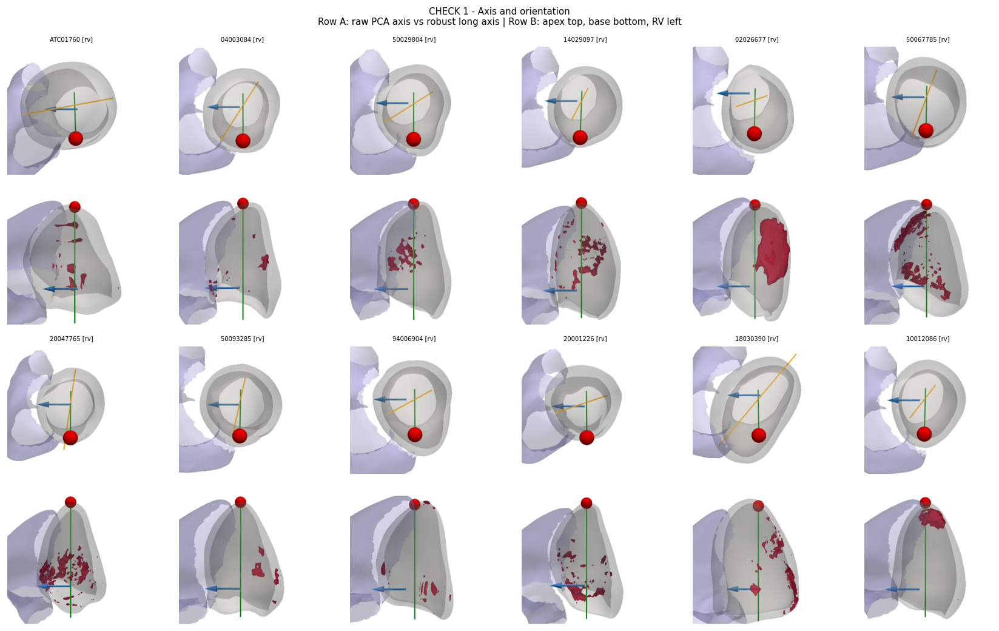

  Saved polar_map_qc_axis_orientation.png


In [27]:
# CHECK 1 - Axis comparison and anatomical orientation
#
# One case block has two rows:
#   Row A: tilted axis comparison.
#          Orange = raw LV SVD PC1; green = robust long axis used for alignment.
#   Row B: side-view orientation.
#          Apex should be top, base bottom, and RV left.
# ----------------------------------------------------------
print('\n== CHECK 1: axis comparison + anatomical orientation ==')

c1_axis_imgs, c1_side_imgs, c1_labels = [], [], []
for case in tqdm(known[:_QC_SUBSET], desc='C1 render'):
    key = f'{case.year}/{case.patient_id}'
    axis_img = None
    side_img = None
    _g = None
    try:
        _g = _qc_prepare(case)
        if _g is None:
            raise ValueError('no shell')

        shell_t = _g['shell_t']
        span = _g['span']
        bc = _g['bc_aligned']
        apex_sph = pv.Sphere(radius=0.05 * span, center=np.zeros(3))

        # Row A - raw PCA axis vs robust long axis.
        robust_line = pv.Line([0., 0., 0.], [0., 0., span])
        _shell_pts = np.array(_g['shell'].points)
        _center = _shell_pts.mean(axis=0)
        _, _, _vt = np.linalg.svd(_shell_pts - _center, full_matrices=False)
        _pc1_raw = _vt[0]
        _pc1_proj = (_shell_pts - _center) @ _pc1_raw
        if np.dot(_center - _shell_pts[_pc1_proj.argmin()], _pc1_raw) < 0:
            _pc1_raw = -_pc1_raw
        _pc1_disp = _pc1_raw @ _g['R_disp'].T
        _cen_disp = (_center - _g['apex_raw']) @ _g['R_disp'].T
        raw_line = pv.Line(_cen_disp - 0.55 * span * _pc1_disp,
                           _cen_disp + 0.55 * span * _pc1_disp)
        ref_disp = _g['ref'] @ _g['R_disp'].T
        arrow_end = bc + 0.30 * span * ref_disp

        pl = pv.Plotter(off_screen=True, window_size=_QC_WIN)
        pl.set_background('white')
        pl.add_mesh(shell_t, color='#bbbbbb', opacity=0.22, smooth_shading=True, show_scalar_bar=False)
        if _g['rv_t'] is not None:
            pl.add_mesh(_g['rv_t'], color='#aaaaff', opacity=0.35, smooth_shading=True, show_scalar_bar=False)
        pl.add_mesh(raw_line, color='orange', line_width=4)
        pl.add_mesh(robust_line, color='green', line_width=4)
        pl.add_mesh(apex_sph, color='red', smooth_shading=True, show_scalar_bar=False)
        pl.add_arrows(bc[np.newaxis], (arrow_end - bc)[np.newaxis], color='dodgerblue', mag=1.0)
        _qc_tilt_camera(pl, shell_t, span)
        axis_img = pl.screenshot(None, return_img=True)
        pl.close()

        # Row B - anatomical side view: apex top, RV left.
        axis_disp = _g['axis'] @ _g['R_disp'].T
        axis_line = pv.Line(np.zeros(3), span * axis_disp)
        b = np.array(shell_t.bounds, dtype=float)
        center = np.array([(b[0]+b[1])/2, (b[2]+b[3])/2, (b[4]+b[5])/2])
        dist = 2.5 * span
        pl = pv.Plotter(off_screen=True, window_size=_QC_WIN)
        pl.set_background('white')
        pl.add_mesh(shell_t, color='#bbbbbb', opacity=0.22, smooth_shading=True, show_scalar_bar=False)
        if _g['rv_t'] is not None:
            pl.add_mesh(_g['rv_t'], color='#aaaaff', opacity=0.35, smooth_shading=True, show_scalar_bar=False)
        if _g['cz_t'] is not None:
            pl.add_mesh(_g['cz_t'], color='crimson', opacity=0.90, smooth_shading=True, show_scalar_bar=False)
        pl.add_mesh(axis_line, color='green', line_width=4)
        pl.add_mesh(apex_sph, color='red', smooth_shading=True, show_scalar_bar=False)
        pl.add_arrows(bc[np.newaxis], (arrow_end - bc)[np.newaxis], color='dodgerblue', mag=1.0)
        pl.camera.position = (center[0], center[1] + dist, center[2])
        pl.camera.focal_point = tuple(center)
        pl.camera.up = (0., 0., -1.)
        pl.camera.zoom(1.2)
        side_img = pl.screenshot(None, return_img=True)
        pl.close()
    except Exception as e:
        print(f'  skip {key}: {e}')

    c1_axis_imgs.append(axis_img)
    c1_side_imgs.append(side_img)
    method = _g['ref_method'] if _g is not None else 'unknown'
    c1_labels.append(f'{getattr(case, "patient_id", "unknown")} [{method}]')

_n1 = len(c1_labels)
_ncols1 = min(_QC_NCOLS, max(_n1, 1))
_nrows1 = 2 * int(np.ceil(max(_n1, 1) / _ncols1))
fig, axes = plt.subplots(_nrows1, _ncols1, figsize=(_ncols1 * 2.4, _nrows1 * 2.2), squeeze=False)
fig.suptitle(
    'CHECK 1 - Axis and orientation\n'
    'Row A: raw PCA axis vs robust long axis | Row B: apex top, base bottom, RV left',
    fontsize=9,
)
for ax in axes.ravel():
    ax.axis('off')
for i, label in enumerate(c1_labels):
    col = i % _ncols1
    row_axis = 2 * (i // _ncols1)
    row_side = row_axis + 1
    if c1_axis_imgs[i] is not None:
        axes[row_axis, col].imshow(c1_axis_imgs[i])
    if c1_side_imgs[i] is not None:
        axes[row_side, col].imshow(c1_side_imgs[i])
    axes[row_axis, col].set_title(label, fontsize=6)
    if col == 0:
        axes[row_axis, col].set_ylabel('axis', fontsize=7, rotation=90, labelpad=4)
        axes[row_side, col].set_ylabel('orient', fontsize=7, rotation=90, labelpad=4)
plt.tight_layout()
plt.savefig(OUT / 'polar_map_qc_axis_orientation.png', bbox_inches='tight', dpi=110)
plt.show()
print('  Saved polar_map_qc_axis_orientation.png')


### 4.3 Check 2 - Longitudinal s-coordinate Sanity



== CHECK 2: s-coloring (side view) ==


C2 render:   0%|          | 0/12 [00:00<?, ?it/s]

C2 render: 100%|██████████| 12/12 [00:10<00:00,  1.17it/s]


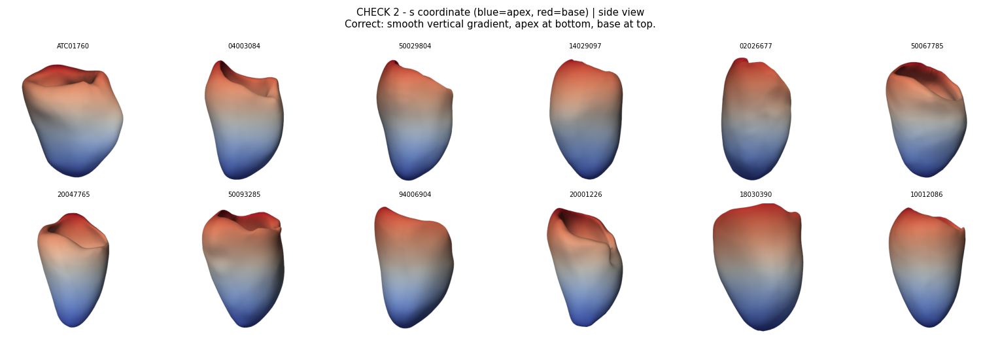

  Saved polar_map_qc_s_coloring.png


In [28]:
# CHECK 2 - s coordinate coloring (side view)
# ----------------------------------------------------------
print('\n== CHECK 2: s-coloring (side view) ==')
c2_imgs, c2_labels = [], []
for case in tqdm(known[:_QC_SUBSET], desc='C2 render'):
    key = f'{case.year}/{case.patient_id}'
    img = None
    try:
        g = _qc_prepare(case)
        if g is None:
            raise ValueError('no shell')
        sh = g['shell_t'].copy()
        sh['s'] = g['s_vals']
        pl = pv.Plotter(off_screen=True, window_size=_QC_WIN)
        pl.set_background('white')
        pl.add_mesh(sh, scalars='s', cmap='coolwarm',
                    clim=[0, 1], smooth_shading=True, show_scalar_bar=False)
        _qc_side_camera(pl, sh, g['span'])
        img = pl.screenshot(None, return_img=True)
        pl.close()
    except Exception as e:
        print(f'  skip {key}: {e}')
    c2_imgs.append(img)
    c2_labels.append(str(getattr(case, 'patient_id', 'unknown')))

_qc_grid(c2_imgs, c2_labels,
         'CHECK 2 - s coordinate (blue=apex, red=base) | side view\n'
         'Correct: smooth vertical gradient, apex at bottom, base at top.',
         OUT / 'polar_map_qc_s_coloring.png')




# ----------------------------------------------------------


### 4.4 Check 3 - Circumferential theta-coordinate Sanity



== CHECK 3: theta-coloring (apex-to-base view) ==


C3 render: 100%|██████████| 12/12 [00:16<00:00,  1.38s/it]


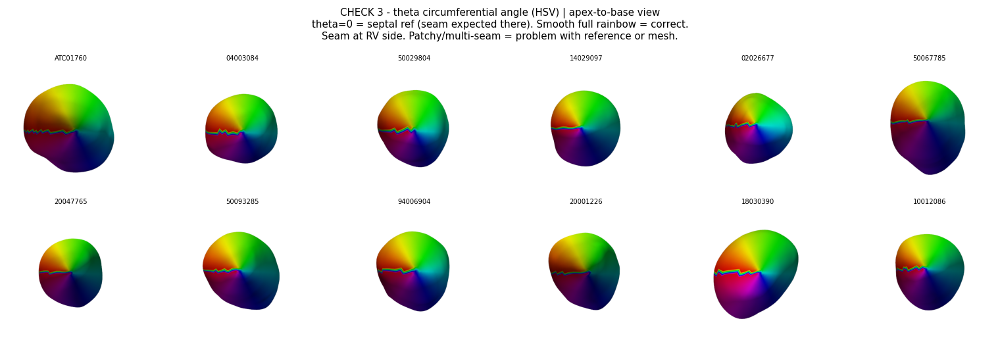

  Saved polar_map_qc_theta_coloring.png


In [29]:
# CHECK 3 - theta angle coloring (apex-to-base view)
#
# theta is the circumferential coordinate around the long axis:
#   theta = 0        -> septal reference direction (RV insertion or PCA ref)
#   theta = pi/2     -> 90 deg CCW from septum (anterior, in typical anatomy)
#   theta = pi       -> opposite the septal direction (lateral wall)
#   theta = 3*pi/2   -> inferior wall
#
# A smooth, continuous rainbow wrapping once around the ventricle = correct
# circumferential parameterisation.  The colour seam (where the HSV rainbow
# resets from red back to red) marks theta = 0/2pi - i.e. the septal direction.
# Expect the seam at the RV insertion side.
#
# Red flags: patchy/discontinuous colour bands, multiple seams, or large
# monochromatic regions -> mesh gaps, incorrect axis, or misaligned reference.
# ----------------------------------------------------------
print('\n== CHECK 3: theta-coloring (apex-to-base view) ==')
c3_imgs, c3_labels = [], []
for case in tqdm(known[:_QC_SUBSET], desc='C3 render'):
    key = f'{case.year}/{case.patient_id}'
    img = None
    try:
        g = _qc_prepare(case)
        if g is None:
            raise ValueError('no shell')
        sh = g['shell_t'].copy()
        sh['theta'] = g['theta_vals']
        pl = pv.Plotter(off_screen=True, window_size=_QC_WIN)
        pl.set_background('white')
        pl.add_mesh(sh, scalars='theta', cmap='hsv',
                    clim=[0, 2 * np.pi], smooth_shading=True, show_scalar_bar=False)
        _qc_apex_camera(pl, sh, g['span'])
        img = pl.screenshot(None, return_img=True)
        pl.close()
    except Exception as e:
        print(f'  skip {key}: {e}')
    c3_imgs.append(img)
    c3_labels.append(str(getattr(case, 'patient_id', 'unknown')))

_qc_grid(c3_imgs, c3_labels,
         'CHECK 3 - theta circumferential angle (HSV) | apex-to-base view\n'
         'theta=0 = septal ref (seam expected there). Smooth full rainbow = correct.\n'
         'Seam at RV side. Patchy/multi-seam = problem with reference or mesh.',
         OUT / 'polar_map_qc_theta_coloring.png')


# ----------------------------------------------------------


### 4.5 Check 4 - 3D-to-Bullseye Method Comparison



== CHECK 4: 3D + Method C / Method B bull's-eyes (per-method rows) ==


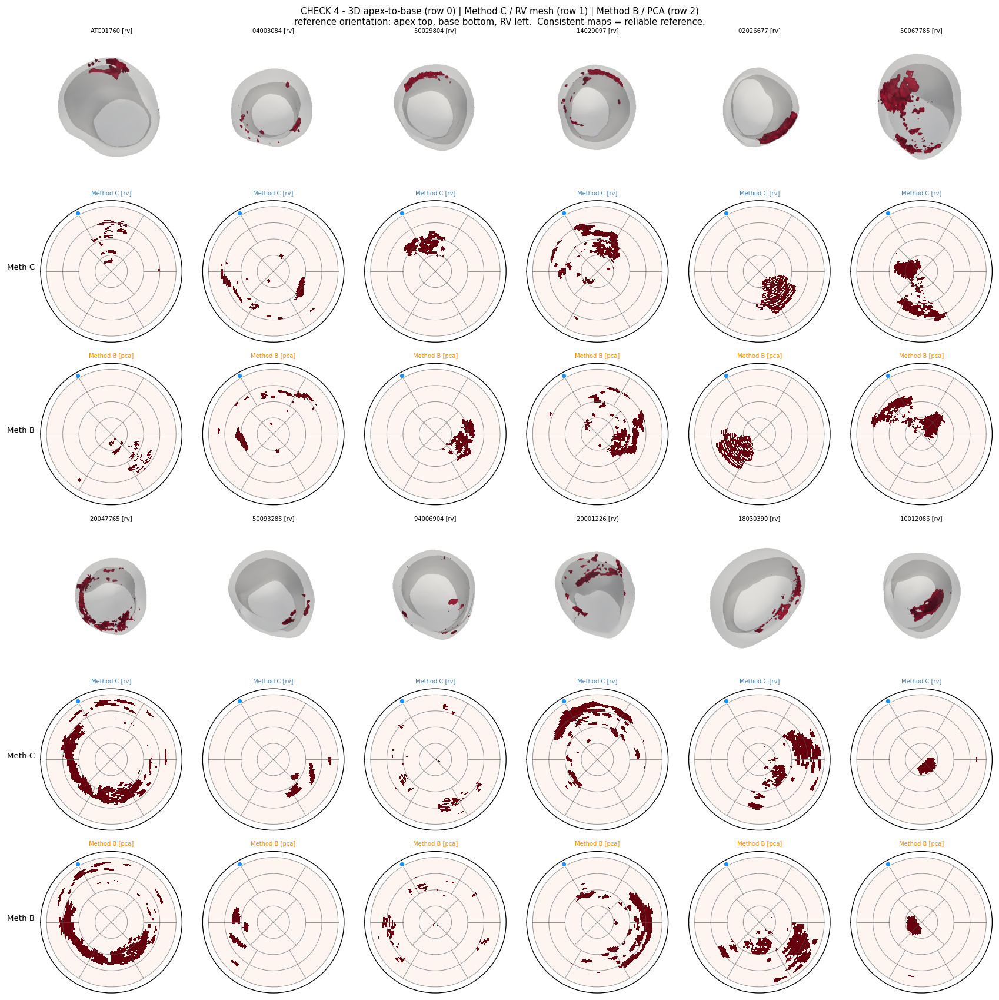

  Saved polar_map_qc_3d_vs_bullseye.png


In [30]:
# ----------------------------------------------------------
# CHECK 4 - 3D apex-to-base vs bull's-eye (per-method comparison)
#
# Method used for reference direction:
#   Method C - rv_reference_from_rv_mesh(): uses the actual RV centroid relative
#              to the LV centroid in the basal cross-section plane.
#              This is the GROUND TRUTH when the RV mesh is available.
#   Method B - rv_reference_pca(): PCA of the basal ring; the half with smaller
#              mean radius is assumed to be the septal side.
#              Used as fallback when no RV mesh.
#
# Layout per case (columns = cases):
#   Row 0 - 3D apex-to-base view (reference orientation)
#   Row 1 - bull's-eye using Method C (RV mesh)  - "N/A" if RV unavailable
#   Row 2 - bull's-eye using Method B (PCA)      - always shown
#
# A stable, consistent polar map across both methods = the reference direction
# is reliable and the two methods agree for this patient.
# Large differences between rows 1 and 2 = Method B is unreliable here.
# ----------------------------------------------------------
print("\n== CHECK 4: 3D + Method C / Method B bull's-eyes (per-method rows) ==")

c5_cases, c5_geoms = [], []
for case in known:
    if len(c5_cases) >= _QC_SUBSET:
        break
    try:
        g = _qc_prepare(case)
        if g is None or g['cz'] is None:
            continue
        c5_cases.append(case)
        c5_geoms.append(g)
    except Exception:
        pass

n5     = len(c5_cases)
ncols5 = min(n5, _QC_NCOLS)
nrows5 = 3 * int(np.ceil(n5 / ncols5))   # 3 rows per case block

fig = plt.figure(figsize=(ncols5 * 2.4, nrows5 * 2.4))
fig.suptitle(
    "CHECK 4 - 3D apex-to-base (row 0) | Method C / RV mesh (row 1) | Method B / PCA (row 2)\n"
    "reference orientation: apex top, base bottom, RV left.  Consistent maps = reliable reference.",
    fontsize=9,
)

for idx, (case, g) in enumerate(zip(c5_cases, c5_geoms)):
    col     = idx % ncols5
    row_3d  = 3 * (idx // ncols5)
    row_c   = row_3d + 1
    row_b   = row_3d + 2
    pid     = str(case.patient_id)

    # -- Row 0: 3D apex-to-base --
    img3d = None
    try:
        pl = pv.Plotter(off_screen=True, window_size=_QC_WIN)
        pl.set_background('white')
        pl.add_mesh(g['shell_t'], color='#bbbbbb', opacity=0.20,
                    smooth_shading=True, show_scalar_bar=False)
        if g['cz_t'] is not None:
            pl.add_mesh(g['cz_t'], color='crimson', opacity=0.95,
                        smooth_shading=True, show_scalar_bar=False)
        _qc_apex_camera(pl, g['shell_t'], g['span'])
        img3d = pl.screenshot(None, return_img=True)
        pl.close()
    except Exception as e:
        print(f'  C5 3D skip {pid}: {e}')

    ax3d = fig.add_subplot(nrows5, ncols5, row_3d * ncols5 + col + 1)
    ax3d.axis('off')
    if img3d is not None:
        ax3d.imshow(img3d)
    if col == 0:
        ax3d.set_ylabel('3D', fontsize=8, rotation=0, labelpad=20)
    ax3d.set_title(f'{pid} [{g["ref_method"]}]', fontsize=6)

    # -- Row 1: Method C bull's-eye --
    ax_c = fig.add_subplot(nrows5, ncols5, row_c * ncols5 + col + 1, projection='polar')
    ax_c.set_theta_zero_location('W')
    ax_c.set_theta_direction(-1)
    if g['rv_t'] is not None:
        try:
            # Force Method C with an RV-bound reference function.
            _shell = g['shell']; _rv = g['rv']; _cz = g['cz']
            _ref_fn_c = lambda mesh, ax, ap, rv_mesh=_rv: rv_reference_from_rv_mesh(mesh, rv_mesh, ax, ap)
            _geom  = prepare_polar_geometry(_shell, ref_fn=_ref_fn_c, rv_mesh=_rv)
            _theta_c, _s_c = project_points_to_polar(np.array(_cz.points), _geom)
            _theta_c = (2.0 * np.pi - _theta_c) % (2.0 * np.pi)
            pm_c = _polar_mask(_theta_c, _s_c)
            T5, R5 = np.meshgrid(
                np.linspace(0, 2 * np.pi, N_THETA + 1),
                np.linspace(0, 1.0,       N_R + 1),
            )
            ax_c.pcolormesh(T5, R5, pm_c.astype(float),
                            cmap='Reds', vmin=0, vmax=1, shading='flat')
            _draw_bullseye_grid(ax_c)
            ax_c.set_title('Method C [rv]', fontsize=6, color='steelblue')
        except Exception as e:
            ax_c.axis('off')
            ax_c.set_title(f'C err: {e}', fontsize=5, color='red')
    else:
        ax_c.axis('off')
        ax_c.set_title('N/A (no RV)', fontsize=6, color='gray')
    if col == 0:
        ax_c.set_ylabel('Meth C', fontsize=8, rotation=0, labelpad=20)

    # -- Row 2: Method B bull's-eye --
    ax_b = fig.add_subplot(nrows5, ncols5, row_b * ncols5 + col + 1, projection='polar')
    ax_b.set_theta_zero_location('W')
    ax_b.set_theta_direction(-1)
    try:
        _shell = g['shell']; _cz = g['cz']
        _geom = prepare_polar_geometry(_shell, ref_fn=rv_reference_pca, rv_mesh=None)
        _theta_b, _s_b = project_points_to_polar(np.array(_cz.points), _geom)
        _theta_b = (2.0 * np.pi - _theta_b) % (2.0 * np.pi)
        pm_b = _polar_mask(_theta_b, _s_b)
        T5, R5 = np.meshgrid(
            np.linspace(0, 2 * np.pi, N_THETA + 1),
            np.linspace(0, 1.0,       N_R + 1),
        )
        ax_b.pcolormesh(T5, R5, pm_b.astype(float),
                        cmap='Reds', vmin=0, vmax=1, shading='flat')
        _draw_bullseye_grid(ax_b)
        ax_b.set_title('Method B [pca]', fontsize=6, color='darkorange')
    except Exception as e:
        ax_b.axis('off')
        ax_b.set_title(f'B err: {e}', fontsize=5, color='red')
    if col == 0:
        ax_b.set_ylabel('Meth B', fontsize=8, rotation=0, labelpad=20)

plt.tight_layout()
plt.savefig(OUT / 'polar_map_qc_3d_vs_bullseye.png', bbox_inches='tight', dpi=110)
plt.show()
print('  Saved polar_map_qc_3d_vs_bullseye.png')


### 4.6 Complementary Scar Profiles

Ported from notebook 01's 4f block. These plots summarise the population `pmaps` stack from complementary angles: circumferential profile, longitudinal profile, hotspot thresholds, iso-density contours, and angular entropy.


Vertex count grids: 100%|██████████| 105/105 [00:20<00:00,  5.09it/s]


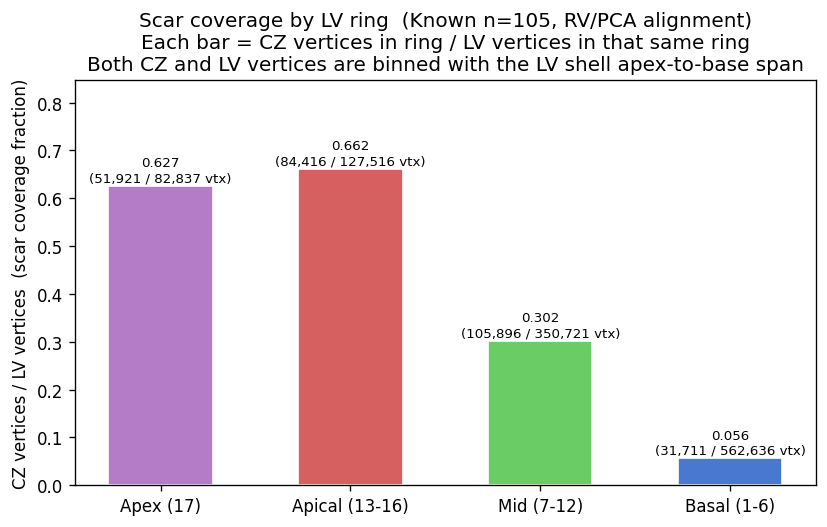

  Apex (17)         : 0.6268  (51,921 CZ vtx / 82,837 LV vtx)
  Apical (13-16)    : 0.6620  (84,416 CZ vtx / 127,516 LV vtx)
  Mid (7-12)        : 0.3019  (105,896 CZ vtx / 350,721 LV vtx)
  Basal (1-6)       : 0.0564  (31,711 CZ vtx / 562,636 LV vtx)


In [31]:
def polar_map_counts(case, n_r=N_R, n_theta=N_THETA):
    """
    Returns (cz_counts, lv_counts): two int grids of shape (n_r, n_theta).
    Each cell = number of vertices projected into that polar bin.
    Uses Method C (RV mesh) when available, else Method B (PCA).
    """
    shell = best_shell(case)
    cz    = get_cz_mesh(case)
    rv    = best_rv_mesh(case)
    if shell is None or cz is None:
        raise ValueError("missing shell or CZ")

    if rv is not None:
        ref_fn = lambda mesh, ax, ap: rv_reference_from_rv_mesh(mesh, rv, ax, ap)
        geom = prepare_polar_geometry(shell, ref_fn=ref_fn, rv_mesh=rv)
    else:
        geom = prepare_polar_geometry(shell, ref_fn=rv_reference_pca, rv_mesh=None)

    def _to_grid(pts):
        theta, s = project_points_to_polar(pts, geom)
        theta = (2.0 * np.pi - theta) % (2.0 * np.pi)   # same CW flip as pmaps
        ri = np.clip((s * n_r).astype(int),                        0, n_r - 1)
        ti = np.clip((theta / (2 * np.pi) * n_theta).astype(int),  0, n_theta - 1)
        grid = np.zeros((n_r, n_theta), dtype=np.int64)
        np.add.at(grid, (ri, ti), 1)
        return grid

    return _to_grid(np.array(cz.points)), _to_grid(np.array(shell.points))


pmaps = globals().get("pmaps", {})

if not pmaps:
    print("No polar maps.")
else:
    _total_cz = np.zeros((N_R, N_THETA), dtype=np.int64)
    _total_lv = np.zeros((N_R, N_THETA), dtype=np.int64)
    _skipped  = 0
    for _case in tqdm(known, desc="Vertex count grids"):
        try:
            _cz_c, _lv_c = polar_map_counts(_case)
            _total_cz += _cz_c
            _total_lv += _lv_c
        except Exception as _e:
            _skipped += 1
    if _skipped:
        print(f"Skipped {_skipped} cases.")

    _ZONES = {
        "Apex (17)":       slice(0,  16),
        "Apical (13-16)":  slice(16, 32),
        "Mid (7-12)":      slice(32, 48),
        "Basal (1-6)":     slice(48, 64),
    }
    _COLORS = ["#b47cc7", "#d65f5f", "#6acc65", "#4878cf"]

    _ring_names, _ring_vals, _ring_n_cz, _ring_n_lv = [], [], [], []
    for (_name, _sl), _col in zip(_ZONES.items(), _COLORS):
        _ring_cz_vertices = int(_total_cz[_sl, :].sum())
        _ring_lv_vertices = int(_total_lv[_sl, :].sum())
        _val = _ring_cz_vertices / max(_ring_lv_vertices, 1)
        _ring_names.append(_name)
        _ring_vals.append(_val)
        _ring_n_cz.append(_ring_cz_vertices)
        _ring_n_lv.append(_ring_lv_vertices)

    fig2, ax2 = plt.subplots(figsize=(7, 4.5))
    _bars = ax2.bar(_ring_names, _ring_vals, color=_COLORS, edgecolor="white", width=0.55)
    for bar, val, n_cz, n_lv in zip(_bars, _ring_vals, _ring_n_cz, _ring_n_lv):
        ax2.text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + 0.003,
                 f"{val:.3f}\n({n_cz:,} / {n_lv:,} vtx)",
                 ha="center", va="bottom", fontsize=8)
    ax2.set_ylabel("CZ vertices / LV vertices  (scar coverage fraction)")
    ax2.set_title(
        f"Scar coverage by LV ring  (Known n={len(pmaps)}, RV/PCA alignment)\n"
        "Each bar = CZ vertices in ring / LV vertices in that same ring\n"
        "Both CZ and LV vertices are binned with the LV shell apex-to-base span")
    ax2.set_ylim(0, max(_ring_vals) * 1.28)
    plt.tight_layout()
    plt.savefig(OUT / "aha_scar_density_rings.png", bbox_inches="tight")
    plt.show()

    for name, val, n_cz, n_lv in zip(_ring_names, _ring_vals, _ring_n_cz, _ring_n_lv):
        print(f"  {name:<18}: {val:.4f}  ({n_cz:,} CZ vtx / {n_lv:,} LV vtx)")

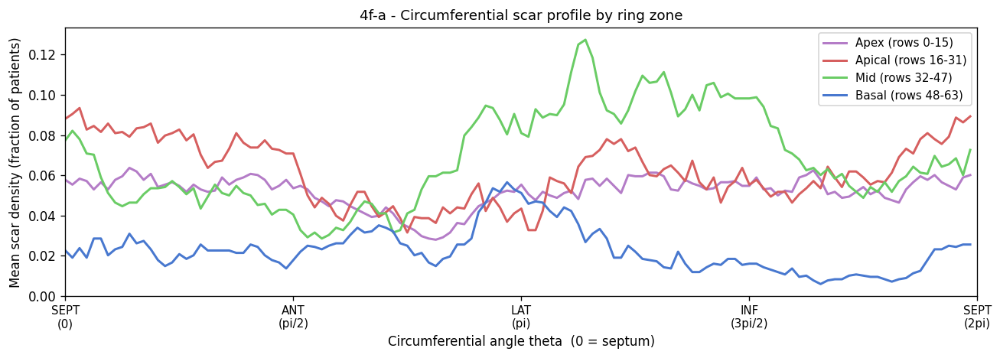

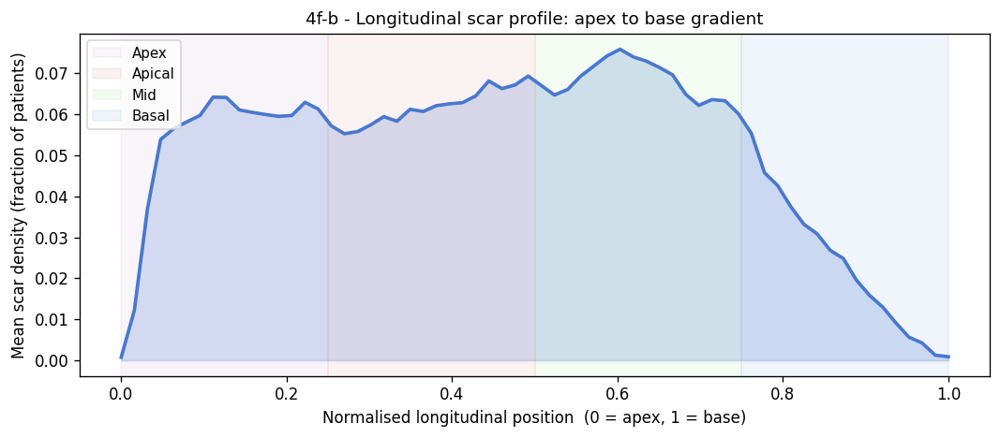

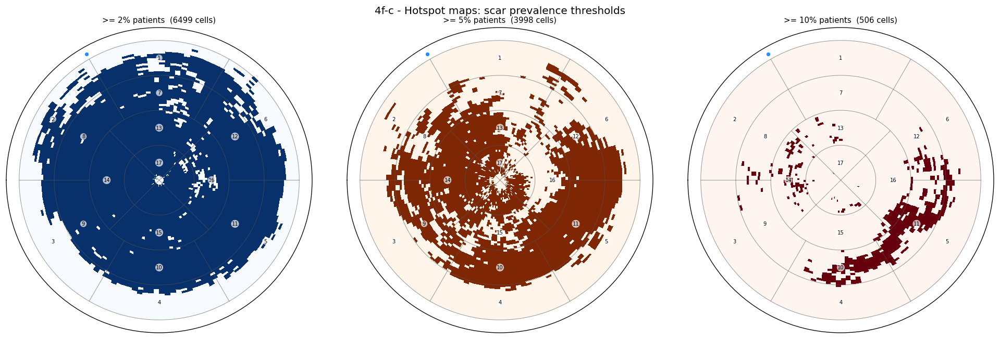

   2% threshold -> 79.3% of grid cells affected
   5% threshold -> 48.8% of grid cells affected
  10% threshold -> 6.2% of grid cells affected


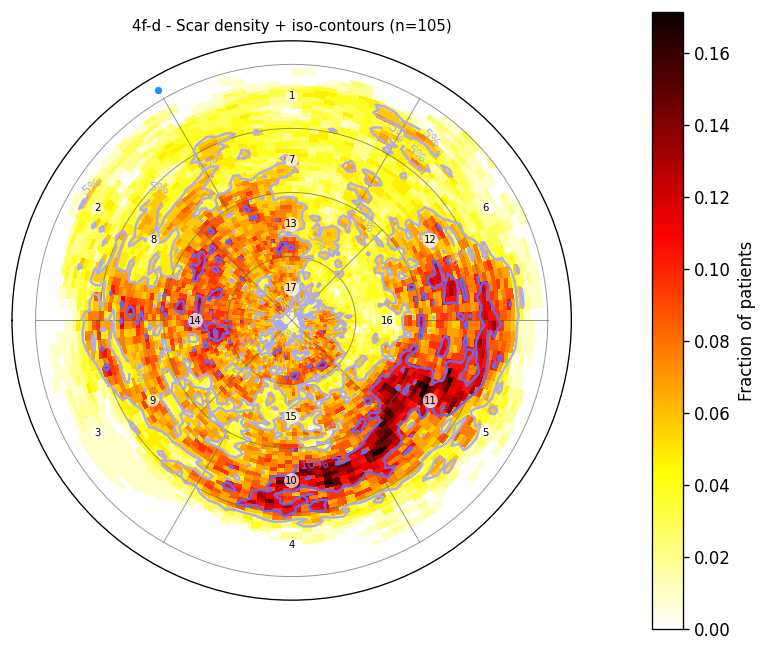

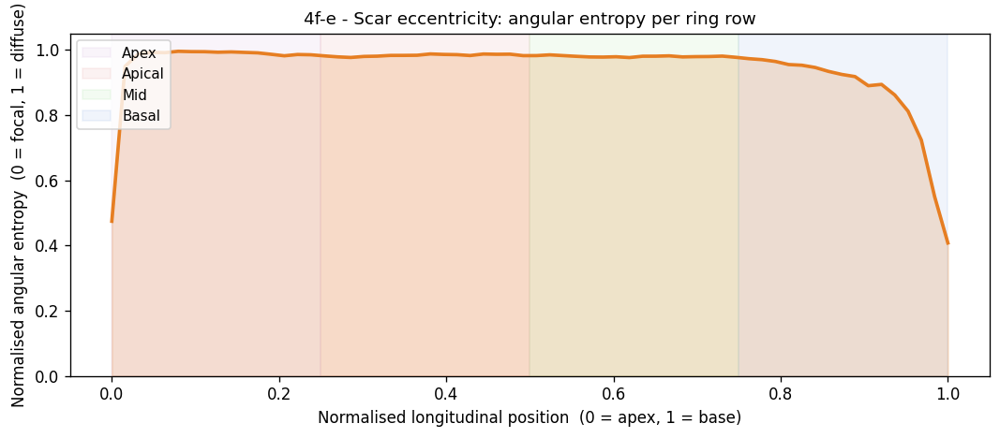

  Apex    : mean eccentricity = 0.956
  Apical  : mean eccentricity = 0.984
  Mid     : mean eccentricity = 0.980
  Basal   : mean eccentricity = 0.855


In [32]:
pmaps = globals().get('pmaps', {})

if not pmaps:
    print('No polar maps available. Run Section 3.2 first.')
else:
    _stack_4f = np.stack([np.asarray(v, dtype=float) for v in pmaps.values()])
    _density_4f = _stack_4f.mean(axis=0)
    _vmax_4f = max(float(np.nanmax(_density_4f)), 1e-12)

    _zones_4f = {
        'Apex (rows 0-15)':    slice(0,  16),
        'Apical (rows 16-31)': slice(16, 32),
        'Mid (rows 32-47)':    slice(32, 48),
        'Basal (rows 48-63)':  slice(48, 64),
    }
    _zone_cols_4f = ['#b47cc7', '#d65f5f', '#6acc65', '#4878cf']
    _zone_shade_4f = [
        (0.0,  0.25, '#b47cc7', 'Apex'),
        (0.25, 0.50, '#d65f5f', 'Apical'),
        (0.50, 0.75, '#6acc65', 'Mid'),
        (0.75, 1.00, '#4878cf', 'Basal'),
    ]

    def _draw_density_4f(arr, ax, title='', cmap='hot_r', vmax=None, label_segments=False):
        arr = np.asarray(arr, dtype=float)
        if vmax is None:
            vmax = max(float(np.nanmax(arr)), 1e-12)
        T, R = np.meshgrid(
            np.linspace(0, 2 * np.pi, arr.shape[1] + 1),
            np.linspace(0, 1.0,       arr.shape[0] + 1),
        )
        ax.set_theta_zero_location('W')
        ax.set_theta_direction(-1)
        mesh = ax.pcolormesh(T, R, arr, cmap=cmap, vmin=0, vmax=vmax, shading='flat')
        _draw_bullseye_grid(ax)
        if label_segments:
            _labels = (
                (1,90,0.875),(2,30,0.875),(3,330,0.875),(4,270,0.875),(5,210,0.875),(6,150,0.875),
                (7,90,0.625),(8,30,0.625),(9,330,0.625),(10,270,0.625),(11,210,0.625),(12,150,0.625),
                (13,90,0.375),(14,0,0.375),(15,270,0.375),(16,180,0.375),(17,90,0.125),
            )
            for seg, deg, r in _labels:
                ax.text(np.deg2rad(deg % 360), r, str(seg), fontsize=6,
                        ha='center', va='center', color='black',
                        bbox=dict(boxstyle='circle,pad=0.12', facecolor='white',
                                  edgecolor='none', alpha=0.7))
        if title:
            ax.set_title(title, fontsize=9, pad=6)
        return mesh

    # 4f-a: Circumferential scar profile by ring zone.
    _theta_bins = np.linspace(0, 2 * np.pi, N_THETA, endpoint=False)
    fig, ax = plt.subplots(figsize=(11, 4))
    for (_name, _sl), _col in zip(_zones_4f.items(), _zone_cols_4f):
        _profile = _density_4f[_sl, :].mean(axis=0)
        ax.plot(_theta_bins, _profile, label=_name, color=_col, linewidth=1.8)
    ax.set_xticks([0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi])
    ax.set_xticklabels(['SEPT\n(0)', 'ANT\n(pi/2)', 'LAT\n(pi)', 'INF\n(3pi/2)', 'SEPT\n(2pi)'], fontsize=9)
    ax.set_xlim(0, 2 * np.pi)
    ax.set_xlabel('Circumferential angle theta  (0 = septum)', fontsize=10)
    ax.set_ylabel('Mean scar density (fraction of patients)', fontsize=10)
    ax.set_title('4f-a - Circumferential scar profile by ring zone', fontsize=11)
    ax.legend(fontsize=9, loc='upper right')
    plt.tight_layout()
    plt.savefig(OUT / 'polar_circumferential_profile.png', bbox_inches='tight', dpi=130)
    plt.show()

    # 4f-b: Longitudinal scar profile.
    _long_profile = _density_4f.mean(axis=1)
    _s_vals = np.linspace(0, 1, N_R)
    fig, ax = plt.subplots(figsize=(9, 4))
    ax.plot(_s_vals, _long_profile, color='#4878cf', linewidth=2.2)
    ax.fill_between(_s_vals, _long_profile, alpha=0.22, color='#4878cf')
    for _x0, _x1, _col, _lbl in _zone_shade_4f:
        ax.axvspan(_x0, _x1, alpha=0.08, color=_col, label=_lbl)
    ax.set_xlabel('Normalised longitudinal position  (0 = apex, 1 = base)', fontsize=10)
    ax.set_ylabel('Mean scar density (fraction of patients)', fontsize=10)
    ax.set_title('4f-b - Longitudinal scar profile: apex to base gradient', fontsize=11)
    ax.legend(fontsize=9, loc='upper left')
    plt.tight_layout()
    plt.savefig(OUT / 'polar_longitudinal_profile.png', bbox_inches='tight', dpi=130)
    plt.show()

    # 4f-c: Hotspot maps at prevalence thresholds.
    _thresholds_4f = [0.02, 0.05, 0.1]
    _threshold_cmaps_4f = ['Blues', 'Oranges', 'Reds']
    fig, axes = plt.subplots(1, 3, figsize=(16.5, 5.5), subplot_kw={'projection': 'polar'})
    fig.suptitle('4f-c - Hotspot maps: scar prevalence thresholds', fontsize=12)
    for ax, _thresh, _cmap in zip(axes, _thresholds_4f, _threshold_cmaps_4f):
        _mask = (_density_4f >= _thresh).astype(float)
        _n_cells = int(_mask.sum())
        _draw_density_4f(_mask, ax, cmap=_cmap, vmax=1.0, label_segments=True,
                         title=f'>= {int(_thresh*100)}% patients  ({_n_cells} cells)')
    plt.tight_layout()
    plt.savefig(OUT / 'polar_hotspot_maps.png', bbox_inches='tight', dpi=130)
    plt.show()
    for _thresh in _thresholds_4f:
        _frac = float((_density_4f >= _thresh).mean() * 100)
        print(f'  {int(_thresh*100):2d}% threshold -> {_frac:.1f}% of grid cells affected')

    # 4f-d: Density with iso-density contours.
    fig, ax = plt.subplots(figsize=(6.5, 6.5), subplot_kw={'projection': 'polar'})
    _mesh = _draw_density_4f(_density_4f, ax,
                             title=f'4f-d - Scar density + iso-contours (n={len(pmaps)})',
                             cmap='hot_r', vmax=_vmax_4f, label_segments=True)
    _T_grid = np.linspace(0, 2 * np.pi, N_THETA)
    _R_grid = np.linspace(0, 1, N_R)
    _TT, _RR = np.meshgrid(_T_grid, _R_grid)
    _contour_levels = [lvl for lvl in [0.05, 0.10, 0.20] if lvl < _vmax_4f]
    if _contour_levels:
        _cs = ax.contour(_TT, _RR, _density_4f, levels=_contour_levels,
                         colors=['#aaaaff', '#6666ff', '#0000cc'][:len(_contour_levels)],
                         linewidths=1.4)
        try:
            ax.clabel(_cs, fmt={lvl: f'{int(lvl*100)}%' for lvl in _contour_levels}, fontsize=8, inline=True)
        except Exception as _exc:
            print(f'  contour labels skipped: {_exc}')
    plt.colorbar(_mesh, ax=ax, pad=0.12, fraction=0.046, label='Fraction of patients')
    plt.tight_layout()
    plt.savefig(OUT / 'polar_density_contours.png', bbox_inches='tight', dpi=130)
    plt.show()

    # 4f-e: Scar eccentricity via angular entropy per ring row.
    _entropy_per_row = np.full(N_R, np.nan)
    for _ri in range(N_R):
        _p = _density_4f[_ri, :]
        _tot = _p.sum()
        if _tot > 1e-9:
            _pn = _p / _tot
            _entropy_per_row[_ri] = -np.sum(_pn * np.log(_pn + 1e-12)) / np.log(N_THETA)

    fig, ax = plt.subplots(figsize=(9, 4))
    _valid = np.isfinite(_entropy_per_row)
    ax.plot(_s_vals[_valid], _entropy_per_row[_valid], color='#e67e22', linewidth=2.2)
    ax.fill_between(_s_vals[_valid], _entropy_per_row[_valid], alpha=0.2, color='#e67e22')
    for _x0, _x1, _col, _lbl in _zone_shade_4f:
        ax.axvspan(_x0, _x1, alpha=0.08, color=_col, label=_lbl)
    ax.set_xlabel('Normalised longitudinal position  (0 = apex, 1 = base)', fontsize=10)
    ax.set_ylabel('Normalised angular entropy  (0 = focal, 1 = diffuse)', fontsize=10)
    ax.set_title('4f-e - Scar eccentricity: angular entropy per ring row', fontsize=11)
    ax.set_ylim(0, 1.05)
    ax.legend(fontsize=9, loc='upper left')
    plt.tight_layout()
    plt.savefig(OUT / 'polar_eccentricity.png', bbox_inches='tight', dpi=130)
    plt.show()
    for _x0, _x1, _, _lbl in _zone_shade_4f:
        _ri0, _ri1 = int(_x0 * N_R), int(_x1 * N_R)
        _ze = np.nanmean(_entropy_per_row[_ri0:_ri1])
        print(f'  {_lbl:<8}: mean eccentricity = {_ze:.3f}')


## Section 5 - Vertex, Area, and Surface-Normalized Comparison

Three complementary ways to project scar onto the polar grid:

| Method | What it measures | Sensitivity |
|---|---|---|
| **Vertex** | Binary CZ vertex presence per bin | Mesh sampling density |
| **Area** | Raw CZ cell surface area per bin (mm^2) | Absolute scar burden, biased toward large bins |
| **Coverage** | CZ area / LV shell area per bin (ratio) | Normalised: removes bin-size and LV-size bias |

All three share the same coordinate system (Reference orientation: theta=0 at septal/RV reference,
`set_theta_zero_location('W')`, clockwise = anatomical apical view).

**Interpretation guide:**
- Vertex and area maps should agree on *location* but area may show higher signal in
  basal bins (larger physical area = more scar vertices and more cell area).
- Coverage map corrects for available LV surface area -> better for cross-patient comparison.
- Large vertex-coverage divergence = mesh sampling artefact or LV size variability.


### 5.1 Area and Coverage Helper Functions


In [33]:
# ----------------------------------------------------------
# Section 5 helpers - vertex / area / surface superposition
#
# Three complementary polar projections:
#
#   vertex  - binary CZ vertex presence per bin; mean across
#             patients = fraction with scar in each bin
#   area    - CZ triangle area (cross-product formula, mm^2)
#             per bin; mean across patients
#   coverage - CZ area / LV area per bin; mean across patients
#              = mean surface coverage (removes bin-size and LV-size bias)
#
# 'Superposition' = stack all patients maps and take (nan)mean,
# matching the logic in polar_maps_superposition.png (Sec. 3.3).
#
# Triangle area formula: ||(B-A) x (C-A)|| / 2 per face.
# ----------------------------------------------------------

_EPS_S5 = 1e-12


def _triangle_areas_and_centers(mesh):
    """Return (centers, areas) for every triangular face of mesh."""
    surf = mesh.extract_surface().clean()
    if surf.n_cells == 0:
        raise ValueError('mesh has no surface cells')
    pts   = np.asarray(surf.points, dtype=float)
    faces = np.asarray(surf.faces)   # PyVista flat format
    centers_list, areas_list = [], []
    i = 0
    while i < len(faces):
        n   = int(faces[i])
        idx = faces[i + 1 : i + 1 + n]
        i  += 1 + n
        tris = [(0, 1, 2)] if n == 3 else [(0, 1, 2), (0, 2, 3)]
        for a, b, c in tris:
            A, B, C = pts[idx[a]], pts[idx[b]], pts[idx[c]]
            area = 0.5 * np.linalg.norm(np.cross(B - A, C - A))
            if area > 0:
                centers_list.append((A + B + C) / 3.0)
                areas_list.append(area)
    if not centers_list:
        raise ValueError('no valid triangles in mesh')
    return np.array(centers_list), np.array(areas_list)


def _accumulate_triangle_areas(mesh, geom, n_r=N_R, n_theta=N_THETA):
    """Sum triangle areas (mm^2) into polar grid (n_r x n_theta)."""
    centers, areas = _triangle_areas_and_centers(mesh)
    theta, s = project_points_to_polar(centers, geom)
    theta = (2.0 * np.pi - theta) % (2.0 * np.pi)  # CW anatomical
    ri = np.clip((s * n_r).astype(int),                    0, n_r - 1)
    ti = np.clip((theta / (2*np.pi) * n_theta).astype(int), 0, n_theta - 1)
    grid = np.zeros((n_r, n_theta), dtype=float)
    np.add.at(grid, (ri, ti), areas)
    grid = grid[:, ::-1]  # match polar_mask x-flip
    return grid


def polar_maps_all_methods(case, n_r=N_R, n_theta=N_THETA):
    """Compute vertex, area, and coverage polar maps for one case."""
    shell = best_shell(case)
    cz    = get_cz_mesh(case)
    rv    = best_rv_mesh(case)
    if shell is None:
        raise ValueError('no LV shell')
    if cz is None:
        raise ValueError('no CZ mesh')

    if rv is not None:
        ref_fn = lambda m, ax, ap, _rv=rv: rv_reference_from_rv_mesh(m, _rv, ax, ap)
        geom   = prepare_polar_geometry(shell, ref_fn=ref_fn, rv_mesh=rv)
        ref_method = 'rv'
    else:
        geom   = prepare_polar_geometry(shell, rv_mesh=None)
        ref_method = 'pca'

    # Vertex map: binary CZ vertex presence per bin
    _cz_pts = np.asarray(cz.points)
    _t, _s  = project_points_to_polar(_cz_pts, geom)
    _t_cw   = (2.0 * np.pi - _t) % (2.0 * np.pi)
    vertex  = _polar_mask(_t_cw, _s, n_r, n_theta).astype(float)

    # Area map using triangle cross-product formula
    cz_area = _accumulate_triangle_areas(cz,    geom, n_r, n_theta)
    lv_area = _accumulate_triangle_areas(shell, geom, n_r, n_theta)
    cz_total = float(cz_area.sum())
    # Coverage: CZ area / LV area per bin (removes bin-size and LV-size bias)
    coverage = np.divide(
        cz_area, lv_area,
        out=np.zeros_like(cz_area),
        where=lv_area > _EPS_S5,
    )
    return dict(
        vertex=vertex,
        cz_area=cz_area,
        coverage=coverage,
        ref_method=ref_method,
        cz_total=cz_total,
        lv_area=lv_area,
        lv_total=float(lv_area.sum()),
    )




_AHA_SEG_LABELS = (
    (1, 90, 0.875), (2, 30, 0.875), (3, 330, 0.875),
    (4, 270, 0.875), (5, 210, 0.875), (6, 150, 0.875),
    (7, 90, 0.625), (8, 30, 0.625), (9, 330, 0.625),
    (10, 270, 0.625), (11, 210, 0.625), (12, 150, 0.625),
    (13, 90, 0.375), (14, 0, 0.375), (15, 270, 0.375),
    (16, 180, 0.375), (17, 90, 0.125),
)


def draw_bullseye_cmp(data, ax, title=None, cmap='hot_r', vmax=None, label_segs=False):
    """Render data (n_r x n_theta) as AHA bull's-eye on a polar axis."""
    arr = np.asarray(data, dtype=float)
    if vmax is None:
        vmax = max(float(np.nanmax(arr)), 1e-12)
    T, R = np.meshgrid(
        np.linspace(0, 2 * np.pi, arr.shape[1] + 1),
        np.linspace(0, 1.0,       arr.shape[0] + 1),
    )
    ax.set_theta_zero_location('W')
    ax.set_theta_direction(-1)
    mesh = ax.pcolormesh(T, R, arr, cmap=cmap, vmin=0, vmax=vmax, shading='flat')
    _draw_bullseye_grid(ax)
    if label_segs:
        for seg, deg, r in _AHA_SEG_LABELS:
            ax.text(np.deg2rad(deg % 360), r, str(seg), fontsize=6,
                    ha='center', va='center', color='black',
                    bbox=dict(boxstyle='circle,pad=0.12', facecolor='white',
                              edgecolor='none', alpha=0.7))
    if title:
        ax.set_title(title, fontsize=9, pad=6)
    return mesh

print('Section 5 helpers ready (triangle cross-product formula).')


Section 5 helpers ready (triangle cross-product formula).


### 5.2 Compute Area and Coverage Polar Maps


In [34]:
# Compute vertex / area / surface polar maps for all cohort cases.

s5_results  = {}
s5_failures = []

for _case in tqdm(known, desc='Section 5 polar maps'):
    _key = f'{_case.year}/{_case.patient_id}'
    try:
        s5_results[_key] = polar_maps_all_methods(_case)
    except Exception as _exc:
        s5_failures.append({'key': _key, 'error': repr(_exc)})

print(f'OK       : {len(s5_results)}')
print(f'Failures : {len(s5_failures)}')
for r in s5_failures[:5]:
    print(f'  {r["key"]}: {r["error"]}')
print('Reference methods:', {v['ref_method'] for v in s5_results.values()})


Section 5 polar maps: 100%|██████████| 105/105 [04:29<00:00,  2.56s/it]

OK       : 105
Failures : 0
Reference methods: {'rv'}


### 5.3 Population-Level Projection Comparison


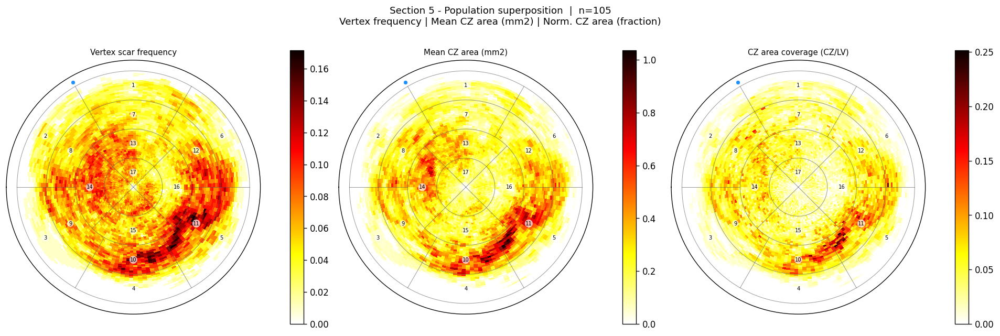

  Saved s5_population_superposition.png


In [35]:
# Population-level superposition: vertex / CZ area / norm. CZ area.

_s5_keys = list(s5_results.keys())
if not _s5_keys:
    print('No results. Run Section 5.2 first.')
else:
    _vert_stack = np.stack([s5_results[k]['vertex']  for k in _s5_keys])
    _area_stack = np.stack([s5_results[k]['cz_area'] for k in _s5_keys])
    _norm_stack = np.stack([s5_results[k]['coverage'] for k in _s5_keys])

    _vert_freq = _vert_stack.mean(axis=0)
    _mean_area = _area_stack.mean(axis=0)
    _mean_norm = _norm_stack.mean(axis=0)

    fig_s5p, axes_s5p = plt.subplots(
        1, 3, figsize=(16, 5.5), subplot_kw={'projection': 'polar'})
    fig_s5p.suptitle(
        f'Section 5 - Population superposition  |  n={len(_s5_keys)}\n'
        'Vertex frequency | Mean CZ area (mm2) | Norm. CZ area (fraction)',
        fontsize=11,
    )
    m1 = draw_bullseye_cmp(_vert_freq, axes_s5p[0],
                           'Vertex scar frequency',   cmap='hot_r', label_segs=True)
    m2 = draw_bullseye_cmp(_mean_area, axes_s5p[1],
                           'Mean CZ area (mm2)',      cmap='hot_r', label_segs=True)
    m3 = draw_bullseye_cmp(_mean_norm, axes_s5p[2],
                           'CZ area coverage (CZ/LV)', cmap='hot_r', label_segs=True)
    for _m, _ax in zip([m1, m2, m3], axes_s5p):
        plt.colorbar(_m, ax=_ax, fraction=0.046, pad=0.10)

    plt.tight_layout()
    plt.savefig(OUT / 's5_population_superposition.png', bbox_inches='tight', dpi=150)
    plt.show()
    print('  Saved s5_population_superposition.png')


### 5.4 Per-Patient Projection Comparison


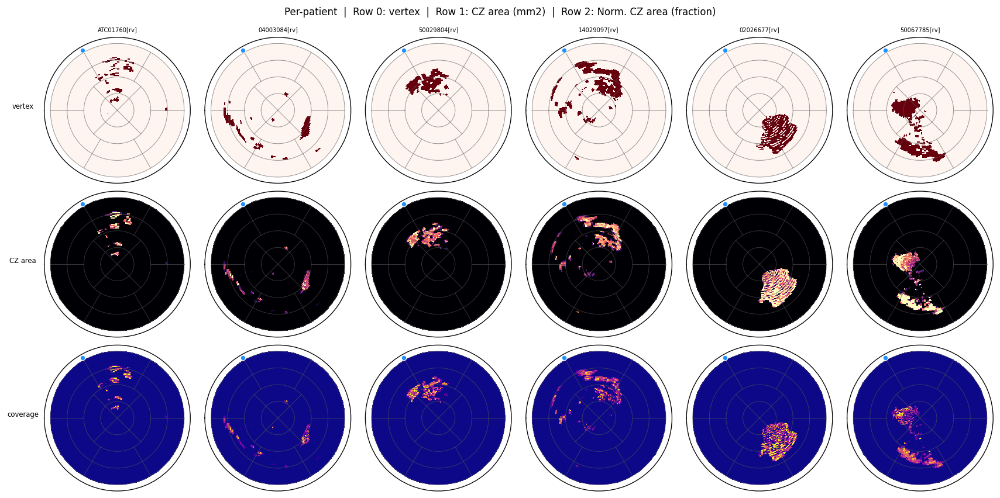

  Saved s5_per_patient_grid.png


In [36]:
# Per-patient: vertex / CZ area / norm. CZ area (3 rows, 6 cases).

if not s5_results:
    print('No results. Run Section 5.2 first.')
else:
    _S5_N   = 6
    _s5_sub = list(s5_results.keys())[:_S5_N]
    _nc5    = len(_s5_sub)
    _nr5    = 3

    _vmax_area = float(np.nanpercentile(
        np.concatenate([s5_results[k]['cz_area'].ravel() for k in _s5_sub]), 99))
    _nz57 = np.concatenate([s5_results[k]['coverage'].ravel() for k in _s5_sub])
    _nz57 = _nz57[_nz57 > 0]
    _vmax_norm = float(np.percentile(_nz57, 95)) if len(_nz57) else 1e-6

    fig_s5pp, axes_s5pp = plt.subplots(
        _nr5, _nc5, figsize=(_nc5 * 2.4, _nr5 * 2.4),
        subplot_kw={'projection': 'polar'})
    fig_s5pp.suptitle(
        'Per-patient  |  Row 0: vertex  |  Row 1: CZ area (mm2)  |  Row 2: Norm. CZ area (fraction)',
        fontsize=10)

    for col, key in enumerate(_s5_sub):
        pid = key.split('/')[1]
        ref = s5_results[key]['ref_method']
        ax_v = axes_s5pp[0, col]
        ax_a = axes_s5pp[1, col]
        ax_n = axes_s5pp[2, col]
        draw_bullseye_cmp(s5_results[key]['vertex'],  ax_v, cmap='Reds',    vmax=1.0)
        draw_bullseye_cmp(s5_results[key]['cz_area'], ax_a, cmap='magma',   vmax=_vmax_area)
        draw_bullseye_cmp(s5_results[key]['coverage'], ax_n, cmap='plasma',  vmax=_vmax_norm)
        ax_v.set_title(f'{pid}[{ref}]', fontsize=6)
        if col == 0:
            ax_v.set_ylabel('vertex',    fontsize=7, rotation=0, labelpad=22)
            ax_a.set_ylabel('CZ area',   fontsize=7, rotation=0, labelpad=22)
            ax_n.set_ylabel('coverage', fontsize=7, rotation=0, labelpad=22)

    plt.tight_layout()
    plt.savefig(OUT / 's5_per_patient_grid.png', bbox_inches='tight', dpi=130)
    plt.show()
    print('  Saved s5_per_patient_grid.png')


### 5.5 AHA-17 Segment Summary


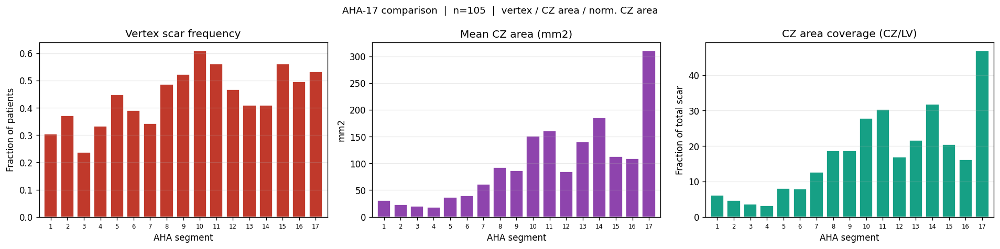

  Saved s5_aha_segments.png


In [37]:
# AHA-17 segment summary: vertex / CZ area / norm. CZ area.

if not s5_results:
    print('No results. Run Section 5.2 first.')
else:
    def _aha_grid_s5(n_r=N_R, n_theta=N_THETA):
        lbl = np.zeros((n_r, n_theta), dtype=np.int64)
        rc  = (np.arange(n_r) + 0.5) / n_r
        tc  = (np.arange(n_theta) + 0.5) / n_theta * 360.0
        for ri, radius in enumerate(rc):
            for ti, theta_deg in enumerate(tc):
                t = theta_deg
                if radius < 0.25:
                    lbl[ri, ti] = 17
                elif radius < 0.50:
                    lbl[ri, ti] = (13 if 45<=t<135  else 16 if 135<=t<225
                                   else 15 if 225<=t<315 else 14)
                elif radius < 0.75:
                    lbl[ri, ti] = (8  if 0<=t<60   else 7  if 60<=t<120
                                   else 12 if 120<=t<180 else 11 if 180<=t<240
                                   else 10 if 240<=t<300 else 9)
                else:
                    lbl[ri, ti] = (2  if 0<=t<60   else 1  if 60<=t<120
                                   else 6 if 120<=t<180 else 5 if 180<=t<240
                                   else 4 if 240<=t<300 else 3)
        return lbl

    _AHA5 = _aha_grid_s5()
    _segs = list(range(1, 18))
    _vert_seg, _area_seg, _norm_seg = [], [], []

    for _seg in _segs:
        mask = (_AHA5 == _seg)
        _vert_seg.append(np.mean([s5_results[k]['vertex'][mask].any()
                                  for k in _s5_keys]))
        _area_seg.append(np.mean([s5_results[k]['cz_area'][mask].sum()
                                  for k in _s5_keys]))
        _norm_seg.append(np.mean([s5_results[k]['coverage'][mask].sum()
                                  for k in _s5_keys]))

    x = np.arange(1, 18)
    fig_s5a, axes_s5a = plt.subplots(1, 3, figsize=(16, 4))
    fig_s5a.suptitle(
        f'AHA-17 comparison  |  n={len(_s5_keys)}  |  vertex / CZ area / norm. CZ area',
        fontsize=11)
    axes_s5a[0].bar(x, _vert_seg, color='#c0392b', edgecolor='white')
    axes_s5a[0].set_title('Vertex scar frequency')
    axes_s5a[0].set_ylabel('Fraction of patients')
    axes_s5a[1].bar(x, _area_seg, color='#8e44ad', edgecolor='white')
    axes_s5a[1].set_title('Mean CZ area (mm2)')
    axes_s5a[1].set_ylabel('mm2')
    axes_s5a[2].bar(x, _norm_seg, color='#16a085', edgecolor='white')
    axes_s5a[2].set_title('CZ area coverage (CZ/LV)')
    axes_s5a[2].set_ylabel('Fraction of total scar')
    for _ax in axes_s5a:
        _ax.set_xlabel('AHA segment')
        _ax.set_xticks(x)
        _ax.set_xticklabels(x, fontsize=7)
        _ax.grid(axis='y', alpha=0.25)
        _ax.set_xlim(0.3, 17.7)

    plt.tight_layout()
    plt.savefig(OUT / 's5_aha_segments.png', bbox_inches='tight', dpi=150)
    plt.show()
    print('  Saved s5_aha_segments.png')


### 5.6 CZ Area by LV Ring

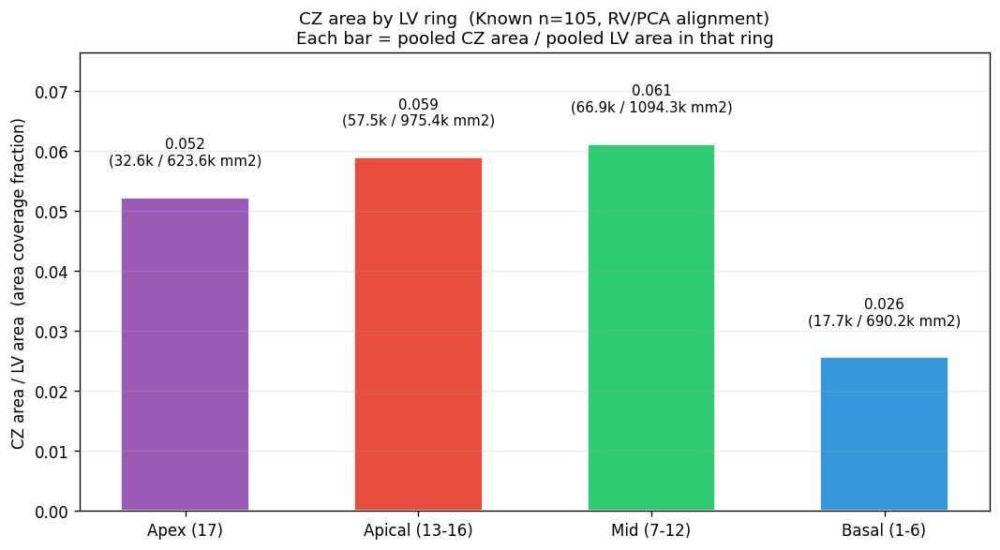

  Saved s5_ring_area_coverage.png


In [38]:
# Ring-level CZ area vs LV area (analogous to vertex ring coverage plot).
#
# 4 rings: Apex (17), Apical (13-16), Mid (7-12), Basal (1-6)
# Metric: pooled CZ area / pooled LV area per ring across all patients.

if not s5_results:
    print('No results. Run Section 5.2 first.')
else:
    _RINGS = [
        ('Apex (17)',       lambda r: r < 0.25,                      '#9b59b6'),
        ('Apical (13-16)', lambda r: (r >= 0.25) & (r < 0.50),      '#e74c3c'),
        ('Mid (7-12)',      lambda r: (r >= 0.50) & (r < 0.75),      '#2ecc71'),
        ('Basal (1-6)',    lambda r: r >= 0.75,                      '#3498db'),
    ]
    _rc = (np.arange(N_R) + 0.5) / N_R

    _ring_cz, _ring_lv = [], []
    for _label, _fn, _col in _RINGS:
        _mask_r = _fn(_rc)
        _mask2d = np.broadcast_to(_mask_r[:, None], (N_R, N_THETA))
        _cz_pool = sum(s5_results[k]['cz_area'][_mask2d].sum() for k in _s5_keys)
        _lv_pool = sum(s5_results[k]['lv_area'][_mask2d].sum() for k in _s5_keys)
        _ring_cz.append(_cz_pool)
        _ring_lv.append(_lv_pool)

    _ratios = [cz / lv if lv > _EPS_S5 else 0.0
               for cz, lv in zip(_ring_cz, _ring_lv)]

    fig_r, ax_r = plt.subplots(figsize=(9, 5))
    ax_r.set_title(
        f'CZ area by LV ring  (Known n={len(_s5_keys)}, RV/PCA alignment)\n'
        'Each bar = pooled CZ area / pooled LV area in that ring',
        fontsize=11)
    _xlabels = [r[0] for r in _RINGS]
    _colors  = [r[2] for r in _RINGS]
    bars = ax_r.bar(_xlabels, _ratios, color=_colors, edgecolor='white', width=0.55)
    for bar, ratio, cz, lv in zip(bars, _ratios, _ring_cz, _ring_lv):
        ax_r.text(bar.get_x() + bar.get_width() / 2,
                  bar.get_height() + 0.005,
                  f'{ratio:.3f}\n({cz/1e3:.1f}k / {lv/1e3:.1f}k mm2)',
                  ha='center', va='bottom', fontsize=9)
    ax_r.set_ylabel('CZ area / LV area  (area coverage fraction)', fontsize=10)
    ax_r.set_ylim(0, max(_ratios) * 1.25)
    ax_r.grid(axis='y', alpha=0.25)
    plt.tight_layout()
    plt.savefig(OUT / 's5_ring_area_coverage.png', bbox_inches='tight', dpi=150)
    plt.show()
    print('  Saved s5_ring_area_coverage.png')


### 5.7 CZ Area by LV Ring — Sex Split

M=38  F=10  no-sex=57


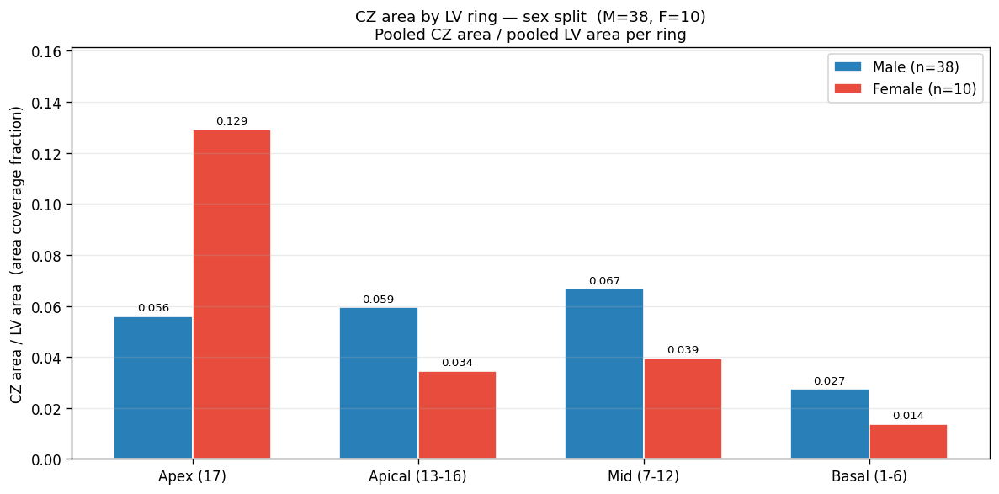

  Saved s5_ring_area_sex_split.png


In [39]:
# Ring coverage split by sex (M / F).

if not s5_results:
    print('No results. Run Section 5.2 first.')
elif not sex_map:
    print('No sex_map. Check clinical CSV in cell 4.')
else:
    _keys_m = [k for k in _s5_keys if sex_map.get(k.split('/')[1]) == 'M']
    _keys_f = [k for k in _s5_keys if sex_map.get(k.split('/')[1]) == 'F']
    print(f'M={len(_keys_m)}  F={len(_keys_f)}  '
          f'no-sex={len(_s5_keys) - len(_keys_m) - len(_keys_f)}')

    def _ring_ratios(keys):
        ratios = []
        for _label, _fn, _ in _RINGS:
            _mask_r = _fn(_rc)
            _mask2d = np.broadcast_to(_mask_r[:, None], (N_R, N_THETA))
            _cz = sum(s5_results[k]['cz_area'][_mask2d].sum() for k in keys) if keys else 0.0
            _lv = sum(s5_results[k]['lv_area'][_mask2d].sum() for k in keys) if keys else 0.0
            ratios.append(_cz / _lv if _lv > _EPS_S5 else 0.0)
        return ratios

    _rat_m = _ring_ratios(_keys_m)
    _rat_f = _ring_ratios(_keys_f)

    _xlabels = [r[0] for r in _RINGS]
    _x = np.arange(len(_RINGS))
    _w = 0.35

    fig_sx, ax_sx = plt.subplots(figsize=(10, 5))
    ax_sx.set_title(
        f'CZ area by LV ring — sex split  (M={len(_keys_m)}, F={len(_keys_f)})\n'
        'Pooled CZ area / pooled LV area per ring',
        fontsize=11)
    bars_m = ax_sx.bar(_x - _w/2, _rat_m, _w,
                        label=f'Male (n={len(_keys_m)})',
                        color='#2980b9', edgecolor='white')
    bars_f = ax_sx.bar(_x + _w/2, _rat_f, _w,
                        label=f'Female (n={len(_keys_f)})',
                        color='#e74c3c', edgecolor='white')
    _ymax = max(max(_rat_m, default=0), max(_rat_f, default=0))
    for bar, ratio in zip(list(bars_m) + list(bars_f), _rat_m + _rat_f):
        ax_sx.text(bar.get_x() + bar.get_width() / 2,
                   bar.get_height() + _ymax * 0.01,
                   f'{ratio:.3f}', ha='center', va='bottom', fontsize=8)
    ax_sx.set_xticks(_x)
    ax_sx.set_xticklabels(_xlabels, fontsize=10)
    ax_sx.set_ylabel('CZ area / LV area  (area coverage fraction)', fontsize=10)
    ax_sx.set_ylim(0, _ymax * 1.25)
    ax_sx.legend(fontsize=10)
    ax_sx.grid(axis='y', alpha=0.25)
    plt.tight_layout()
    plt.savefig(OUT / 's5_ring_area_sex_split.png', bbox_inches='tight', dpi=150)
    plt.show()
    print('  Saved s5_ring_area_sex_split.png')


## D7 - Polar Grid Resolution Sensitivity

Compares two alternative polar grid resolutions against the operational 64×128.

| Config | N_R | N_THETA | Bins | Avg vertices/bin (LV ~50k pts) |
|---|---|---|---|---|
| Coarse | 32 | 64 | 2 048 | ~24 |
| **Original** | **64** | **128** | **8 192** | **~6** |
| Fine | 128 | 256 | 32 768 | ~1.5 |

Top figure: same 3 patients at coarse (32×64) and fine (128×256).
Middle figure: original 64×128 for the same 3 patients.
Bottom figure: population mean at all three resolutions.

Operational grid (64×128) is unchanged. This cell is analysis-only.

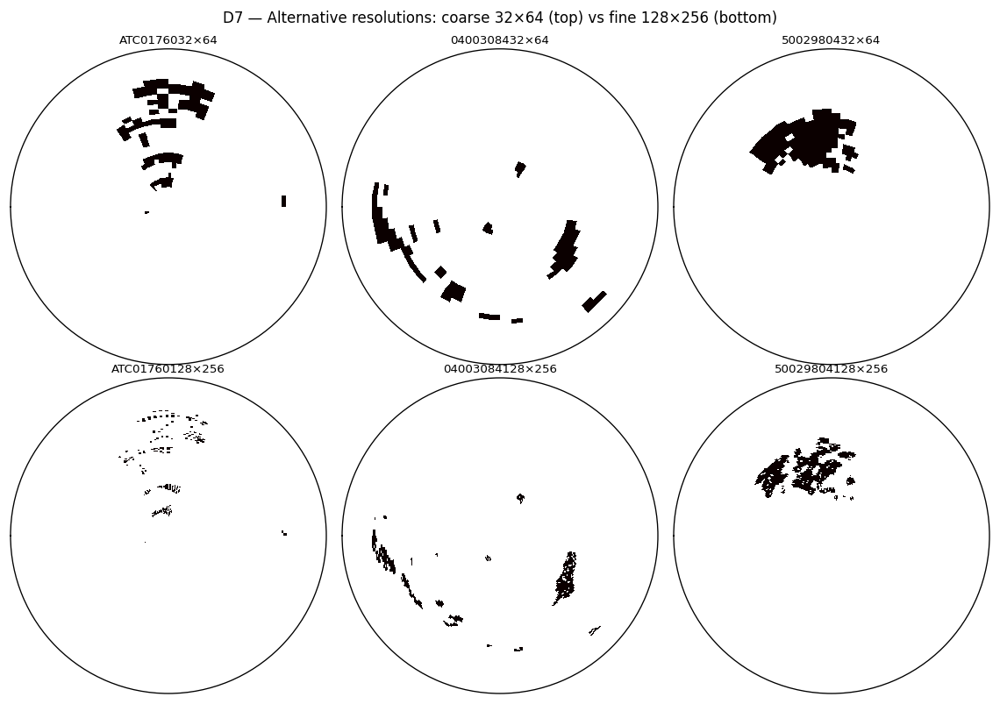

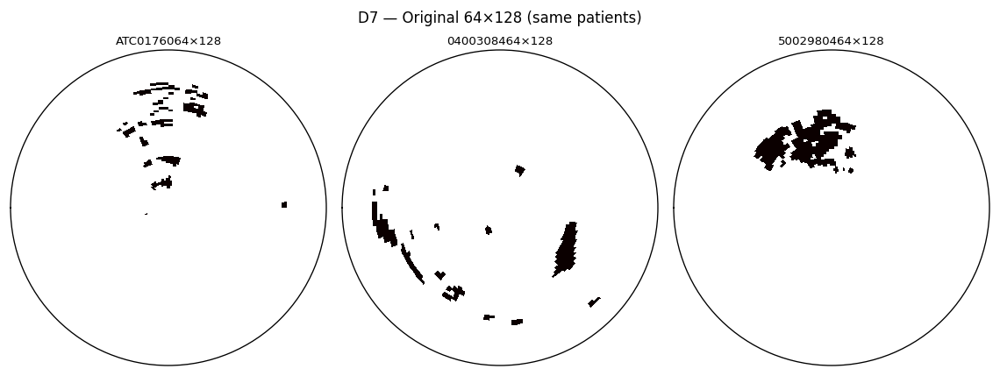

C:\Users\joan\AppData\Local\Temp\ipykernel_13936\2264757500.py:187: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_d7c.tight_layout()


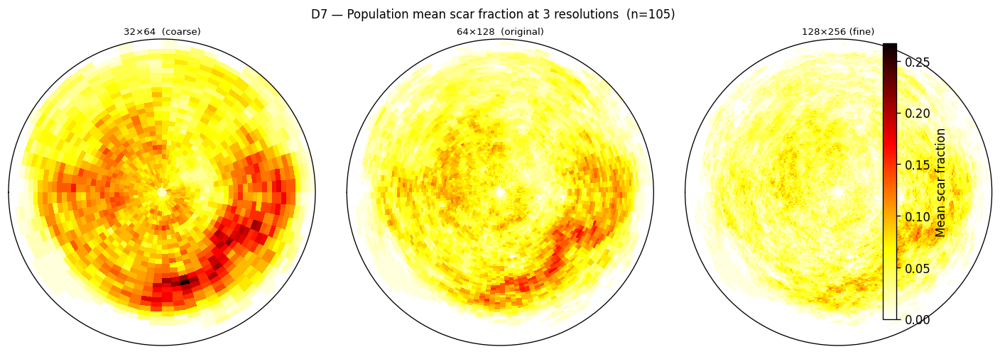


D7 stability check — population mean scar burden:
  32×64  (coarse)                 mean=0.0757  std=0.0419  max=0.2667
  64×128  (original)              mean=0.0512  std=0.0314  max=0.1714
  128×256 (fine)                  mean=0.0326  std=0.0233  max=0.1429


In [40]:
# D7 - Resolution sensitivity  (analysis only, N_R / N_THETA unchanged)
_D7_COARSE = (32,  64)
_D7_FINE   = (128, 256)
_D7_ORIG   = (64,  128)
_D7_NCASES = 3   # individual patients to display

pmaps = globals().get('pmaps', {})
if not pmaps:
    pmaps = {}
    for _case in tqdm(known, desc='D7 build pmaps'):
        _key = f'{_case.year}/{_case.patient_id}'
        try:
            _m = _polar_map_for_case(_case, use_rv=True)
            if _m is not None:
                pmaps[_key] = _m.astype(float)
        except Exception as _exc:
            print(f'  skip {_key}: {_exc}')

if not pmaps:
    print('No polar maps available for D7. Run the setup/import cells and check cohort cases.')
else:
    # ------------------------------------------------------------------ #
    # Pick cases with non-trivial scar                                    #
    # ------------------------------------------------------------------ #
    _d7_show_keys = [
        k for k, pm in pmaps.items()
        if np.asarray(pm, float).mean() > 0.01
    ][:_D7_NCASES]
    if len(_d7_show_keys) < _D7_NCASES:
        _d7_show_keys = list(pmaps.keys())[:_D7_NCASES]

    _d7_case_map = {
        f'{c.year}/{c.patient_id}': c for c in known
    }

    # ------------------------------------------------------------------ #
    # Helper: generic bullseye renderer for any (n_r, n_theta)           #
    # ------------------------------------------------------------------ #
    def _d7_bullseye(ax, arr, title, cmap='hot_r', vmax=None):
        n_r_, n_t_ = arr.shape
        T_, R_ = np.meshgrid(
            np.linspace(0, 2 * np.pi, n_t_ + 1),
            np.linspace(0, 1.0,       n_r_ + 1),
        )
        arr_plot = np.where(np.isfinite(arr), arr, 0.0)
        vmax_ = vmax if vmax is not None else max(arr_plot.max(), 1e-9)
        m = ax.pcolormesh(T_, R_, arr_plot, cmap=cmap, vmin=0, vmax=vmax_,
                          shading='flat')
        ax.set_theta_zero_location('W')
        ax.set_theta_direction(-1)
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_title(title, fontsize=8, pad=4)
        return m

    def _d7_vertex_map_for_case(case, n_r, n_theta):
        shell = best_shell(case)
        cz = get_cz_mesh(case)
        rv = best_rv_mesh(case)
        if shell is None or cz is None:
            raise ValueError('missing shell or CZ')
        if rv is not None:
            ref_fn = lambda mesh, ax, ap, rv=rv: rv_reference_from_rv_mesh(mesh, rv, ax, ap)
            geom = prepare_polar_geometry(shell, ref_fn=ref_fn, rv_mesh=rv)
        else:
            geom = prepare_polar_geometry(shell, rv_mesh=None)
        theta, s = project_points_to_polar(np.asarray(cz.points), geom)
        theta = (2.0 * np.pi - theta) % (2.0 * np.pi)
        return _polar_mask(theta, s, n_r, n_theta).astype(float)

    # ------------------------------------------------------------------ #
    # Recompute maps at coarse and fine for the 3 display cases          #
    # ------------------------------------------------------------------ #
    _d7_maps = {}   # key -> {res_label: (n_r, n_theta, array)}
    for _key in _d7_show_keys:
        _case = _d7_case_map.get(_key)
        if _case is None:
            continue
        _d7_maps[_key] = {}
        for _nr, _nt in [_D7_COARSE, _D7_FINE]:
            try:
                _d7_maps[_key][(_nr, _nt)] = _d7_vertex_map_for_case(_case, _nr, _nt)
            except Exception as _exc:
                print(f'  skip {_key} at {_nr}x{_nt}: {_exc}')
        # original from pmaps (already binary float)
        _d7_maps[_key][_D7_ORIG] = np.asarray(pmaps[_key], float)

    # ------------------------------------------------------------------ #
    # Figure 1: 2 alt configs x 3 patients  (6 polar maps)              #
    # ------------------------------------------------------------------ #
    _d7_cases_avail = [k for k in _d7_show_keys if k in _d7_maps]
    _d7_nc = len(_d7_cases_avail)

    if _d7_nc:
        fig_d7a, axes_d7a = plt.subplots(
            2, _d7_nc,
            figsize=(_d7_nc * 3.2, 6.8),
            subplot_kw={'projection': 'polar'},
        )
        if _d7_nc == 1:
            axes_d7a = axes_d7a[:, np.newaxis]
        fig_d7a.suptitle(
            'D7 — Alternative resolutions: coarse 32×64 (top) vs fine 128×256 (bottom)',
            fontsize=10,
        )
        for _ci, _key in enumerate(_d7_cases_avail):
            _pid = _key.split('/')[-1]
            for _ri, _res in enumerate([_D7_COARSE, _D7_FINE]):
                _arr = _d7_maps[_key].get(_res)
                _label = f'{_pid}{_res[0]}×{_res[1]}'
                if _arr is not None:
                    _d7_bullseye(axes_d7a[_ri, _ci], _arr, _label, cmap='hot_r', vmax=1.0)
                else:
                    axes_d7a[_ri, _ci].set_title(f'{_pid}failed', fontsize=8)
        fig_d7a.tight_layout()
        plt.savefig(OUT / 'D7_alt_resolutions_6maps.png', bbox_inches='tight', dpi=150)
        plt.show()

    # ------------------------------------------------------------------ #
    # Figure 2: original 64x128 for same 3 patients                     #
    # ------------------------------------------------------------------ #
    if _d7_nc:
        fig_d7b, axes_d7b = plt.subplots(
            1, _d7_nc,
            figsize=(_d7_nc * 3.2, 3.6),
            subplot_kw={'projection': 'polar'},
        )
        if _d7_nc == 1:
            axes_d7b = [axes_d7b]
        fig_d7b.suptitle('D7 — Original 64×128 (same patients)', fontsize=10)
        for _ci, _key in enumerate(_d7_cases_avail):
            _pid = _key.split('/')[-1]
            _arr = _d7_maps[_key].get(_D7_ORIG)
            if _arr is not None:
                _d7_bullseye(axes_d7b[_ci], _arr, f'{_pid}64×128', cmap='hot_r', vmax=1.0)
            else:
                axes_d7b[_ci].set_title(f'{_pid}N/A', fontsize=8)
        fig_d7b.tight_layout()
        plt.savefig(OUT / 'D7_original_64x128.png', bbox_inches='tight', dpi=150)
        plt.show()

    # ------------------------------------------------------------------ #
    # Figure 3: population mean at all 3 resolutions                    #
    # ------------------------------------------------------------------ #
    _d7_pop = {}
    for _nr, _nt in [_D7_COARSE, _D7_ORIG, _D7_FINE]:
        _stack = []
        for _case in tqdm(known, desc=f'D7 pop mean {_nr}x{_nt}', leave=False):
            _key = f'{_case.year}/{_case.patient_id}'
            if _key not in pmaps:
                continue
            if (_nr, _nt) == _D7_ORIG:
                _stack.append(np.asarray(pmaps[_key], float))
            else:
                try:
                    _stack.append(_d7_vertex_map_for_case(_case, _nr, _nt))
                except Exception:
                    pass
        if _stack:
            _d7_pop[(_nr, _nt)] = np.stack(_stack).mean(axis=0)

    _d7_res_labels = [
        (_D7_COARSE, '32×64  (coarse)'),
        (_D7_ORIG,   '64×128  (original)'),
        (_D7_FINE,   '128×256 (fine)'),
    ]
    _d7_avail_pop = [x for x in _d7_res_labels if x[0] in _d7_pop]

    if _d7_avail_pop:
        fig_d7c, axes_d7c = plt.subplots(
            1, len(_d7_avail_pop),
            figsize=(len(_d7_avail_pop) * 4.0, 4.2),
            subplot_kw={'projection': 'polar'},
        )
        if len(_d7_avail_pop) == 1:
            axes_d7c = [axes_d7c]
        _vmax_pop = max(
            float(np.nanmax(_d7_pop[k])) for k, _ in _d7_avail_pop
        )
        fig_d7c.suptitle(
            f'D7 — Population mean scar fraction at 3 resolutions  (n={len(pmaps)})',
            fontsize=10,
        )
        for _ax, (_res, _lbl) in zip(axes_d7c, _d7_avail_pop):
            _m = _d7_bullseye(_ax, _d7_pop[_res], _lbl, cmap='hot_r', vmax=_vmax_pop)
        plt.colorbar(_m, ax=axes_d7c, fraction=0.025, pad=0.08,
                     label='Mean scar fraction')
        fig_d7c.tight_layout()
        plt.savefig(OUT / 'D7_population_mean_3resolutions.png', bbox_inches='tight', dpi=150)
        plt.show()

    # ------------------------------------------------------------------ #
    # Stability check: per-resolution mean scar burden (scalar)         #
    # ------------------------------------------------------------------ #
    print('\nD7 stability check — population mean scar burden:')
    for _res, _lbl in _d7_avail_pop:
        _pm = _d7_pop[_res]
        print(f'  {_lbl:30s}  mean={_pm.mean():.4f}  std={_pm.std():.4f}  max={_pm.max():.4f}')
